In [1]:
%matplotlib inline
import os, shutil
import matplotlib.pyplot as plt
import numpy as np
import scipy.io as scio
from scipy.fft import fft, ifft, fftfreq
from scipy.signal import stft, ricker, cwt
import pywt
from tqdm import tqdm
import pandas as pd
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

from sklearn.model_selection import train_test_split
from sklearn import datasets

import torch

KeyboardInterrupt: 

In [2]:
mode = 'notebook' #notebook, commit, colab

import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.offline import iplot


from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

if mode == 'colab':
    import cufflinks as cf
    cf.go_offline()
    init_notebook_mode(connected=False)

    def configure_plotly_browser_state():
        import IPython
        display(IPython.core.display.HTML('''
          <script src="/static/components/requirejs/require.js"></script>
          <script>
            requirejs.config({
              paths: {
                base: '/static/base',
                plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
              },
            });
          </script>
          '''))

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio

if mode == 'commit':
    pio.renderers.default = "png"


# Dataset Analysis

In [3]:
def load_data(filepath):
    sample_matlab_data = scio.loadmat(filepath)  # Structured Matlab Array containing all information
    return sample_matlab_data

basedir = 'DataFiles'

In [4]:
patient_data = []
for file in os.listdir(basedir):
    filepath = os.path.join(basedir, file)
    patient_data.append(load_data(filepath))
    
print(len(patient_data))

8


In [5]:
patient_data[0]

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN, Created on: Tue Nov 25 12:46:00 2014',
 '__version__': '1.0',
 '__globals__': [],
 'data': array([[(array([[array(['Fz'], dtype='<U2'), array(['Cz'], dtype='<U2'),
                 array(['Pz'], dtype='<U2'), array(['Oz'], dtype='<U2'),
                 array(['P3'], dtype='<U2'), array(['P4'], dtype='<U2'),
                 array(['PO7'], dtype='<U3'), array(['PO8'], dtype='<U3')]],
               dtype=object), array([[ -1.21978372,  -0.32769319,  -1.21995831, ...,  -2.65680554,
                   7.37202505,  -0.27890203],
                [ -1.42616224,  -4.18996393,  -5.65458822, ...,  -9.45534598,
                  -3.67053188,  -5.48506363],
                [ -1.31524453,  -6.87075831,  -8.55992067, ..., -14.26798757,
                 -11.63200572,  -8.92900433],
                ...,
                [ -3.96511643,   5.70748743,   1.11047492, ...,  -5.27998942,
                   9.13724881,  -0.85580654],
                [ -0

In [6]:
def get_channel_name(patient, index):
    return patient['data'][0][0]['channels'][0][index]
print(get_channel_name(patient_data[0], 1))

['Cz']


In [150]:
def get_channel_index(patient, channel_name):
    indices = [data[0].lower() for data in patient['data'][0][0]['channels'][0]]
    return indices.index(channel_name.lower())
print(get_channel_index(patient_data[0], 'Fz'))

0


In [7]:
print(patient_data[0]['data'][0][0]['X'].shape)
print(patient_data[0]['data'][0][0]['y'].shape)
print(patient_data[0]['data'][0][0]['y_stim'].shape)

(347704, 8)
(347704, 1)
(347704, 1)


In [8]:
np.concatenate([patient_data[0]['data'][0][0]['X'][0:2], patient_data[0]['data'][0][0]['X'][5:7]], axis=0).shape

(4, 8)

### Calculate Trial data for each patient

In [9]:
# Functions for EEG data extraction and manipulation

sample_frequency = 256 #Hz
bandpass_filter = (0, 30) # Hz
stimulus_duration = 125 #ms
interstimulus_interval = 125 #ms
total_stimulus = 12 # 6 rows and 6 columns
number_of_times_each_stimulus_appeared_per_trial = 10
total_stimulus_appeared_per_trial = total_stimulus * number_of_times_each_stimulus_appeared_per_trial

trial_duration = (stimulus_duration * total_stimulus_appeared_per_trial) + \
(interstimulus_interval * (total_stimulus_appeared_per_trial- 1))

samples_per_trial = (sample_frequency * trial_duration)//1000

print(f"Each trial duration: {trial_duration} ms or {samples_per_trial} samples")

Each trial duration: 29875 ms or 7648 samples


In [10]:
def get_trials(sample, remove_calibration_data=True):
    data = sample['data'][0][0]
    signal = data['X']
    stimulus = data['y_stim']
    target = data['y']
    
    x, y_stimulus, y_target = [], [], []
#     trial_start = 0
    for i in range(data['trial'].shape[1]):
        trial_start = data['trial'][0, i]
        trial_end = trial_start+samples_per_trial
            
            
        # Fetch signal
        x.append(signal[trial_start:trial_end])
        # Fetch stimulus
        y_stimulus.append(stimulus[trial_start:trial_end, 0])
        # Fetch target
        y_target.append(target[trial_start:trial_end, 0])

    x, y_stimulus, y_target = np.array(x), np.array(y_stimulus), np.array(y_target)
    if remove_calibration_data:
        x, y_stimulus, y_target = x[3:], y_stimulus[3:], y_target[3:]
    return x, y_stimulus, y_target

X, y_stim, y_target = get_trials(patient_data[0])
print(X.shape, y_stim.shape, y_target.shape)
print(np.unique(y_stim))
print(np.unique(y_target))

(32, 7648, 8) (32, 7648) (32, 7648)
[ 0  1  2  3  4  5  6  7  8  9 10 11 12]
[0 1 2]


### Get data for each patient

In [130]:

number_of_trials_per_run = 5 # each run is a word and each trial is a character of the word
number_of_runs = 7 # total number of words

total_characters_with_calibration = number_of_trials_per_run * number_of_runs
total_characters_without_calibration = number_of_trials_per_run * number_of_runs - 3

def get_dataset(dataset):
    """
    Returns: Numpy array -> input shape: (patient_id, run, trial, sample, channels), 
             stimulus -> (patient_id, run, trial, sample)
             target -> (patient_id, run, trial, sample)
    """
    x, y_stim, y_target = [], [], []
    for i in range(len(dataset)):
        patient = dataset[i]
        x_trial, y_stim_trial, y_target_trial = get_trials(patient, remove_calibration_data=False)
        
        # Reshape array to group trials by run
        x_trial = x_trial.reshape(-1, number_of_trials_per_run, x_trial.shape[1], x_trial.shape[2])
        y_stim_trial  = y_stim_trial.reshape(-1, number_of_trials_per_run, y_stim_trial.shape[1])
        y_target_trial = y_target_trial.reshape(-1, number_of_trials_per_run, y_target_trial.shape[1])
        
        # Add to array
        x.append(x_trial)
        y_stim.append(y_stim_trial)
        y_target.append(y_target_trial)
        
    return np.array(x), np.array(y_stim), np.array(y_target)
        
        
X, y_stim, y_target = get_dataset(patient_data)

print(X.shape, y_stim.shape, y_target.shape)
print(np.unique(y_stim))
print(np.unique(y_target))

(8, 7, 5, 7648, 8) (8, 7, 5, 7648) (8, 7, 5, 7648)
[ 0  1  2  3  4  5  6  7  8  9 10 11 12]
[0 1 2]


### Mapping for row/column value to character

In [12]:
words =np.array([chr(i) for i in range(ord('A'), ord('Z')+1)] + [str(i) for i in range(1, 10)] + ['-'])
word_matrix = np.reshape(words, (6, 6))
word_matrix_row = np.arange(7, 13)
word_matrix_column = np.arange(1, 7)
print(word_matrix)
word_to_tup = {}
tup_to_word = {}
for i in range(word_matrix.shape[0]):
    for j in range(word_matrix.shape[1]):
        tup = (word_matrix_row[i], word_matrix_column[j])
        word_to_tup[word_matrix[i, j]] = tup
        tup_to_word[str(tup[0]) + "," + str(tup[1])] = word_matrix[i, j]
        
print("\nCharacter to indices")
print(word_to_tup)
print("\n Indices to Characters")
print(tup_to_word)

[['A' 'B' 'C' 'D' 'E' 'F']
 ['G' 'H' 'I' 'J' 'K' 'L']
 ['M' 'N' 'O' 'P' 'Q' 'R']
 ['S' 'T' 'U' 'V' 'W' 'X']
 ['Y' 'Z' '1' '2' '3' '4']
 ['5' '6' '7' '8' '9' '-']]

Character to indices
{'A': (7, 1), 'B': (7, 2), 'C': (7, 3), 'D': (7, 4), 'E': (7, 5), 'F': (7, 6), 'G': (8, 1), 'H': (8, 2), 'I': (8, 3), 'J': (8, 4), 'K': (8, 5), 'L': (8, 6), 'M': (9, 1), 'N': (9, 2), 'O': (9, 3), 'P': (9, 4), 'Q': (9, 5), 'R': (9, 6), 'S': (10, 1), 'T': (10, 2), 'U': (10, 3), 'V': (10, 4), 'W': (10, 5), 'X': (10, 6), 'Y': (11, 1), 'Z': (11, 2), '1': (11, 3), '2': (11, 4), '3': (11, 5), '4': (11, 6), '5': (12, 1), '6': (12, 2), '7': (12, 3), '8': (12, 4), '9': (12, 5), '-': (12, 6)}

 Indices to Characters
{'7,1': 'A', '7,2': 'B', '7,3': 'C', '7,4': 'D', '7,5': 'E', '7,6': 'F', '8,1': 'G', '8,2': 'H', '8,3': 'I', '8,4': 'J', '8,5': 'K', '8,6': 'L', '9,1': 'M', '9,2': 'N', '9,3': 'O', '9,4': 'P', '9,5': 'Q', '9,6': 'R', '10,1': 'S', '10,2': 'T', '10,3': 'U', '10,4': 'V', '10,5': 'W', '10,6': 'X', '11,1': '

In [13]:
target_class = 2
non_target_class = 1
def convert_stimulus_to_word(y_stim, y_target):
    """
    Input shape: (Patients, run, trial, samples)
    Output shape: (Patients, run, trial, character)
    """
    y_stim = y_stim.reshape(-1)
    y_target = y_target.reshape(-1)
    target_stimulus = y_stim[y_target == target_class ]
    vals = []
    for i in range(len(target_stimulus)):
        if len(vals) == 0 or  vals[-1] != target_stimulus[i]:
            vals.append(target_stimulus[i])

    character_indices = []
    characters = []
    for i in range(0, len(vals)-1, 2):
        c = vals[i]
        r = vals[i+1]
        character_indices.append((r, c))
        characters.append(tup_to_word[str(r) + "," + str(c)])
    
    non_repeating_chars = []
    for c in characters:
        if len(non_repeating_chars) == 0 or non_repeating_chars[-1] != c:
            non_repeating_chars.append(c)
    
    words = []
    for i in range(0, len(non_repeating_chars), 5):
        words.append(''.join(non_repeating_chars[i:i+5]))
    return words

for i in range(X.shape[0]):
    print(f"Words displayed to patient: {i+1}")
    print(convert_stimulus_to_word(y_stim[0], y_target[0]))

    

Words displayed to patient: 1
['WGAMN', 'F7ODY', 'KPUAB', 'AJOCY', 'IJYVN', 'O6A7Y', 'GPD']
Words displayed to patient: 2
['WGAMN', 'F7ODY', 'KPUAB', 'AJOCY', 'IJYVN', 'O6A7Y', 'GPD']
Words displayed to patient: 3
['WGAMN', 'F7ODY', 'KPUAB', 'AJOCY', 'IJYVN', 'O6A7Y', 'GPD']
Words displayed to patient: 4
['WGAMN', 'F7ODY', 'KPUAB', 'AJOCY', 'IJYVN', 'O6A7Y', 'GPD']
Words displayed to patient: 5
['WGAMN', 'F7ODY', 'KPUAB', 'AJOCY', 'IJYVN', 'O6A7Y', 'GPD']
Words displayed to patient: 6
['WGAMN', 'F7ODY', 'KPUAB', 'AJOCY', 'IJYVN', 'O6A7Y', 'GPD']
Words displayed to patient: 7
['WGAMN', 'F7ODY', 'KPUAB', 'AJOCY', 'IJYVN', 'O6A7Y', 'GPD']
Words displayed to patient: 8
['WGAMN', 'F7ODY', 'KPUAB', 'AJOCY', 'IJYVN', 'O6A7Y', 'GPD']


# High level overview of the dataset

First we will visualize the EEG signals collected from different patients. We will do a visual inspection to see some of the characteristics of the dataset e.g. what are the minimum and maximum amplitude of the signals for different patients, are there any visible artifacts in the signal, etc.

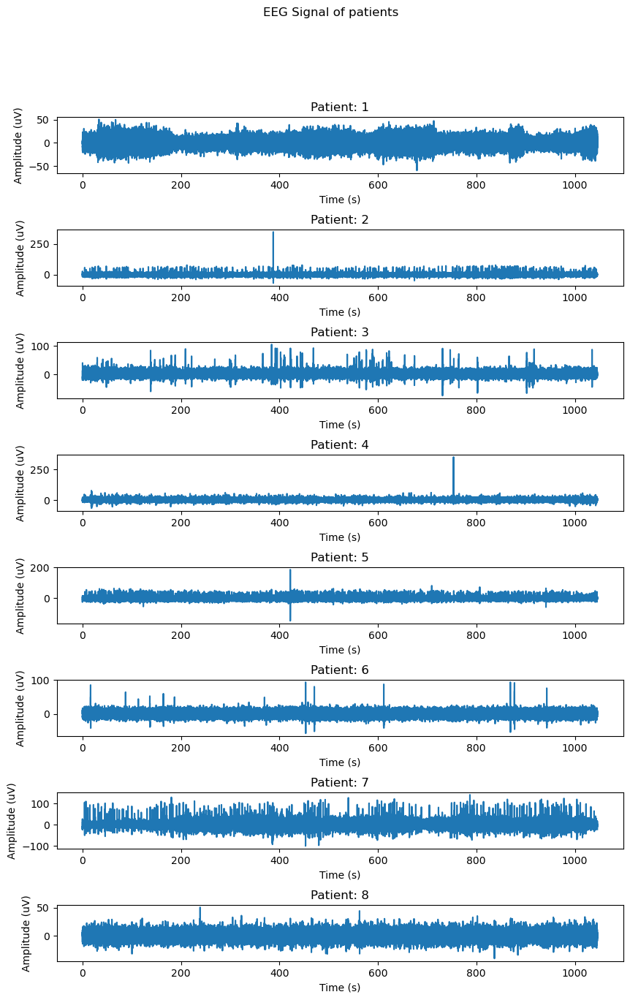

In [132]:
cols = 1
rows = X.shape[0]

fig, ax = plt.subplots(rows, cols, figsize=(10, 15))
plt.suptitle(f"EEG Signal of patients")
for i in range(X.shape[0]):
    ax[i].set_title(f"Patient: {i+1}")
    d = X[i, :, :, :, 0].reshape(-1)
    ax[i].plot(np.linspace(0, d.size/sample_frequency, d.size), d)
    ax[i].set_xlabel("Time (s)")    
    ax[i].set_ylabel("Amplitude (uV)")
plt.subplots_adjust(hspace=1)
plt.show()

## Removing Artifacts

The average peak of EEG amplitude is usually 20-100 uV. Most EEG signals are within this range. However, if we look at the EEG signal of patient 2 and 4, we can see two peaks that reach about 250uV. These peaks are unusually large and may have occured as a result of some external factor. These peaks will be outliers in our dataset and impact the distribution of the data. Let us take a look at the histogram of the amplitude of the EEG signals.

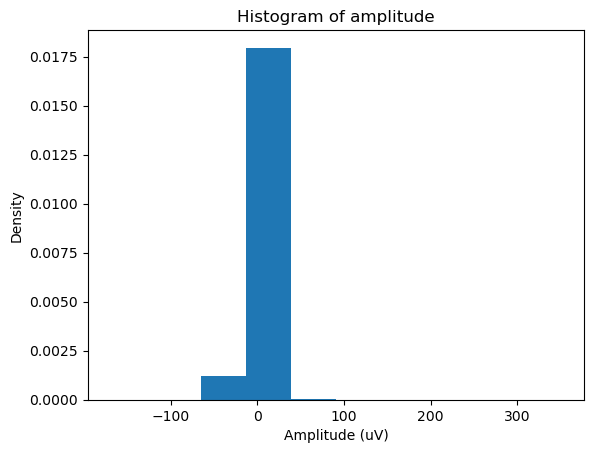

In [133]:
plt.figure()
plt.title("Histogram of amplitude")
plt.hist(X.reshape(-1), density=True)
plt.xlabel("Amplitude (uV)")
plt.ylabel("Density")
plt.show()

We can see that most of the amplitudes are within an acceptable range of -100uV to 100uV. However, the distribution has some amplitudes that extend beyond that range. To find the outliers let us calculate the mean and standard deviation of the distribution.

In [134]:
print(f"Mean: {X.mean():.5f} uV")
print(f"Standard Deviation: {X.std():.5f} uV")
print(f"99.999th Percentil: {np.percentile(X, 99.999):.5f} uV")

Mean: -0.00035 uV
Standard Deviation: 9.53127 uV
99.999th Percentil: 133.01085 uV


We can see that the mean of the distribution is 0uV and the standard deviation is 9.5uV. That means most of the EEG signal is within -9uV to 9uV. The 99.999th percentile of the amplitude is between -133uV to 133uV. The peak amplitude of an action potential is usually around 100uV. As a result, to remove the outliers we will keep the amplitude values that lie within -100uV to 100uV and clip the signal beyond that range so that they are either -100uV (negative) or 100uV (positive).

In [136]:
def remove_artifacts(x, min_voltage, max_voltage, clip_voltage):
    x_temp = x.reshape(-1)
    indices = np.where(x_temp < min_voltage)[0]
    x_temp[indices] = -clip_voltage
    indices = np.where(x_temp > max_voltage)[0]
    x_temp[indices] = clip_voltage
    return x_temp.reshape(x.shape)
X = remove_artifacts(X, -100, 100, 100)
print(X.shape)

(8, 7, 5, 7648, 8)


In [189]:
def get_probability_of_amplitude(density, bins, spike_range_min, spike_range_max, consider_negative=False):
    
    indices = np.where( (bins > spike_range_min) & (bins < spike_range_max) )[0]
    indices = indices[indices < density.size]
    prob = np.sum(density[indices])/(spike_range_max - spike_range_min)
    
    if consider_negative:
        indices = np.where( (bins > -spike_range_max) & (bins < -spike_range_min) )[0]
        indices = indices[indices < density.size]
        prob = prob + np.sum(density[indices])/(spike_range_max - spike_range_min)
    return prob


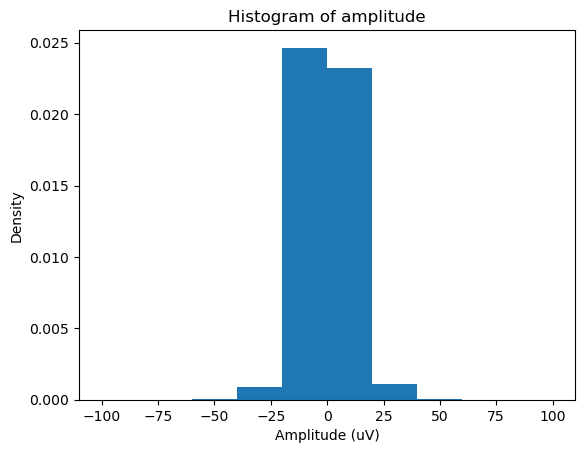

Probability of amplitude within 50-100uV is: 0.0001211%


In [191]:
plt.figure()
plt.title("Histogram of amplitude")
n, b, p = plt.hist(X.reshape(-1), density=True)
plt.xlabel("Amplitude (uV)")
plt.ylabel("Density")
plt.show()
print(f"Probability of amplitude within 50-100uV is: {get_probability_of_amplitude(n, b, 50, 100, consider_negative=True)*100:.7f}%")

In [138]:
print(f"Mean: {X.mean():.5f} uV")
print(f"Standard Deviation: {X.std():.5f} uV")
print(f"99.999th Percentil: {np.percentile(X, 99.999):.5f} uV")


Mean: -0.00164 uV
Standard Deviation: 9.50165 uV
99.999th Percentil: 100.00000 uV


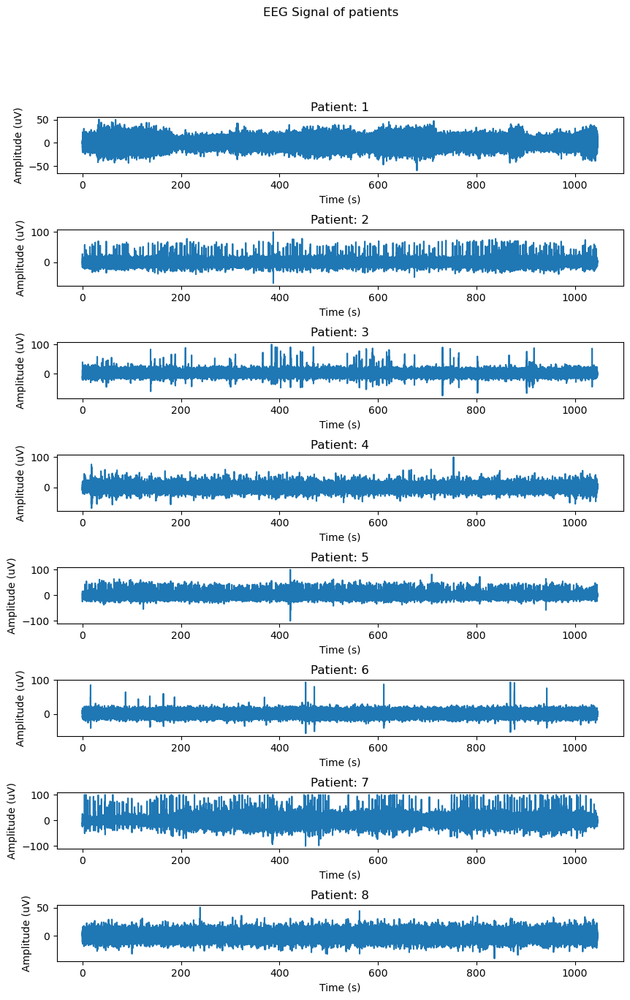

In [139]:
cols = 1
rows = X.shape[0]

fig, ax = plt.subplots(rows, cols, figsize=(10, 15))
plt.suptitle(f"EEG Signal of patients")
for i in range(X.shape[0]):
    ax[i].set_title(f"Patient: {i+1}")
    d = X[i, :, :, :, 0].reshape(-1)
    ax[i].plot(np.linspace(0, d.size/sample_frequency, d.size), d)
    ax[i].set_xlabel("Time (s)")    
    ax[i].set_ylabel("Amplitude (uV)")
plt.subplots_adjust(hspace=1)
plt.show()

## Inspecting EEG from each channel

Now we will take the signal of each individual channel and see if we can find any trends in the signal.

### 1. Frontal Lobe - Reference Electrod (Fz)

In [158]:
channel_name = 'Fz'
channel_index = get_channel_index(patient_data[0], channel_name)
print(f"Mean of signal in '{channel_name}' is {np.mean(X[:, :, :, :, channel_index]):.5f}uV")
print(f"Standard deviation of signal in '{channel_name}' is {np.std(X[:, :, :, :, channel_index]):.5f}uV")
print(f"99.99th percentile of signal in '{channel_name}': {np.percentile(X[:, :, :, :, channel_index], 99.99):.5f}uV")

Mean of signal in 'Fz' is -0.00433uV
Standard deviation of signal in 'Fz' is 10.05399uV
99.99th percentile of signal in 'Fz': 99.28087uV


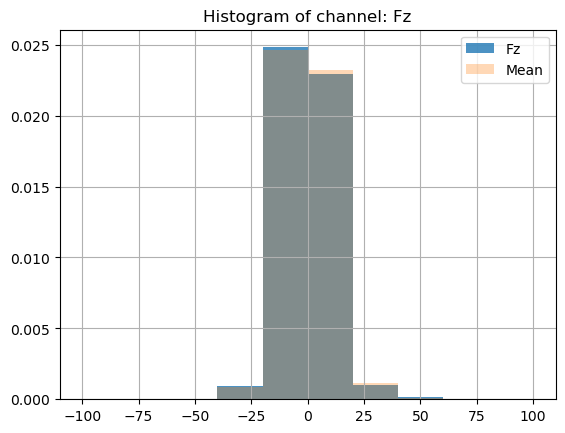

Probability of amplitude  in Fz is: 0.0002486%


In [192]:
plt.figure()
plt.title(f"Histogram of channel: {channel_name}")
n, b, p = plt.hist(X[:, :, :, :, channel_index].reshape(-1), density=True, label=channel_name, alpha=0.8)
plt.hist(X.reshape(-1), density=True, alpha=0.3, label='Mean')
plt.grid()
plt.legend()
plt.show()
print(f"Probability of amplitude  in {channel_name} is: {get_probability_of_amplitude(n, b, 50, 100, consider_negative=True)*100:.7f}%")

We can see that the distribution of Fz is similar to the mean distribution and the mean, standard deviation, and percentile values are value close to the sample data. However, the standard deviation is a little higher than the sample data. 'Fz' is usually considered a reference electrod is it is placed on midline of the skull over corpus callosum. So, it may not reflect or amplify lateral hemispheric cortical activity.

As we can observe from the histogram, the probability of a amplitude being within the range 50-100 uV in this region is below 0.0003\%

# Signal Amplitude Analysis - Channel Specific

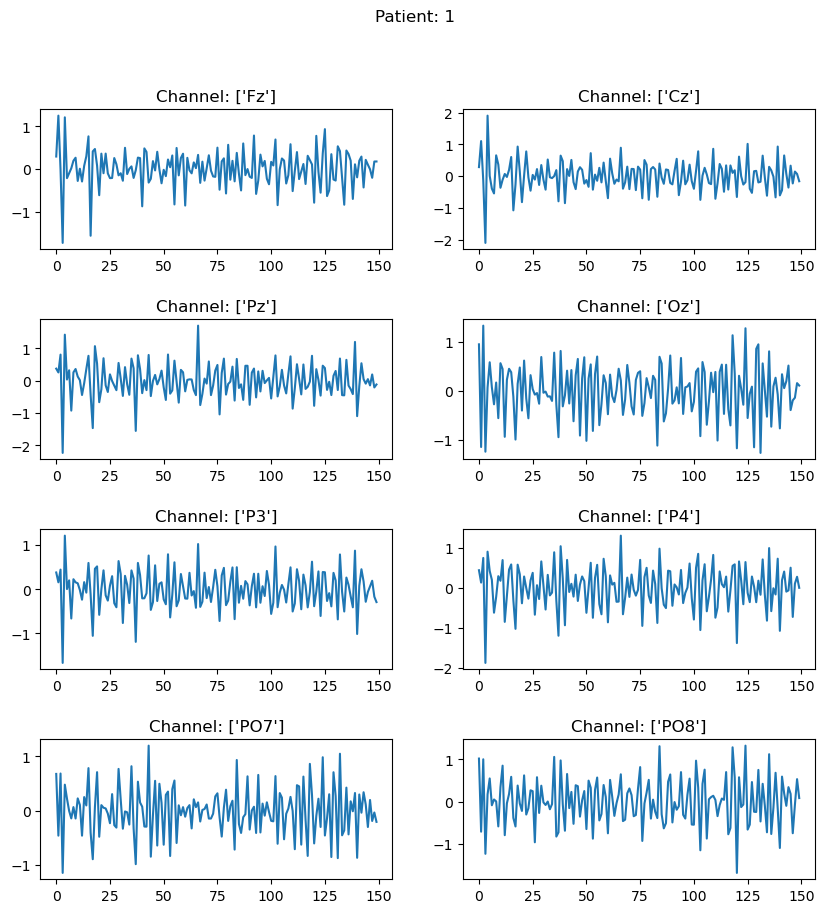

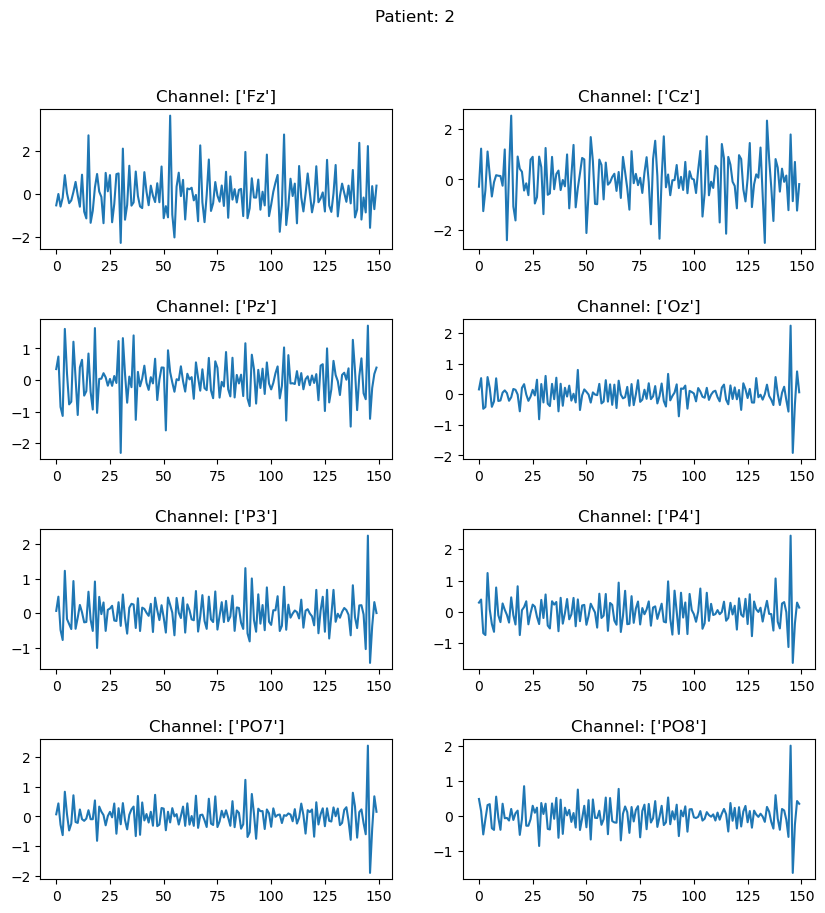

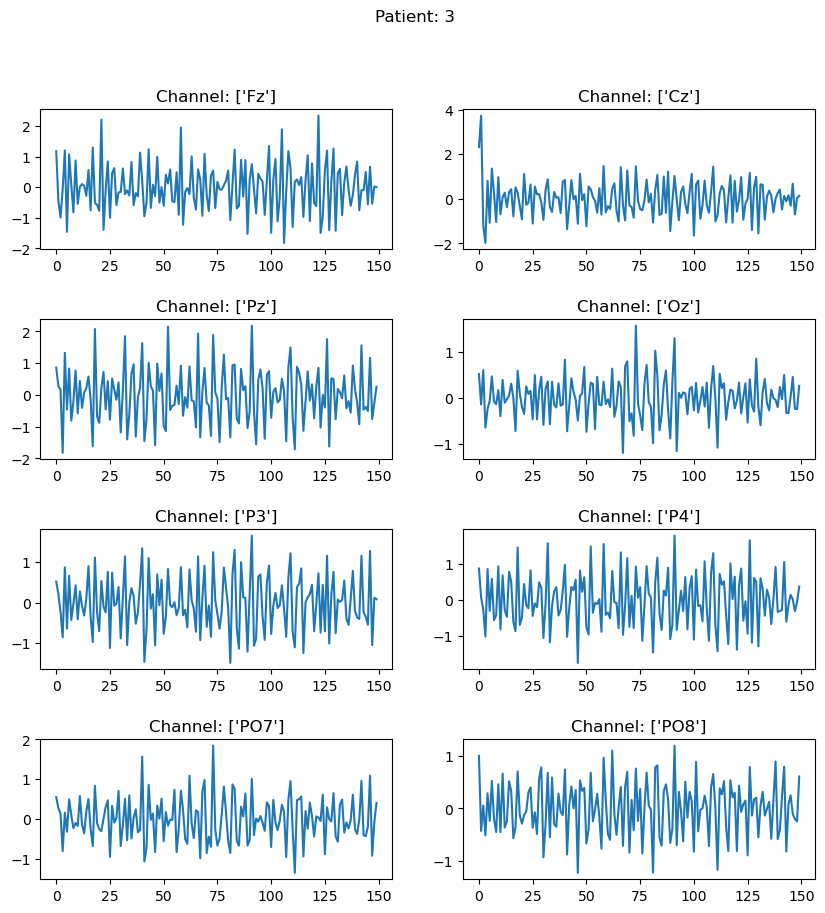

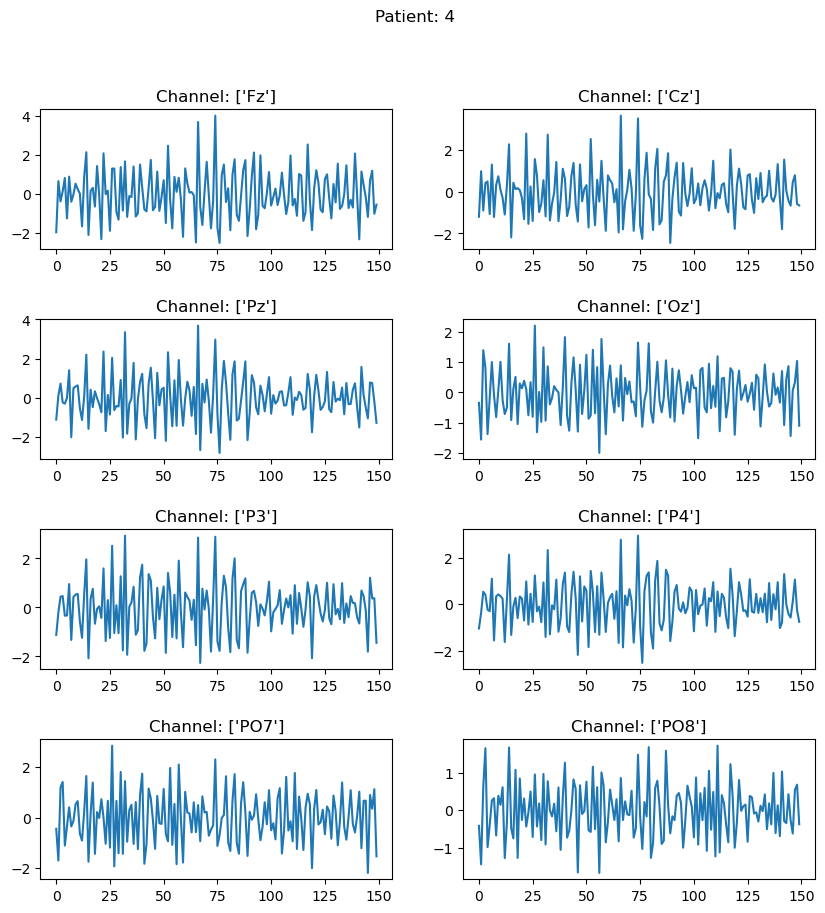

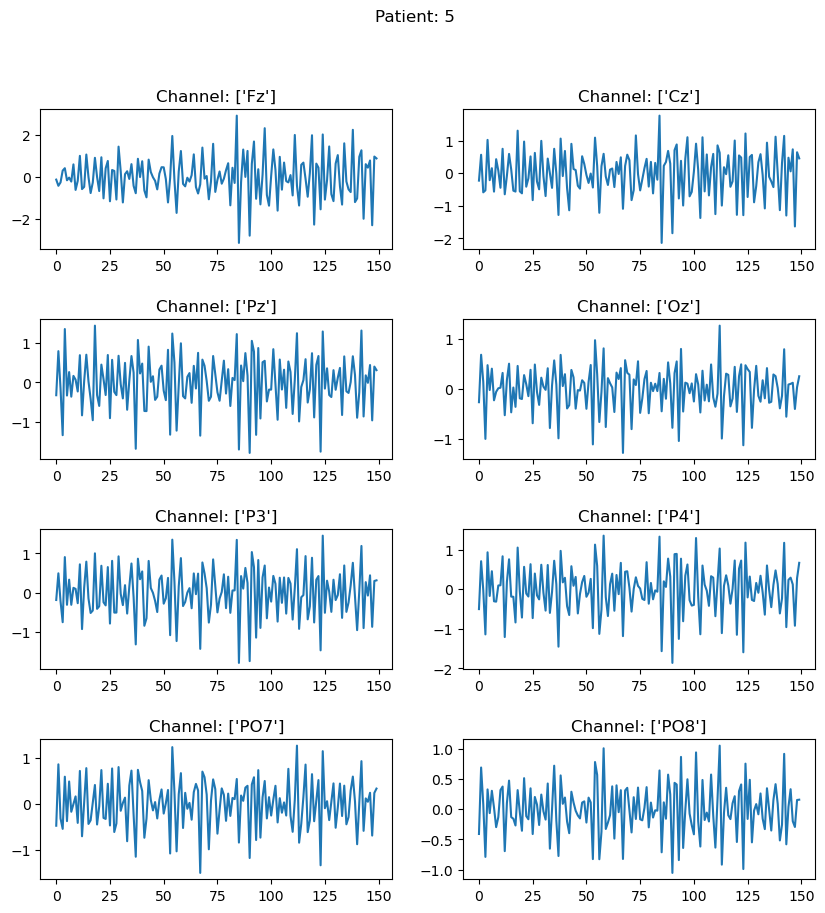

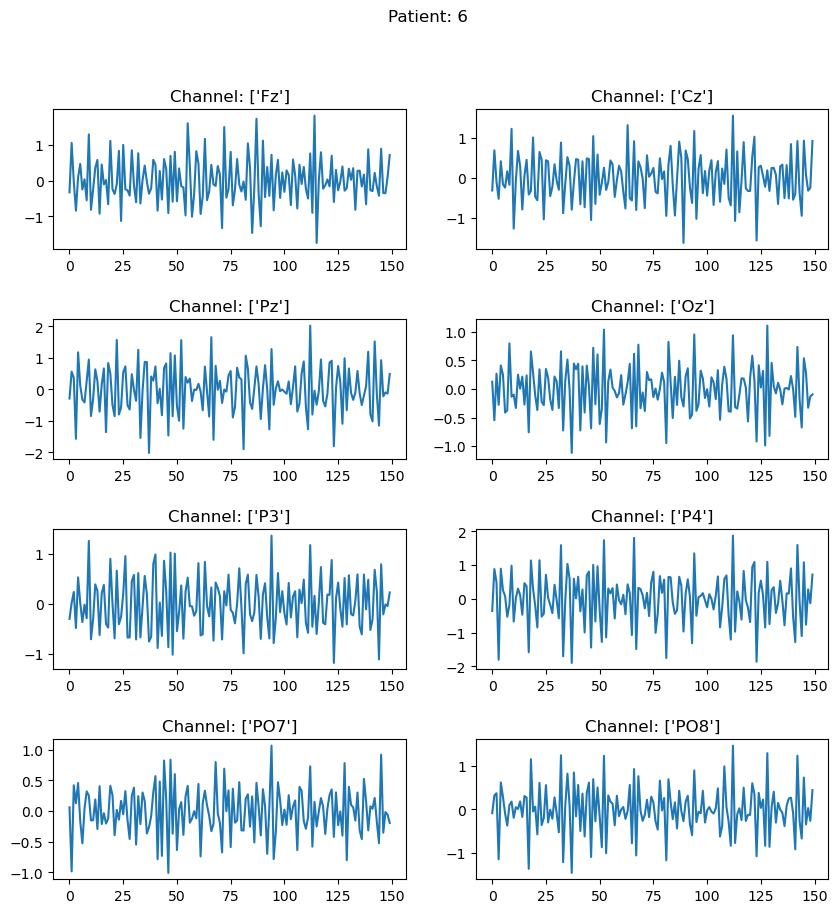

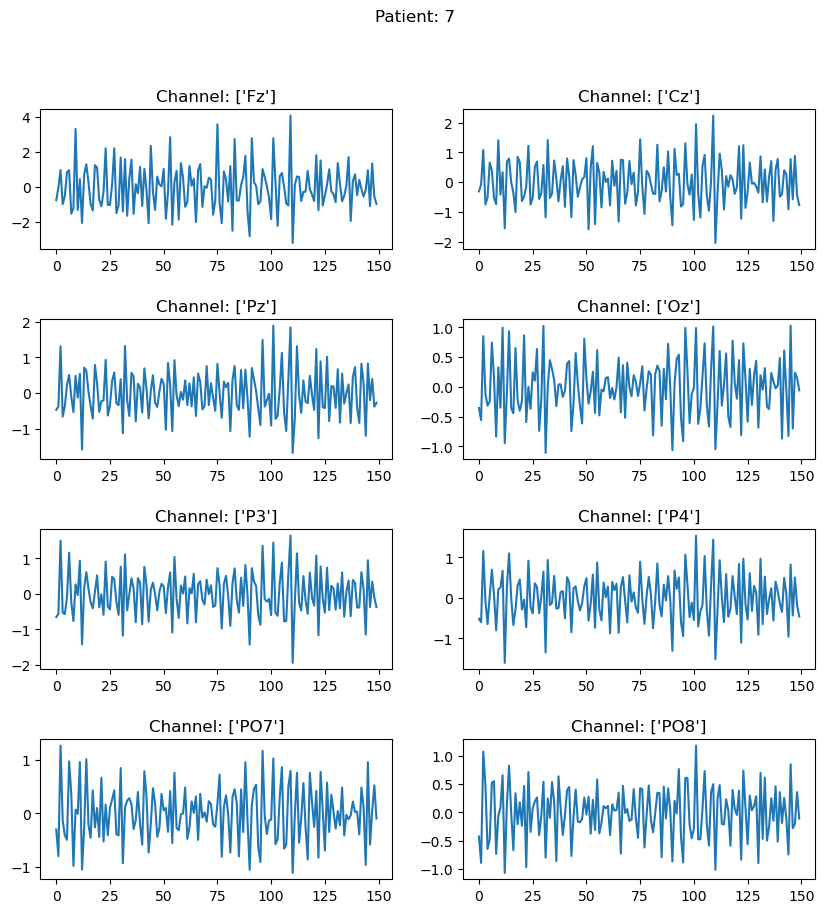

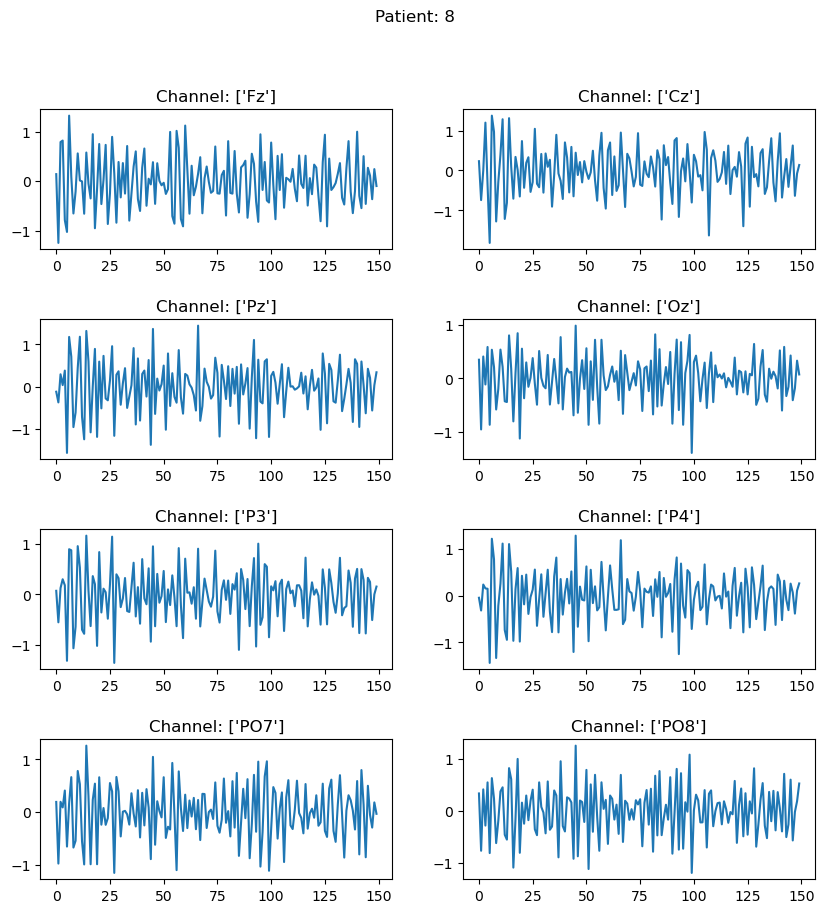

In [14]:
# Visualize channel output
mean_duration = 200 # ms Need to keep it in fraction to get an integer number of samples
mean_samples = int(sample_frequency * mean_duration/1000)
for i in range(X.shape[0]):
    cols = 2
    rows = X.shape[-1]//cols
    if int(rows) != rows:
        rows = int(rows) + 1
    else:
        rows = int(rows)
        
        
    fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
    plt.suptitle(f"Patient: {i+1}")
    current = 0
    mean = X[i].mean(axis=(0, 1))
    for j in range(rows):
        for k in range(cols):
            ax[j, k].set_title(f"Channel: {get_channel_name(patient_data[i], current)}")
            m = [np.mean(mean[z:z+mean_samples, current]) for z in range(0, mean.shape[0], mean_samples)]
            ax[j, k].plot(m)
            current += 1
    plt.subplots_adjust(hspace=0.5)
    plt.show()

## View Average waveform of each channel

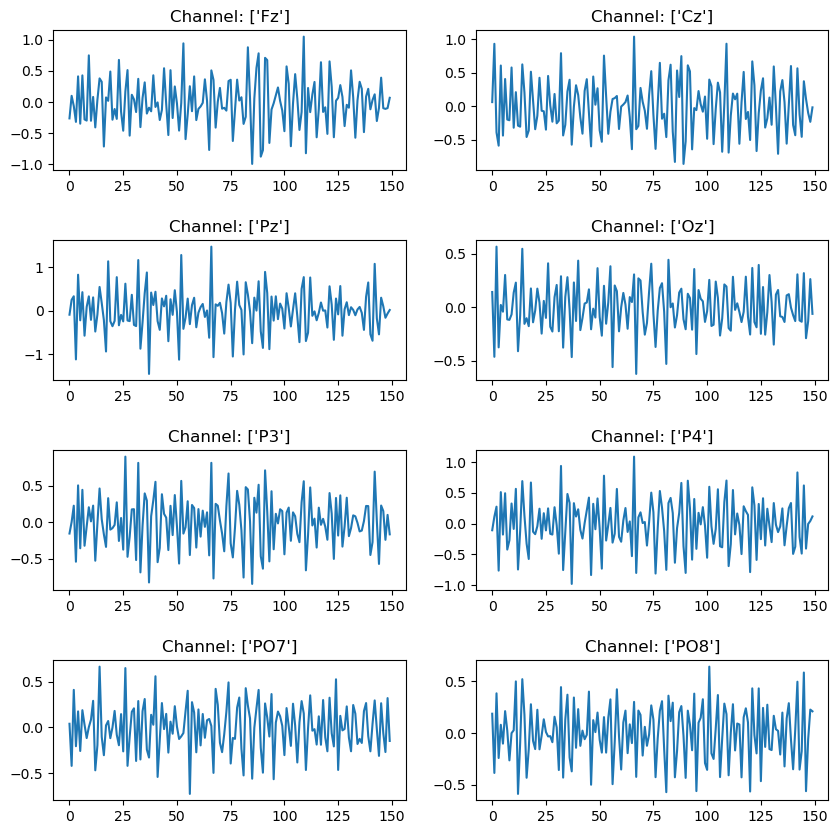

In [15]:
# Visualize channel output
mean_duration = 200 # ms Need to keep it in fraction to get an integer number of samples
mean_samples = int(sample_frequency * mean_duration/1000)
cols = 2
rows = X.shape[-1]//cols
if int(rows) != rows:
    rows = int(rows) + 1
else:
    rows = int(rows)


fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
current = 0
mean = X.mean(axis=(0, 1, 2))
for j in range(rows):
    for k in range(cols):
        ax[j, k].set_title(f"Channel: {get_channel_name(patient_data[0], current)}")
        m = [np.mean(mean[z:z+mean_samples, current]) for z in range(0, mean.shape[0], mean_samples)]
        ax[j, k].plot(m)
        current += 1
plt.subplots_adjust(hspace=0.5)
plt.show()

## Histogram distribution of each channel

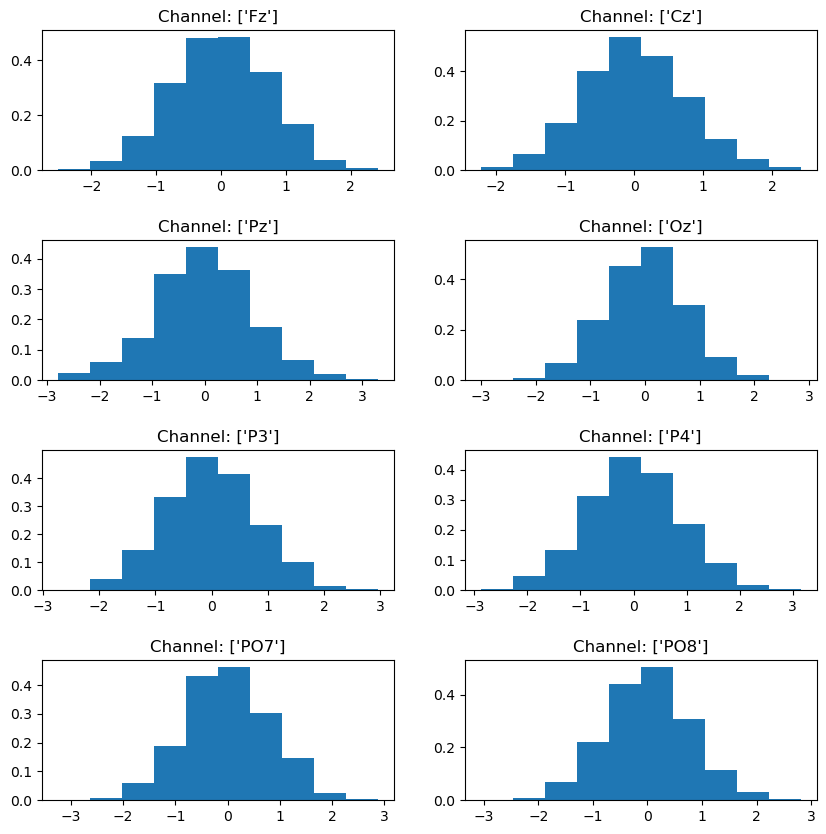

In [16]:
# Visualize channel output
cols = 2
rows = X.shape[-1]//cols
if int(rows) != rows:
    rows = int(rows) + 1
else:
    rows = int(rows)


fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
current = 0
mean = X.mean(axis=(0, 1, 2))
for j in range(rows):
    for k in range(cols):
        ax[j, k].set_title(f"Channel: {get_channel_name(patient_data[0], current)}")
        ax[j, k].hist(mean[:, current], density=True)
        current += 1
plt.subplots_adjust(hspace=0.5)
plt.show()

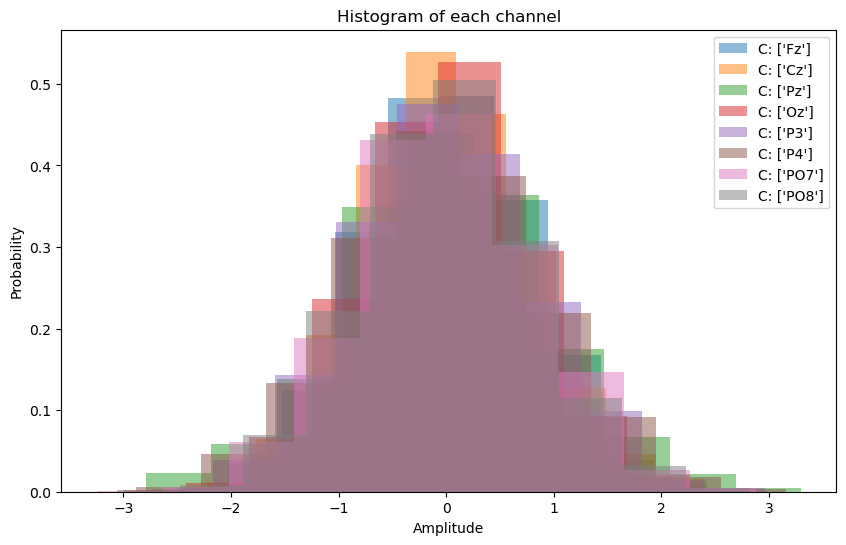

In [17]:
mean = X.mean(axis=(0, 1, 2))
plt.figure(figsize=(10, 6))
plt.title("Histogram of each channel")
for i in range(mean.shape[1]):
    plt.hist(
        mean[:, i], 
        density=True,
        alpha=0.5,
        label=f'C: {get_channel_name(patient_data[0], i)}'
    )


plt.xlabel("Amplitude")
plt.ylabel("Probability")
plt.legend()
plt.show()

The distribution of each channel is almost identical and follows a normal distribution

## Distribution of Target and Non-Target Signals

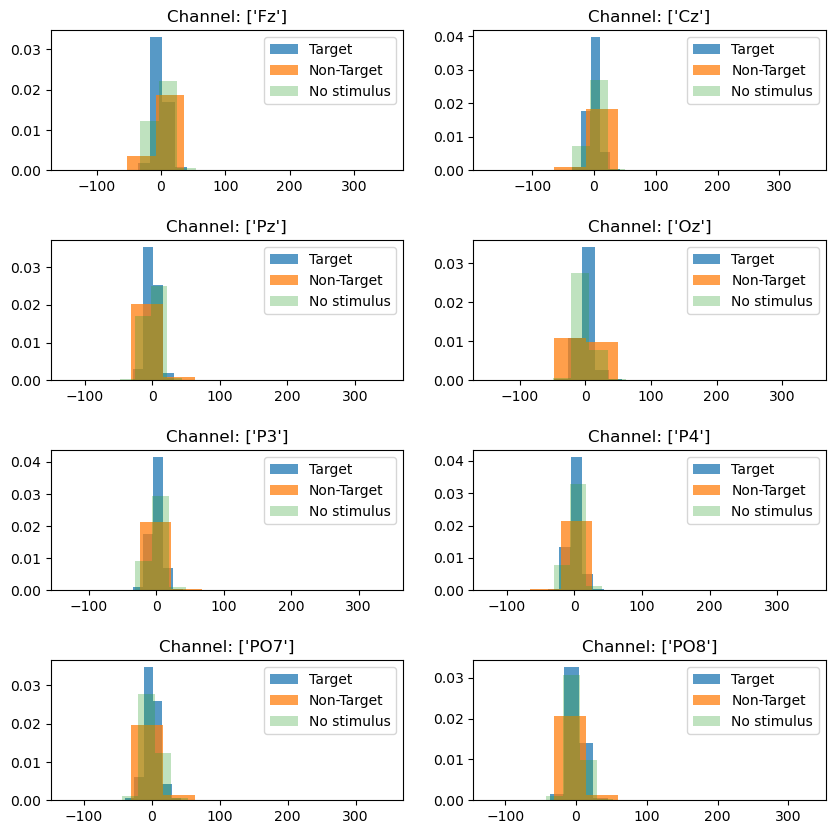

In [18]:
# Visualize channel output
cols = 2
rows = X.shape[-1]//cols
if int(rows) != rows:
    rows = int(rows) + 1
else:
    rows = int(rows)


current = 0

fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
for j in range(rows):
    for k in range(cols):
        x_channel = X[:, :, :, :, current].reshape(-1)
        
        ax[j, k].set_title(f"Channel: {get_channel_name(patient_data[0], current)}")
        ax[j, k].hist(x_channel[y_target.reshape(-1) == target_class], density=True, label='Target', alpha=0.75)
        ax[j, k].hist(x_channel[y_target.reshape(-1) == non_target_class], density=True, label='Non-Target', alpha=0.75)      
        ax[j, k].hist(x_channel[y_target.reshape(-1) == 0], density=True, label='No stimulus', alpha=0.3)      
        ax[j, k].legend()
        
        current += 1

plt.subplots_adjust(hspace=0.5)
plt.show()

We can see from the above plot that - for each channel the target signals have a high probability near zero whereas, the non-target signals are more diffused. Moreover, the amplitude of signal when no stimulus is provided follows a pattern similar to target stimulus.

In [19]:
# Calculate mean and variance of the target and non-target signals for each channel

for i in range(X.shape[-1]):
    x_channel = X[:, :, :, :, i].reshape(-1)
    target_signal = x_channel[y_target.reshape(-1) == target_class]
    nontarget_signal = x_channel[y_target.reshape(-1) == non_target_class]
    print(f"\nChannel: {get_channel_name(patient_data[0], i)}")
    print(f"Target => Mean: {np.mean(target_signal):.5f}, Variance: {np.var(target_signal):.5f}")
    print(f"Non-Target => Mean: {np.mean(nontarget_signal):.5f}, Variance: {np.var(nontarget_signal):.5f}")


Channel: ['Fz']
Target => Mean: -0.84365, Variance: 89.91908
Non-Target => Mean: -0.09898, Variance: 101.33504

Channel: ['Cz']
Target => Mean: -0.64469, Variance: 78.45835
Non-Target => Mean: -0.07870, Variance: 86.46484

Channel: ['Pz']
Target => Mean: -0.19930, Variance: 76.48355
Non-Target => Mean: 0.09531, Variance: 81.44572

Channel: ['Oz']
Target => Mean: 0.19472, Variance: 100.92308
Non-Target => Mean: 0.10605, Variance: 105.96212

Channel: ['P3']
Target => Mean: -0.09613, Variance: 79.13190
Non-Target => Mean: 0.04128, Variance: 84.34823

Channel: ['P4']
Target => Mean: -0.12381, Variance: 72.75169
Non-Target => Mean: 0.07146, Variance: 77.86436

Channel: ['PO7']
Target => Mean: 0.28197, Variance: 109.11507
Non-Target => Mean: -0.04467, Variance: 113.78973

Channel: ['PO8']
Target => Mean: 0.26678, Variance: 81.01573
Non-Target => Mean: -0.06767, Variance: 85.48183


We can see that indeed the variance of all target signal is less than their corresponding non-target signal suggesting that the non-target signals have a more scattered amplitude. When observing the mean we can see that for some channels the mean of target signals are less than their corresponding non-target signals and for others it is the opposite. So, the mean amplitude does not provide us much meaningful information.


## Distribution of Target and Non-target signal for each patient

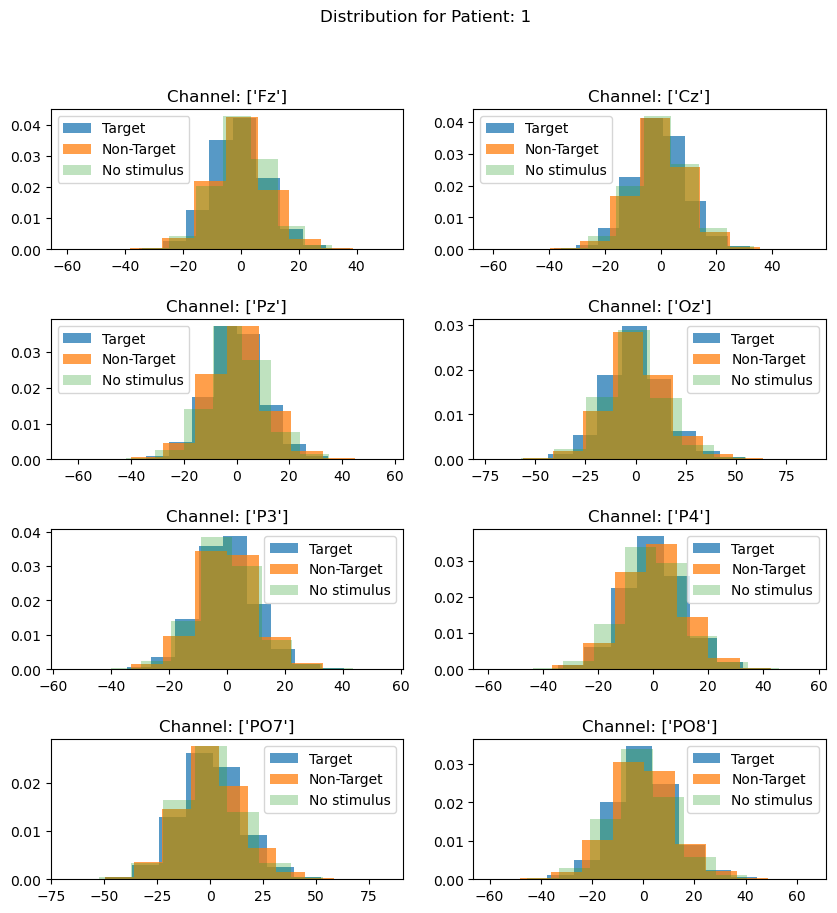

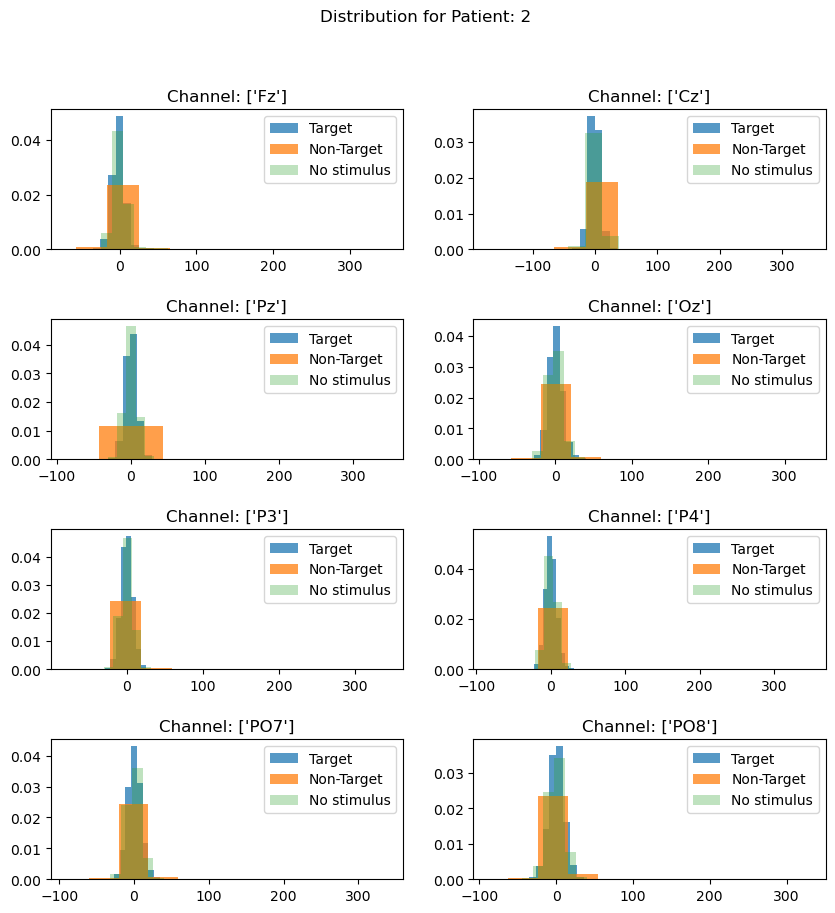

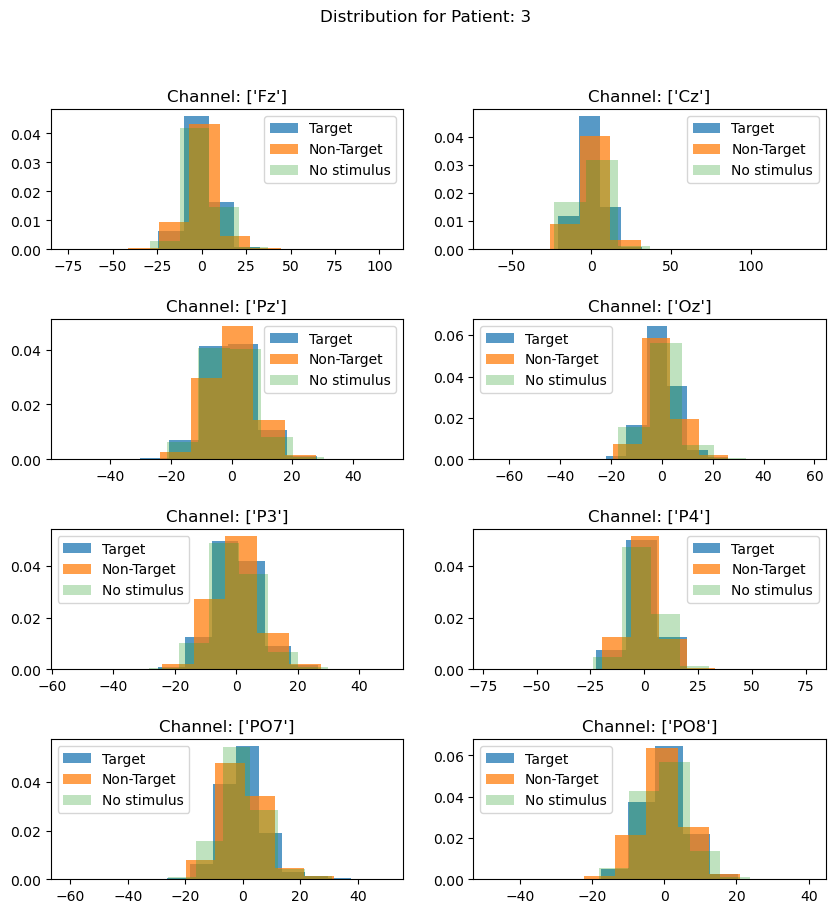

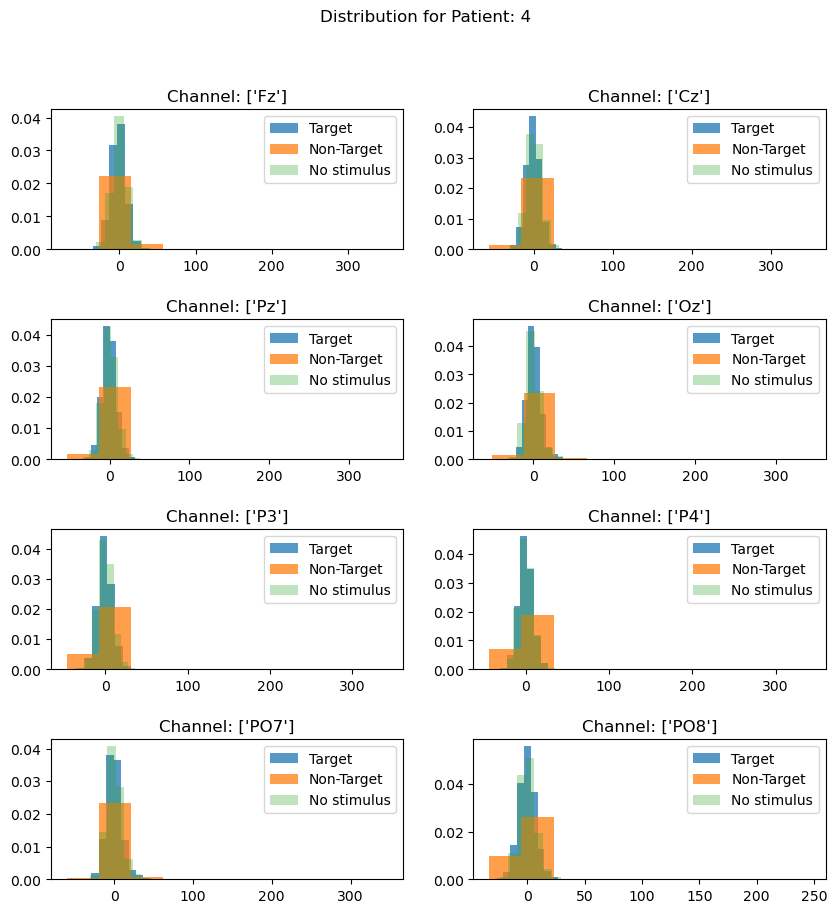

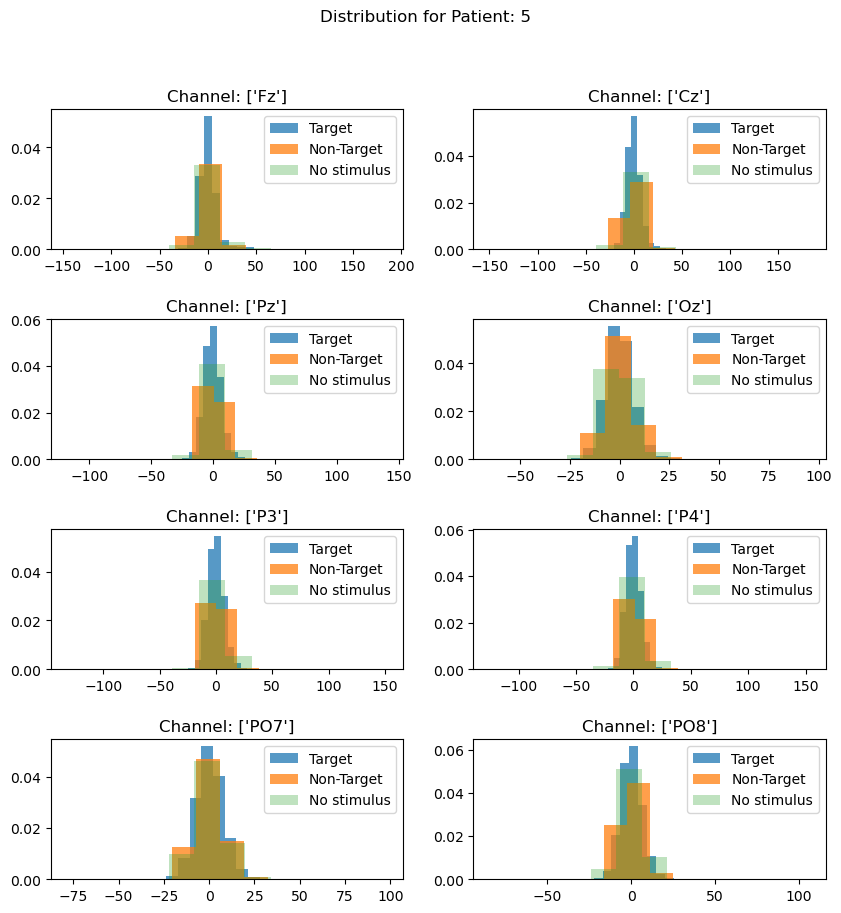

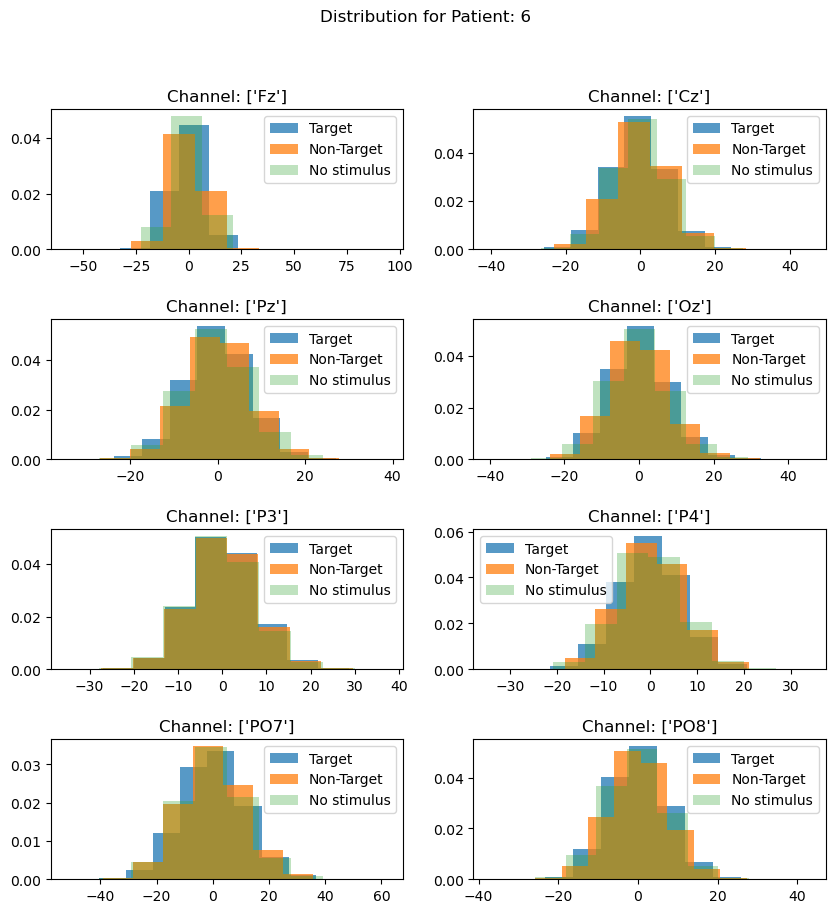

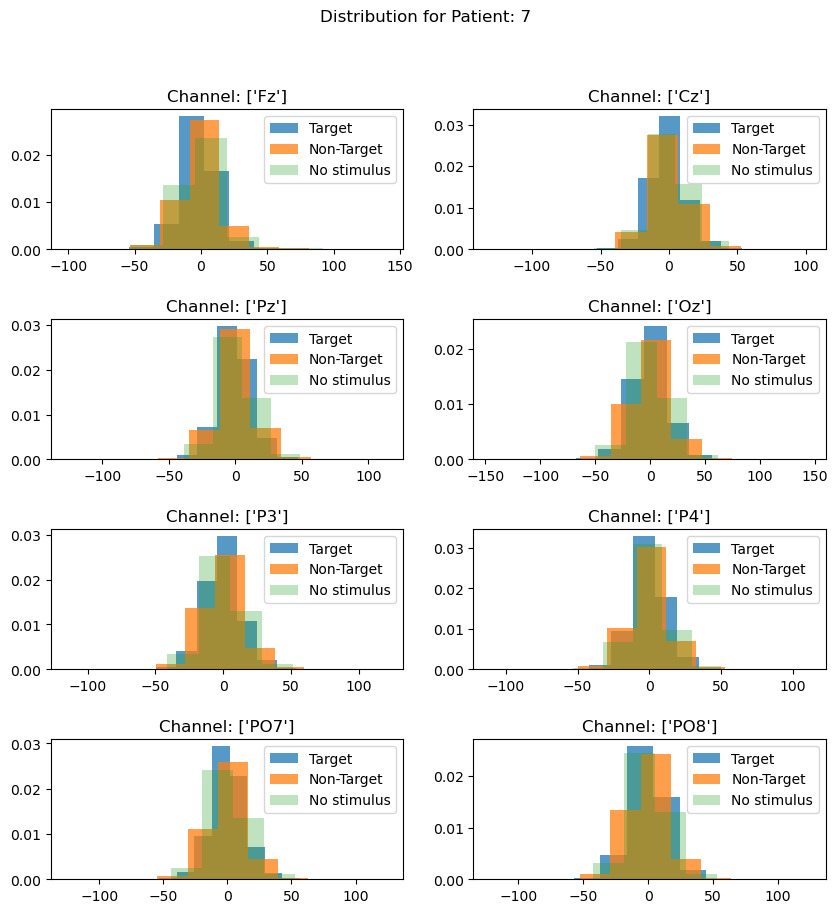

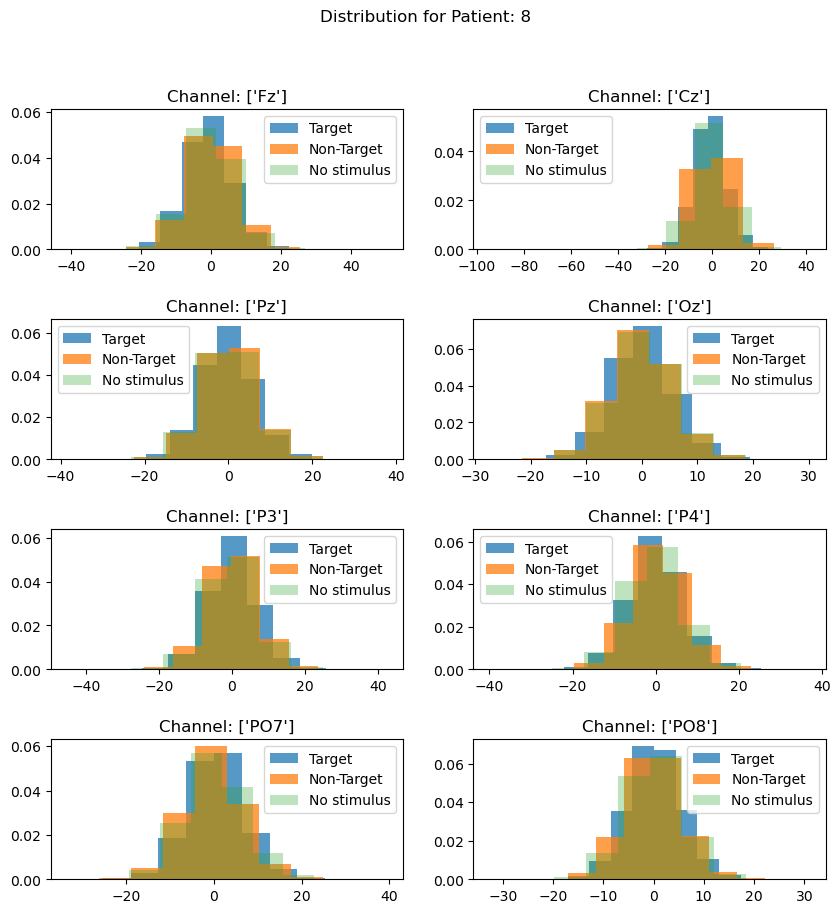

In [20]:
# Visualize channel output
cols = 2
rows = X.shape[-1]//cols
if int(rows) != rows:
    rows = int(rows) + 1
else:
    rows = int(rows)


for patient_id in range(X.shape[0]):
    current = 0
    fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
    for j in range(rows):
        for k in range(cols):
            x_channel = X[patient_id, :, :, :, current].reshape(-1)

            ax[j, k].set_title(f"Channel: {get_channel_name(patient_data[0], current)}")
            ax[j, k].hist(x_channel[y_target[patient_id].reshape(-1) == target_class], density=True, label='Target', alpha=0.75)
            ax[j, k].hist(x_channel[y_target[patient_id].reshape(-1) == non_target_class], density=True, label='Non-Target', alpha=0.75)      
            ax[j, k].hist(x_channel[y_target[patient_id].reshape(-1) == 0], density=True, label='No stimulus', alpha=0.3)      
            ax[j, k].legend()

            current += 1

    plt.subplots_adjust(hspace=0.5)
    plt.suptitle(f"Distribution for Patient: {patient_id+1}")
    plt.show()

We can see from the above distribution that indeed patient 2, 4, and 7 has a target-signal distribution with lower variance than their non-target counterpart. It is similar for almost all chnnels of those patients. Patients 3 and 8 shows similar behavior just in the 'Oz' channel. For other channels, the distribution is very similar. Furthermore, patients 1 and 6 do not show the same behavior. All distributions of all channels of these two patients are very similar. 

But we can also observe that for most cases, when no stimulus is provided, the distribution of the amplitude of the signals is similar to that of the distribution when target stimulus is provided.

### ALS Functional Rating Scale (ALSfrs)

The ALSFRS-R is a questionnaire-based scale that measures and tracks changes in a person's physical function over time.

Today, the ALSFRS-R is a widely used test in clinical trials to track ALS and is considered the gold standard measure of disability progression.

The ALSFRS was first developed and used in the 1990s, but since then has been revised and refined.

The ALSFRS-R measures 12 aspects of physical function, ranging from one’s ability to swallow and use utensils to climbing stairs and breathing. Each function is scored from 4 (normal) to 0 (no ability), with a maximum total score of 48 and a minimum total score of 0.

| Speech | Salivation | Swallowing |
| --- | --- | --- |
| Handwriting | Cutting food | Climbing stairs |
| Turning in bed | Walking | Dressing and Hygiene |
| Dyspnea (difficulty breathing) | Orthopnea (shortness of breath while lying down) | Breathing insufficiency |


Source: [https://www.alspathways.com/assessing-function/](https://www.alspathways.com/assessing-function/)

Let us take a look at the patient information:

In [21]:
for i in range(X.shape[0]):
    print(f"\nPatient {i+1}")
    print(f"Gender: {patient_data[i]['data'][0][0]['gender'][0]}")
    print(f"Age: {patient_data[i]['data'][0][0]['age'][0]}")
    print(f"ALS Functional rating scale: {patient_data[i]['data'][0][0]['ALSfrs'][0]}")
    print(f"ALS Onset Region: {patient_data[i]['data'][0][0]['onsetALS'][0]}")


Patient 1
Gender: male
Age: 55
ALS Functional rating scale: 13
ALS Onset Region: spinal

Patient 2
Gender: male
Age: 59
ALS Functional rating scale: 37
ALS Onset Region: spinal

Patient 3
Gender: male
Age: 43
ALS Functional rating scale: 33
ALS Onset Region: spinal

Patient 4
Gender: female
Age: 75
ALS Functional rating scale: 38
ALS Onset Region: bulbar

Patient 5
Gender: female
Age: 60
ALS Functional rating scale: 34
ALS Onset Region: bulbar

Patient 6
Gender: male
Age: 40
ALS Functional rating scale: 31
ALS Onset Region: Spinal

Patient 7
Gender: male
Age: 61
ALS Functional rating scale: 28
ALS Onset Region: Bulbar

Patient 8
Gender: Female
Age: 72
ALS Functional rating scale: 41
ALS Onset Region: Spinal


After analyzing the age, onset region, and ALSfrs of each patient we can see that there is nothing suggestive as to why some of the patients do not exhibit the same characteristics (low variance of target signals) as the mean distribution.

## Mean baseline substracted from squared amplitude

During each trial, the brain was performing many other task that was not related to the experiment. We can consider these activities as the baseline activity of the brain. If we can subtract this baseline activity from the signals that we obtained when the patient was viewing a target or a non-target stimulus, we can get a clearer picture of the signals involved in processing the stimulus.


We know that each patient had a break between two stimulus - known as inter-stimulus interval. In this period of time the patients were not expecting any stimulus. Therefore, we may use this as a baseline. However, since the amplitude values have both positive and negative values, calculating the mean may provide us zero i.e. no information. To solve this problem we can consider the square of amplitude and calculate the mean. 

We will lose some information performing this operation. Moreover, the positive and negative amplitudes of the signal will be considered equal. However, with this approach we can atleast estimate how much signal has an amplitude that is far away from zero when a patient is viewing either target or non-target stimulus.

To subtract the squared mean, we can square the target and non-target amplitudes and then subtract each value from the squared mean and then calculate the square root of the result.

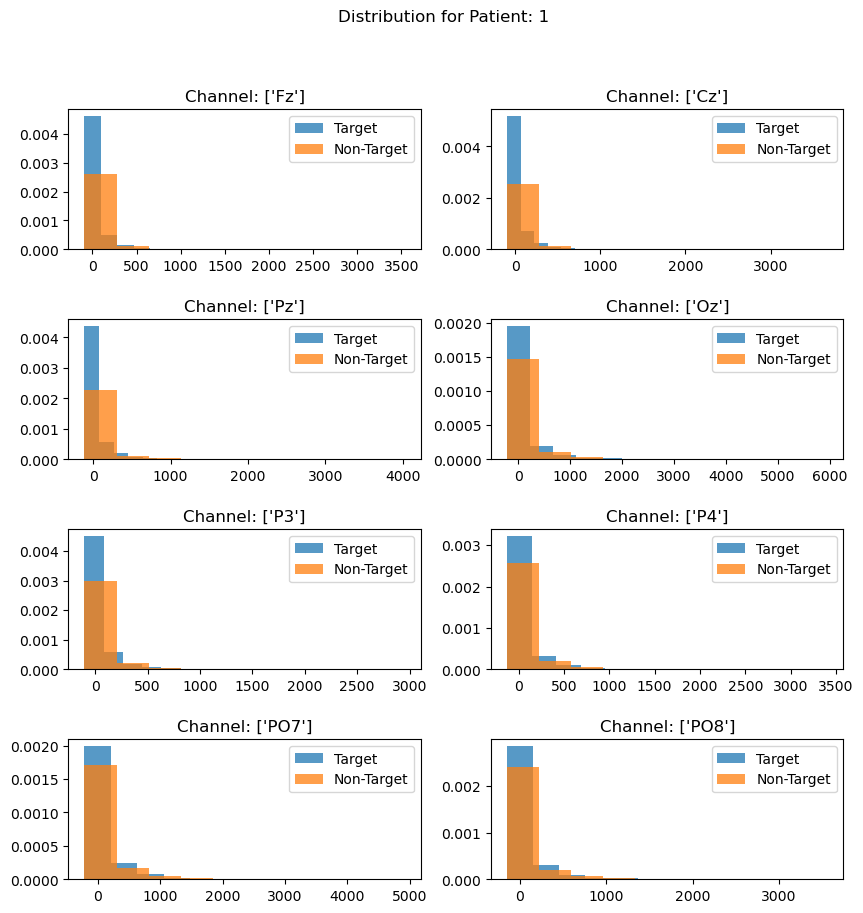

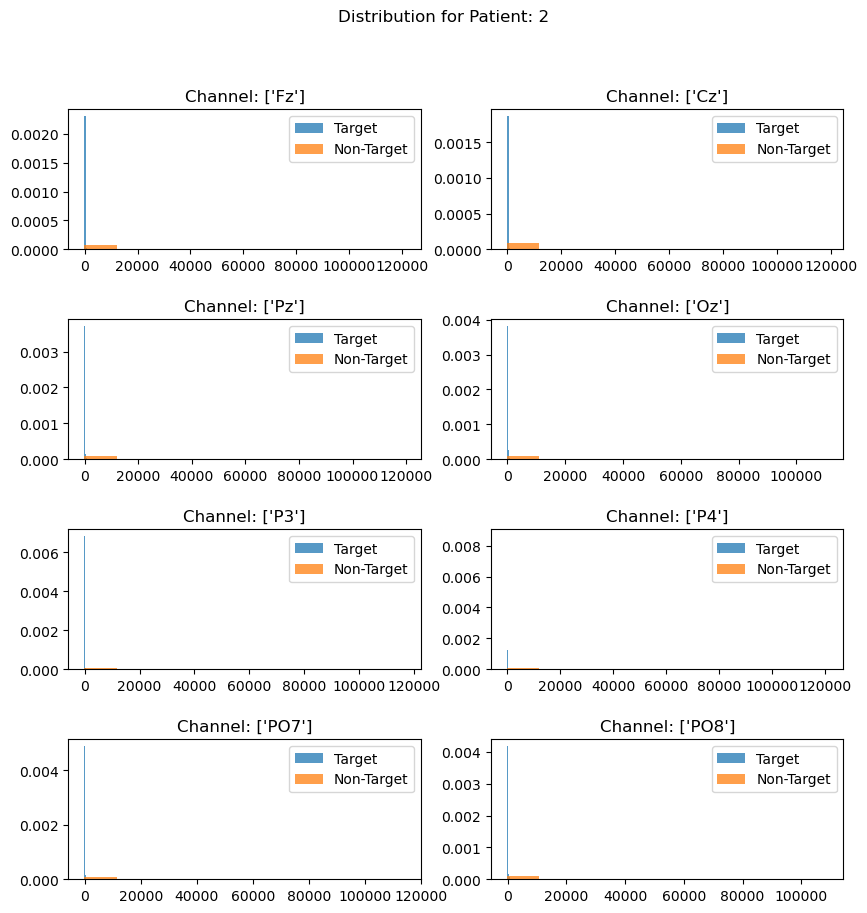

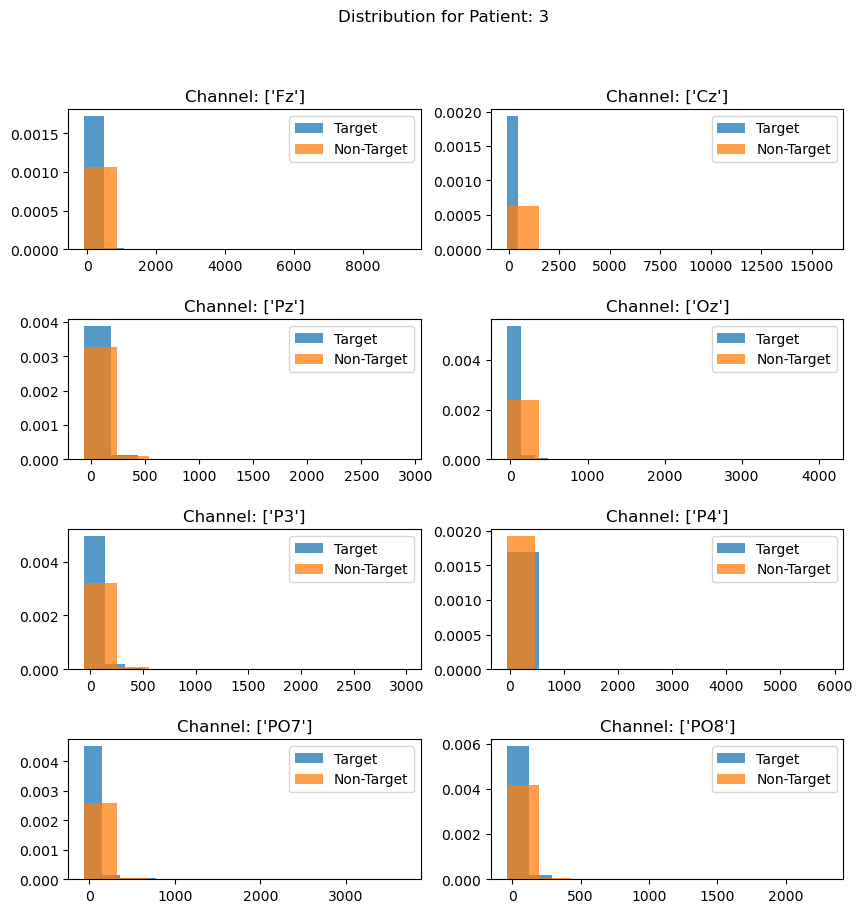

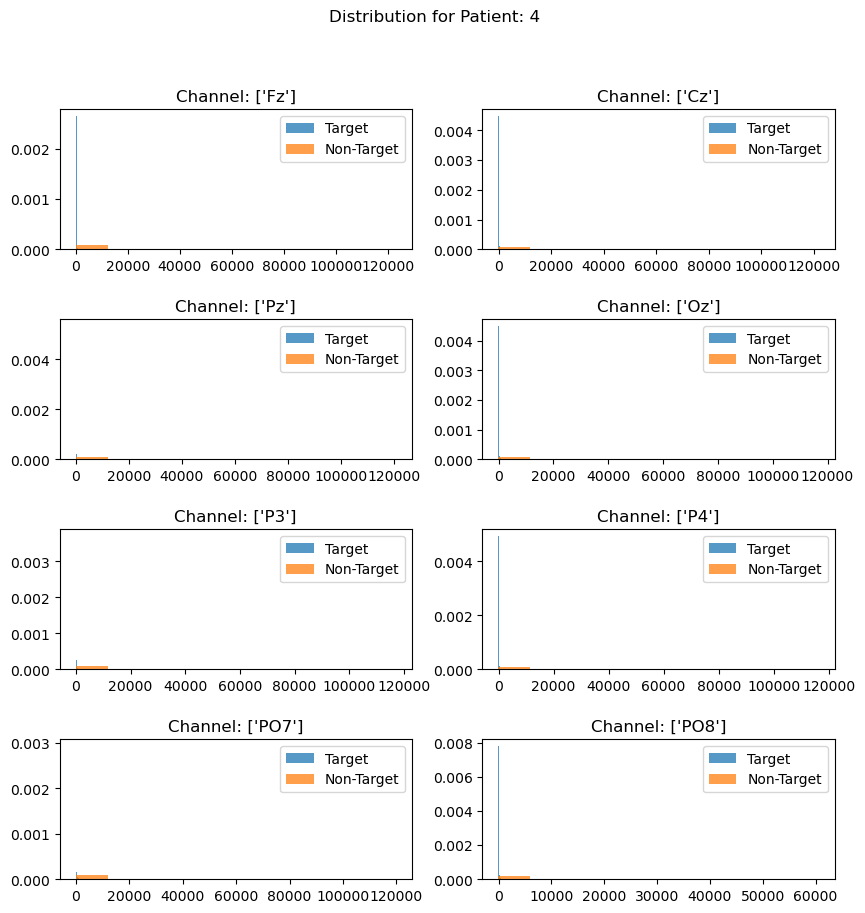

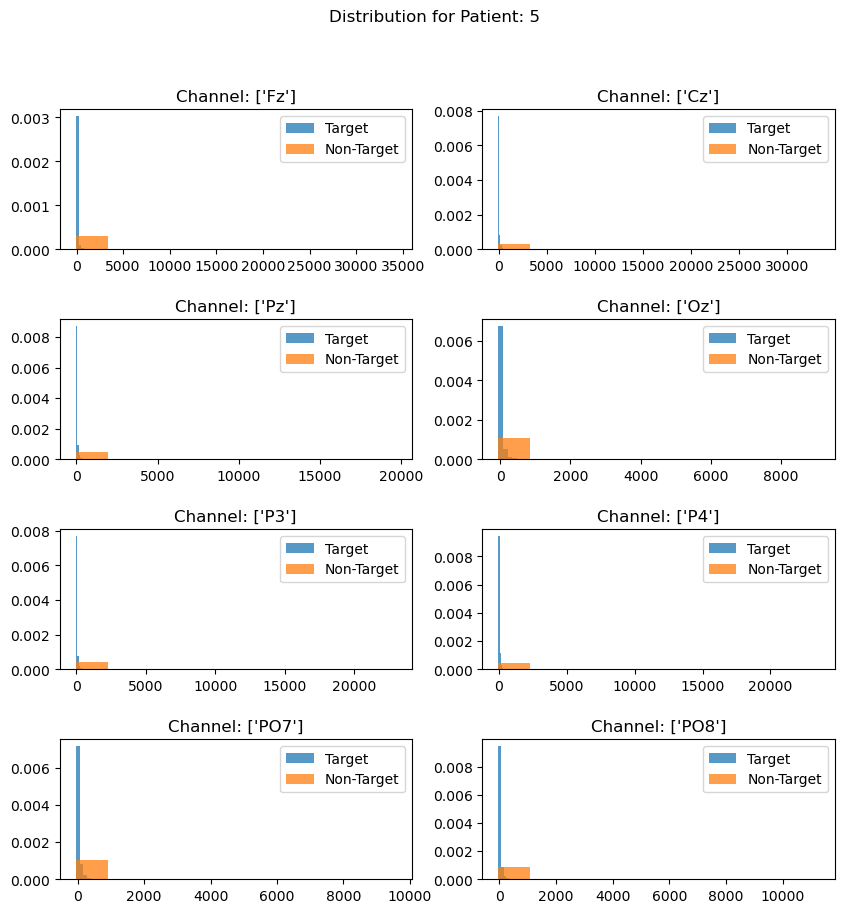

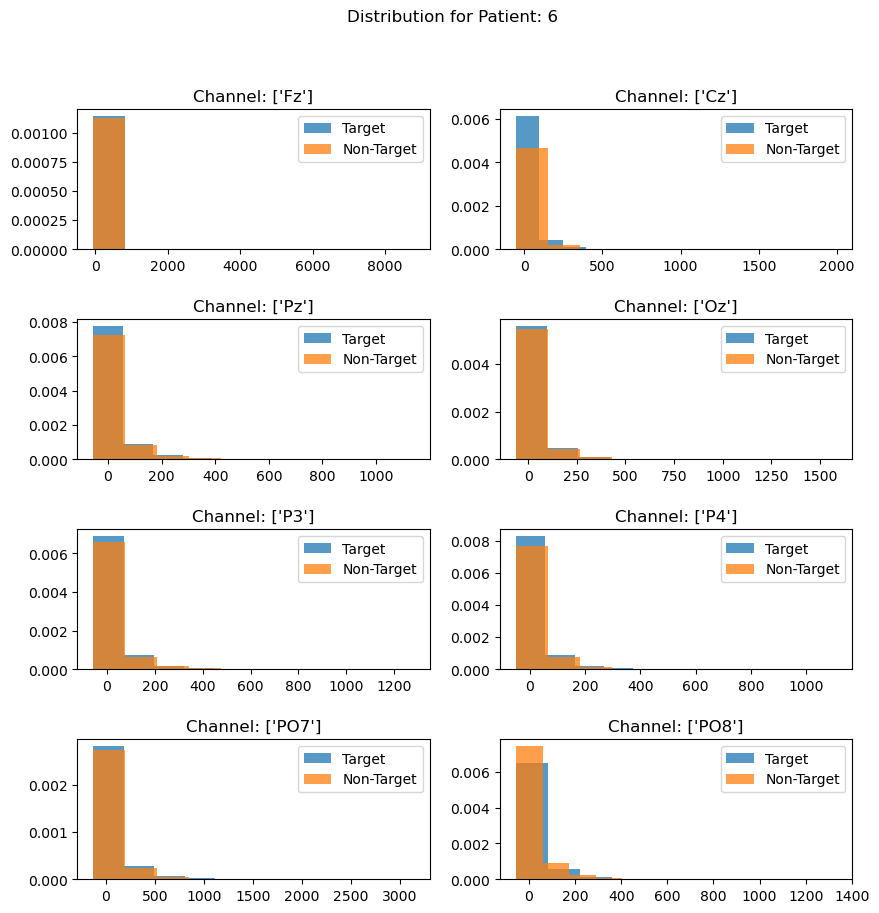

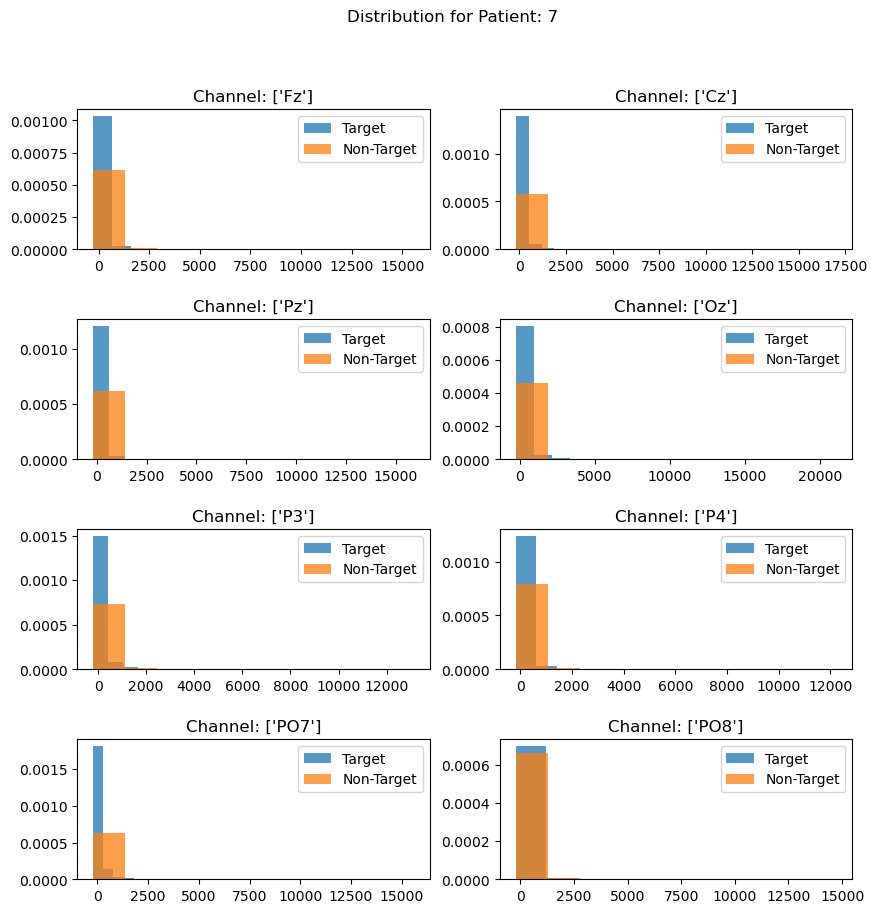

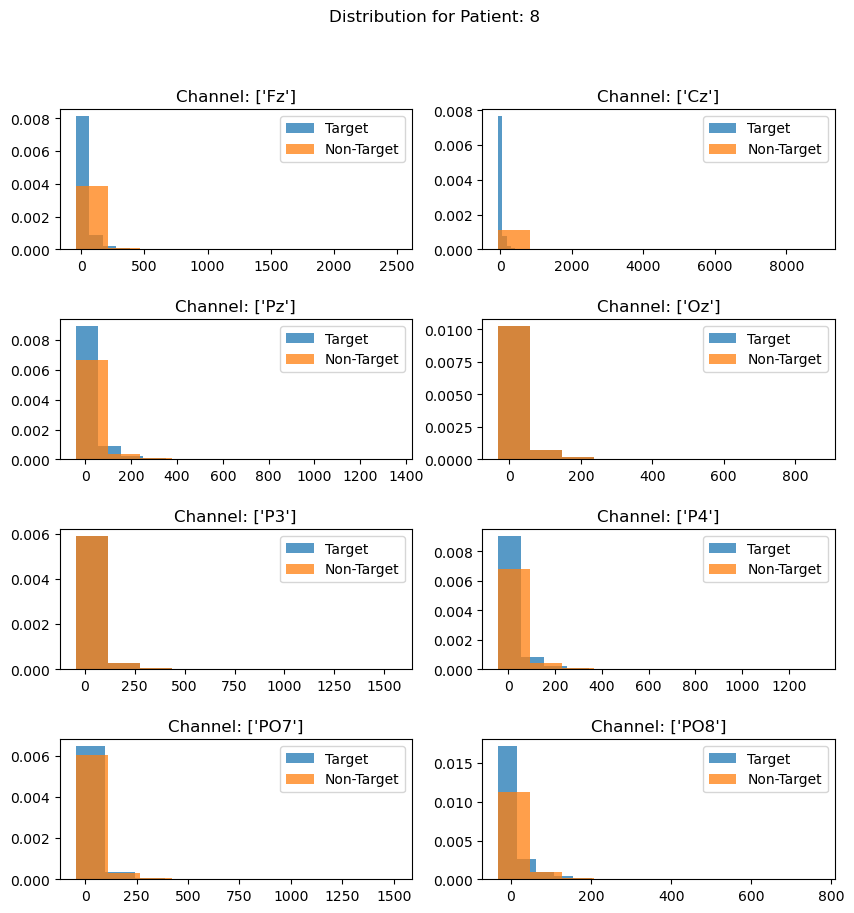

In [22]:
# Visualize channel output
cols = 2
rows = X.shape[-1]//cols
if int(rows) != rows:
    rows = int(rows) + 1
else:
    rows = int(rows)

for patient_id in range(X.shape[0]):
    current = 0
    fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
    for j in range(rows):
        for k in range(cols):
            x_channel = X[patient_id, :, :, :, current].reshape(-1)

            ax[j, k].set_title(f"Channel: {get_channel_name(patient_data[0], current)}")
            m = np.square(x_channel[y_target[patient_id].reshape(-1) == 0])
            m = np.mean(m)
            
            t = np.square(x_channel[y_target[patient_id].reshape(-1) == target_class])
            t = t - m
            ax[j, k].hist(t, density=True, label='Target', alpha=0.75)
            
            nt = np.square(x_channel[y_target[patient_id].reshape(-1) == non_target_class])
            nt = nt - m
            ax[j, k].hist(nt, density=True, label='Non-Target', alpha=0.75)      
            ax[j, k].legend()

            current += 1

    plt.subplots_adjust(hspace=0.5)
    plt.suptitle(f"Distribution for Patient: {patient_id+1}")
    plt.show()

When we calculate the distribution of squared amplitude (without subtracting the mean baseline), we can see a similar distribution. This tells us that during a target stimulus most of the amplitude values are near zero whereas during a non-target stimulus the amplitude can vary.

# Signal Waveform Analysis - Channel Specific

First let us plot the average waveform of target and non-target signal for each channel

In [23]:
def collect_waveform_for_each_stimulus_category(x, y, show_progress=False, get_delayed_samples=0):
    """
    Input shape: (run, trial, sample, channel), (run, trial, sample)
    Output shape: {
        target: {
            channel: [samples]
        }
    }
    """
    output = {
        target_class: {i: [] for i in range(x.shape[-1])},
        non_target_class: {i: [] for i in range(x.shape[-1])},
        0: {i: [] for i in range(x.shape[-1])},
    }
    if get_delayed_samples < 0:
        get_delayed_samples = 0
        
    
    x = x.reshape(-1, x.shape[-1])
    y = y.reshape(-1)
    
    if get_delayed_samples > 0:
        x = np.concatenate( (np.ones((get_delayed_samples, x.shape[1]), dtype='<f8')* x[0, :], x, np.ones((get_delayed_samples, x.shape[1]), dtype='<f8')* x[-1, :])  )
        y = np.concatenate( (np.ones((get_delayed_samples,), dtype='<i2')* y[0], y, np.ones((get_delayed_samples,), dtype='<i2')* y[-1])  )
        
    sequences = []
    current_sequence = [0]
    if get_delayed_samples > 0:
        current_sequence = [i for i in range(get_delayed_samples+1)]
    last_value = y[current_sequence[-1]]
    
   
    
    added_delayed_samples = 0    
    start_adding_delayed_samples = False
    vals = range(1+get_delayed_samples, y.shape[0] - get_delayed_samples, 1)
    if show_progress:
        vals = tqdm(vals)
    for i in vals:
        # If sequence is continuing
        if y[i] == last_value:
            current_sequence.append(i) # Add to current sequence
        else:
            # Sequence has ended. Add current sequence to list of sequences and start a new sequence
            added_delayed_samples = 0
            start_adding_delayed_samples = True
            sequences.append(current_sequence)
            if get_delayed_samples > 0:
                sequences[-1] += [j for j in range(i, i+get_delayed_samples, 1)]
                current_sequence = [j for j in range(i-get_delayed_samples,i+1)]
            else:
                current_sequence = [i]

                
        last_value = y[i]
            
    if len(current_sequence) > 0:
        sequences.append(current_sequence)
        if get_delayed_samples > 0:
            sequences[-1] += [j for j in range(current_sequence[-1], current_sequence[-1]+get_delayed_samples, 1)]
    
    vals = range(x.shape[1])
    if show_progress:
        vals = tqdm(vals)
    for i in vals:
        for j in range(len(sequences)):
            sequence = sequences[j]
            current_target = y[sequence[get_delayed_samples]]
            output[current_target][i].append(x[sequence, i].tolist())
    return output
            

In [24]:
waveforms = collect_waveform_for_each_stimulus_category(X[0], y_target[0], show_progress=True)
waveforms = collect_waveform_for_each_stimulus_category(X[0], y_target[0], show_progress=True, get_delayed_samples=30)

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  6.90it/s]


In [25]:
def get_padded_signals(signals):
    max_length = np.max([len(signals[i]) for i in range(len(signals))])
    result = []
    for i in range(len(signals)):
        l = len(signals[i])
        if l > max_length:
            signals[i]  = signals[i][:max_length]
        elif l < max_length:
            diff = max_length - l
            signals[i] = signals[i] + [0 for _ in range(diff)]
        result.append(signals[i])
    return np.array(result)

In [26]:
padded_signals = np.mean(get_padded_signals(waveforms[0][7]), axis=0)
print(padded_signals.shape)

(92,)


## Plotting Average Waveform for each channel

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:07<00:00,  1.04it/s]


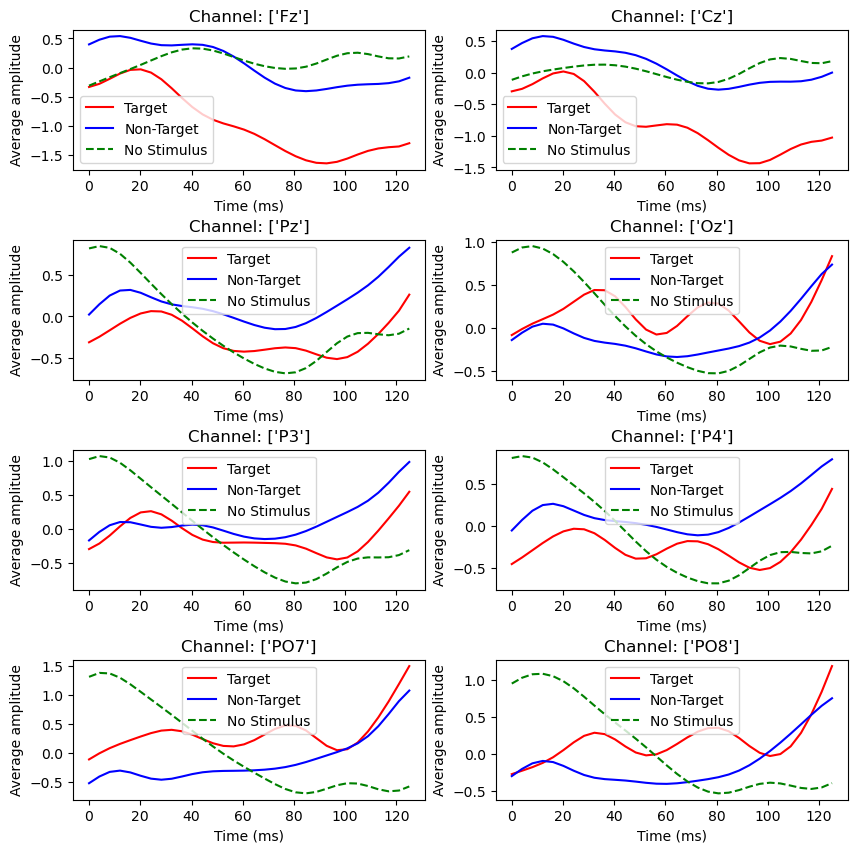

In [27]:

mt_average = [None for _ in range(X.shape[-1])]
nt_average = [None for _ in range(X.shape[-1])]
ns_average = [None for _ in range(X.shape[-1])]

# Visualize channel output
for i in tqdm(range(X.shape[0])):
    cols = 2
    rows = X.shape[-1]//cols
    if int(rows) != rows:
        rows = int(rows) + 1
    else:
        rows = int(rows)
        
        
#     fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
#     plt.suptitle(f"Patient: {i+1}")
    waveforms = collect_waveform_for_each_stimulus_category(X[i], y_target[i])
    for j in range(X.shape[-1]):    
        if mt_average[j] is None:
            mt_average[j] = np.mean(get_padded_signals(waveforms[target_class][j]), axis=0)
        else:
            mt_average[j] = np.mean(get_padded_signals([mt_average[j], np.mean(get_padded_signals(waveforms[target_class][j]), axis=0)]), axis=0)
            
        if nt_average[j] is None:
            nt_average[j] = np.mean(get_padded_signals(waveforms[non_target_class][j]), axis=0)
        else:
            nt_average[j] = np.mean(get_padded_signals([nt_average[j], np.mean(get_padded_signals(waveforms[non_target_class][j]), axis=0)]), axis=0)
            
        if ns_average[j] is None:
            ns_average[j] = np.mean(get_padded_signals(waveforms[0][j]), axis=0)
        else:
            ns_average[j] = np.mean(get_padded_signals([ns_average[j], np.mean(get_padded_signals(waveforms[0][j]), axis=0)]), axis=0)
        
        


fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
current = 0
for j in range(rows):
    for k in range(cols):
        max_val = np.max([mt_average[current].size, nt_average[current].size, ns_average[current].size])
        counts = np.arange(max_val)
        x_axis = np.linspace(0, 1000*max_val/sample_frequency, counts.size)

        ax[j, k].set_title(f"Channel: {get_channel_name(patient_data[0], current)}")
        ax[j, k].plot(x_axis, mt_average[current], 'r-', label='Target')
        ax[j, k].plot(x_axis, nt_average[current], 'b-', label='Non-Target')
        ax[j, k].plot(x_axis, ns_average[current], 'g--', label='No Stimulus')
        
        ax[j, k].set_xlabel("Time (ms)")
        ax[j, k].set_ylabel("Average amplitude")
        ax[j, k].legend()
        
        current += 1
        
plt.subplots_adjust(hspace=0.5)
plt.show()

Each stimulus is presented for 125 ms. Therefore, we grouped all sequence of consecutive signals that belong to the same stimulus category. For example if the signals are:

\[1, 2, 3, 4, 5, 6\]

and the stimulus is 

\[1, 1, 0, 0, 2, 2\]

We grouped each sequence of signal to create a waveform as follows:

- Stimulus type 1: \[1, 2\]
- Stimulus type 0: \[3, 4\]
- Stimulus type 2: \[5, 6\]

In this way we collected each waveform for each channel and patient. We then averaged the waveforms acrosss patient for each category and channel. As a result we obtained the above graph where we can see how neurons in each channel respond when they receive a target/non-target stimulus and when it does not receive any stimulus.

### Parieto-Occipital (left and right) & Midline Occipital region

We can see that in the regions 'PO7', 'PO8', and 'Oz', the waveform has a sharp increase at around 100 ms. On the other hand, when a non-target is provided it increases a little gradually. Moreover, in absence of a stimulus, the activity in this region gradually decreases.

We know that these regions are responsible for visual perception, spatial attention, object recognition, etc. So, we can assume that the sharp increase in the amplitude occurred when the patient recognized the target stimulus.


### Parietal Region (P3, P4, and Pz)

From the above graph we can see that the regions P3, P4, and Pz also shows a sharp rise in amplitude around 100ms when a target stimulus is presented. However, the overall amplitude is less than the non-target signal. It may be due the fact that these regions are near 'PO7', 'PO8', and 'Oz' and as a result is picking up some signal from this region.


## Plotting Average Waveform for each channel and patient

  0%|                                                                                            | 0/8 [00:00<?, ?it/s]

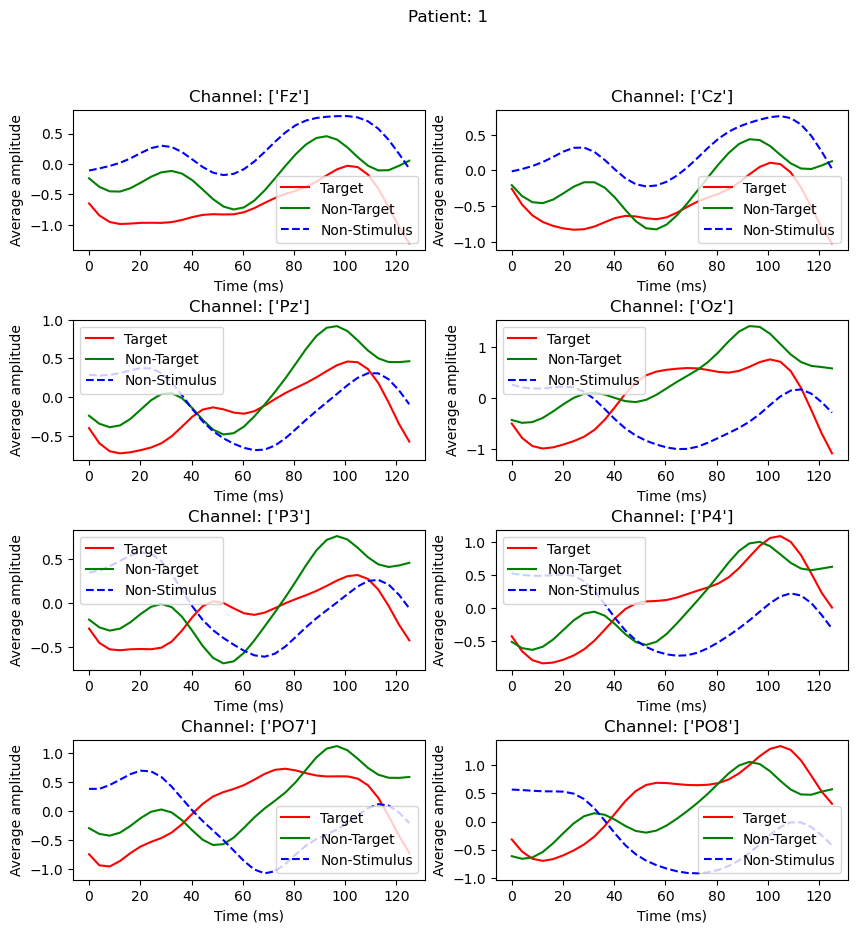

 12%|██████████▌                                                                         | 1/8 [00:01<00:13,  2.00s/it]

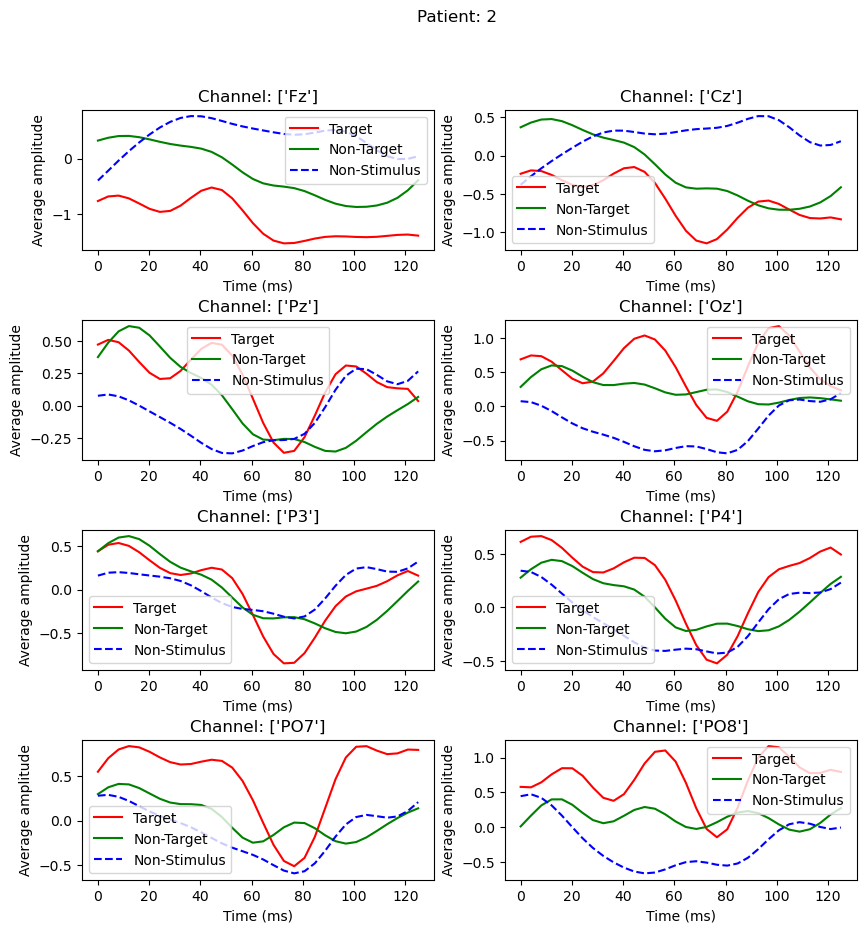

 25%|█████████████████████                                                               | 2/8 [00:04<00:12,  2.01s/it]

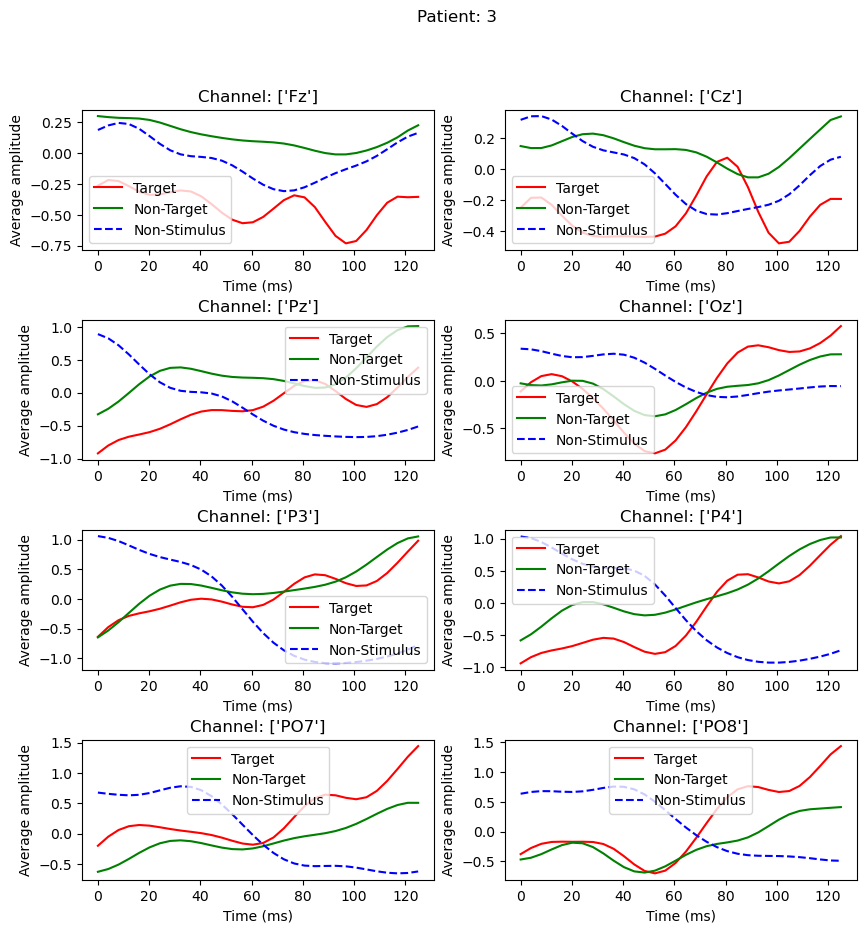

 38%|███████████████████████████████▌                                                    | 3/8 [00:06<00:10,  2.03s/it]

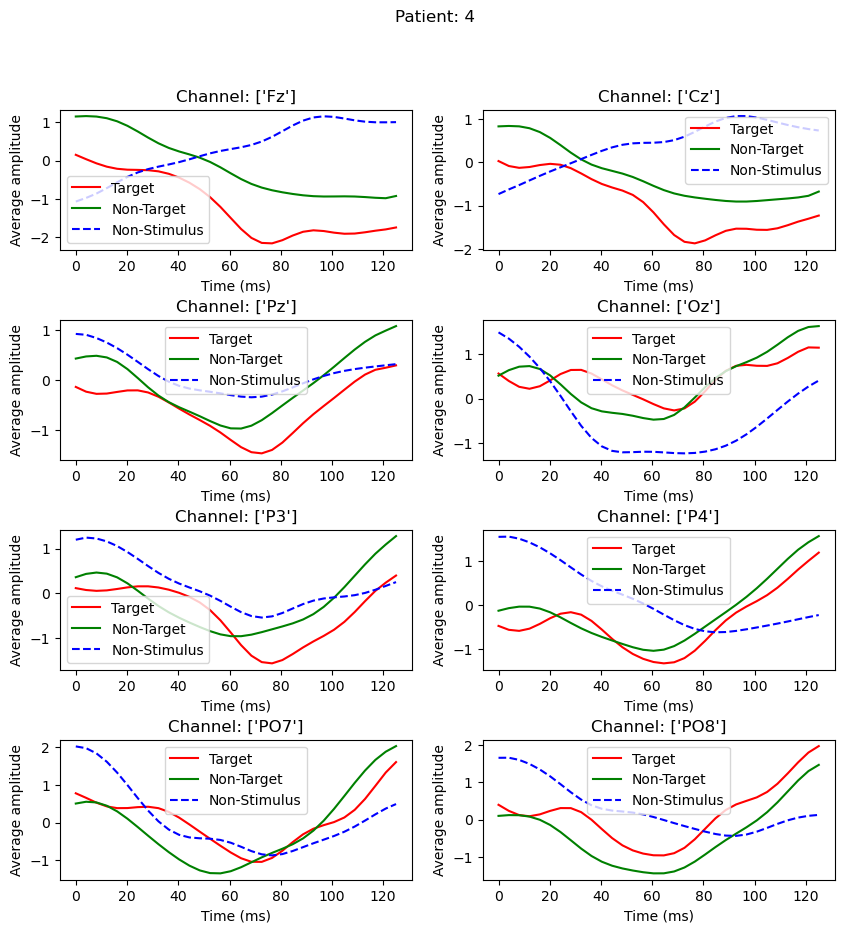

 50%|██████████████████████████████████████████                                          | 4/8 [00:08<00:08,  2.02s/it]

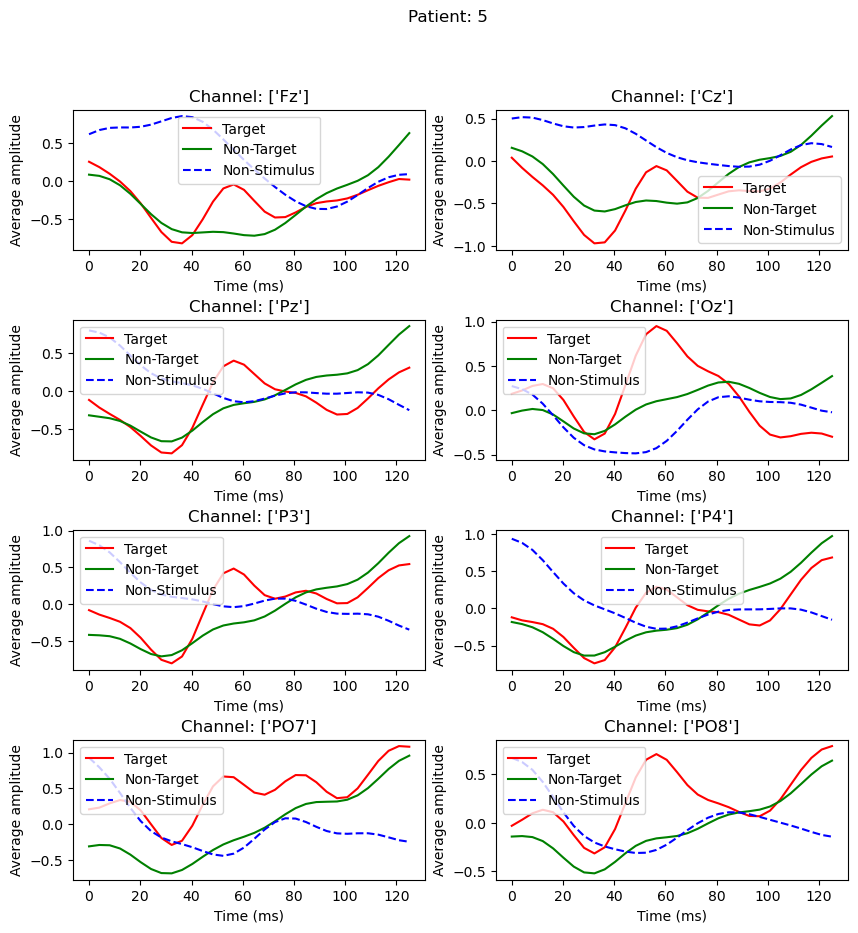

 62%|████████████████████████████████████████████████████▌                               | 5/8 [00:10<00:06,  2.02s/it]

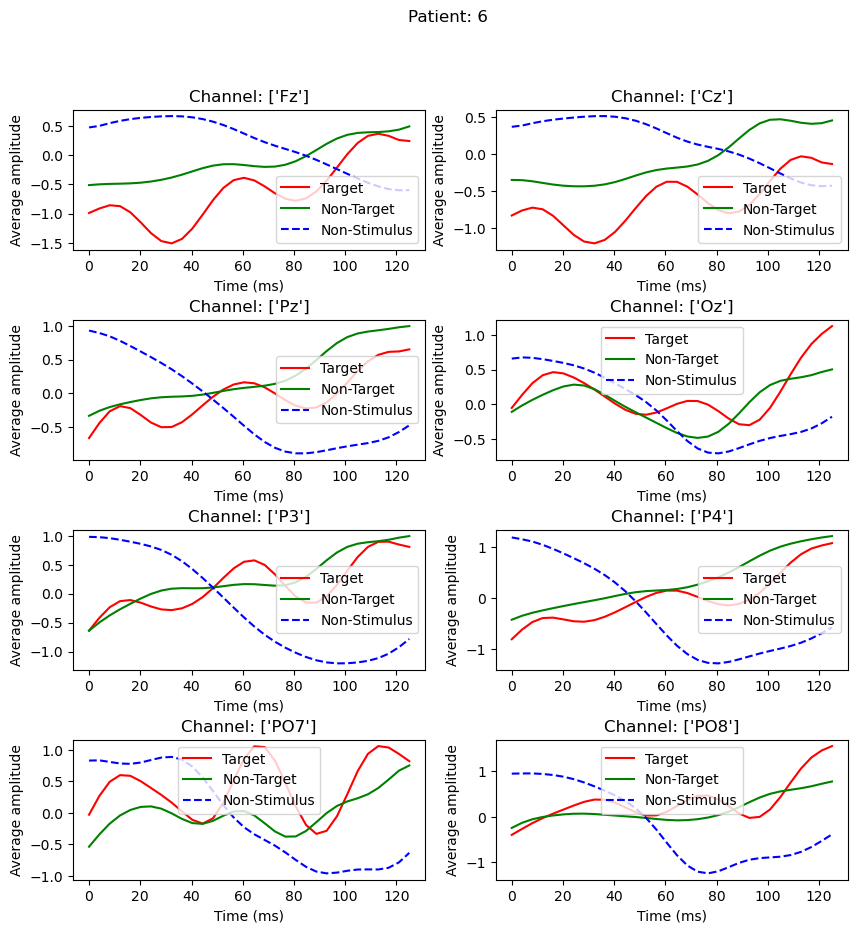

 75%|███████████████████████████████████████████████████████████████                     | 6/8 [00:11<00:03,  1.97s/it]

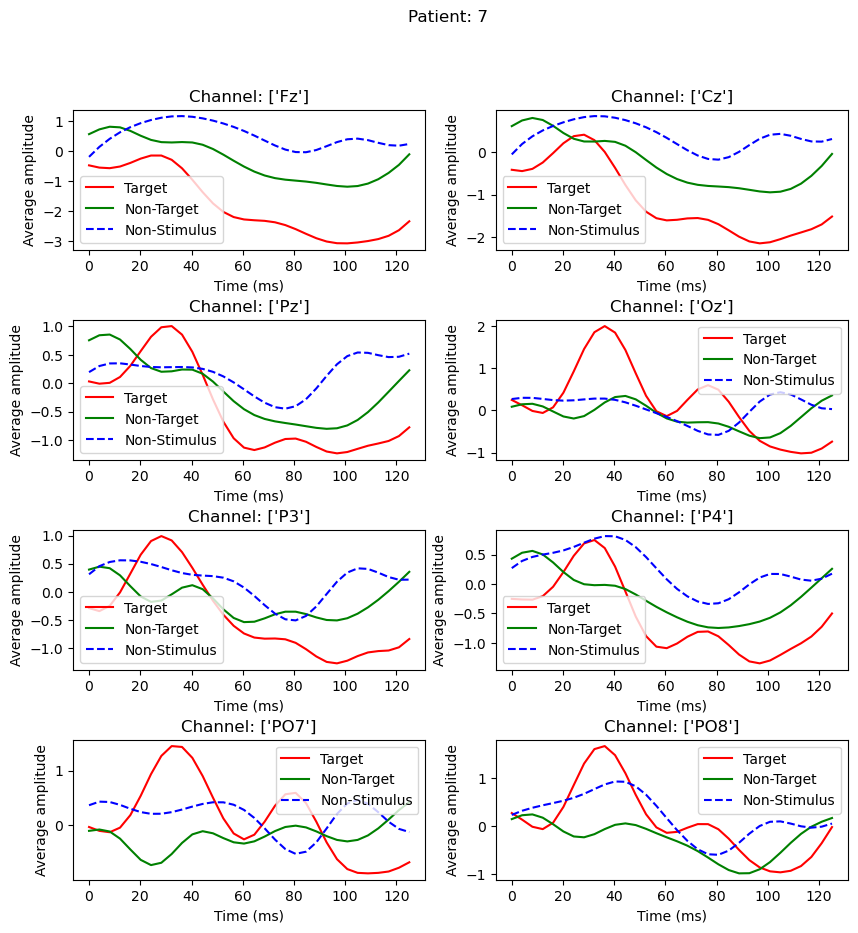

 88%|█████████████████████████████████████████████████████████████████████████▌          | 7/8 [00:13<00:01,  1.97s/it]

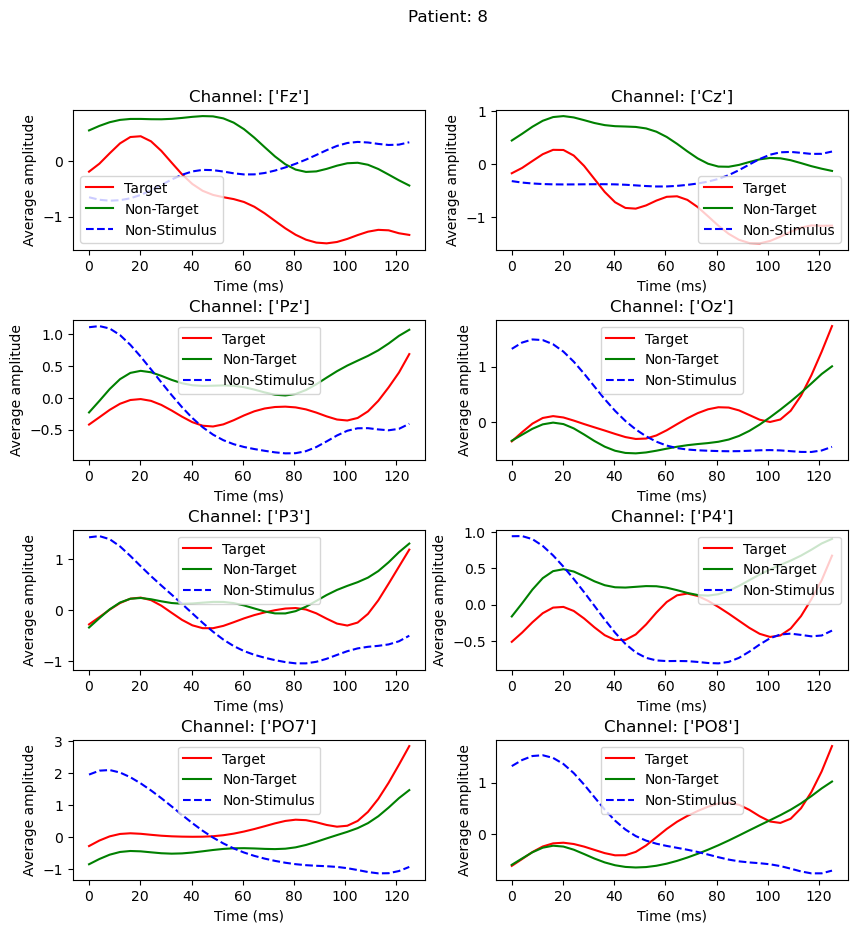

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:15<00:00,  2.00s/it]


In [28]:

        
# Visualize channel output
for i in tqdm(range(X.shape[0])):
    cols = 2
    rows = X.shape[-1]//cols
    if int(rows) != rows:
        rows = int(rows) + 1
    else:
        rows = int(rows)
        
        
    fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
    plt.suptitle(f"Patient: {i+1}")
    current = 0
    waveforms = collect_waveform_for_each_stimulus_category(X[i], y_target[i])
    for j in range(rows):
        for k in range(cols):
            ax[j, k].set_title(f"Channel: {get_channel_name(patient_data[i], current)}")
            
            mt = np.mean(get_padded_signals(waveforms[target_class][current]), axis=0)
            nt = np.mean(get_padded_signals(waveforms[non_target_class][current]), axis=0)
            ns = np.mean(get_padded_signals(waveforms[0][current]), axis=0)
            
            max_val = np.max([mt.size, nt.size, ns.size])
            counts = np.arange(max_val)
            x_axis = np.linspace(0, 1000*max_val/sample_frequency, counts.size)            
            
            
            ax[j, k].plot(x_axis, mt, 'r-', label='Target')                     
            ax[j, k].plot(x_axis, nt, 'g-', label='Non-Target')            
            ax[j, k].plot(x_axis, ns, 'b--', label='Non-Stimulus')
            
            
            ax[j, k].set_xlabel("Time (ms)")
            ax[j, k].set_ylabel("Average amplitude")
            
            current += 1
            
            ax[j, k].legend()
    plt.subplots_adjust(hspace=0.5)
    plt.show()

### Target Stimulus

From the above graph, for each patient we can see that the waveforms in the parietal region does start increasing exponentially after around 50-80 ms. The following were observed for waveforms related to target stimulus:

**Patient 1**

There is an increase of amplitude in parietal region at around 20-40ms and then the amplitude decreases sharply at around 80-100 ms.

At frontal region there is a gradual increase of amplitude and a sharp decrease at around 80-100 ms.


**Patient 2**

There is a slight increase in amplitude at parietal region at around 30-40 ms followed by a decrease in amplitude and then a sharp rise at around 60-80 ms.

At frontal region, there is a slight increase at around 30 ms and then a decrease in amplitude is observed.

**Patient 3**

At parietal region there is a sharp increase at 40-60 ms followed by another slight increase at around 100 ms.  

The frontal region shows a slight increase at around 50-60 ms.

**Patient 4**

A sharp increase in parietal region is observed at around 70-80 ms. 

The frontal region shows a decrease in amplitude at around 40-50 ms.

**Patient 5**

In parietal region there is a sharp increase at around 30-40 ms followed by a decrease and then an increase again at around 90-100 ms. 

The frontal region shows an increase in amplitude at around 30-40 ms.

**Patient 6**

The parietal region shows a slight increase at around 30-60 ms followed by a sharp increase at around 90-100 ms. 

The frontal region shows an increase in amplitude at around 30-40 ms and the again at 80-90 ms.

**Patient 7**

At parietal region a sharp increase in amplitude is observed at around 10-20 ms followed by a decrease and then a slight increase after 100 ms.

At frontal region an increase is observed at around 10-20 ms followed by a decrease in amplitude.

**Patient 8**

A sharp increase of amplitude is observed at around 100-110 ms in the parietal region with slight increase before it at around 40-50 ms. 

The frontal region shows an increase in amplitude at around 10-20 ms followed by a decrease.


Generally, we can observe two peaks in different channels of the parietal region when a target stimulus is provided. The first one is somewhere around 30-60 ms and the second one is around 80-100 ms. These two peaks have a decrease in amplitude between them. 

The frontal region generally shows a decrease in amplitude (except patient 5 and 6) between the duration 30-70 ms. Patient 5 and 6 shows an increase in the amplitude of signal in frontal region at almost the same time when the amplitude of parietal region starts increasing.

#### Non-target stimulus

The non-target stimulus also shows an increase in amplitude at around 40-60 ms but generally it has fewer peaks and valeys. The change is gradual.

In [29]:
for i in range(X.shape[0]):
    print(f"\nPatient {i+1}")
    print(f"Gender: {patient_data[i]['data'][0][0]['gender'][0]}")
    print(f"Age: {patient_data[i]['data'][0][0]['age'][0]}")
    print(f"ALS Functional rating scale: {patient_data[i]['data'][0][0]['ALSfrs'][0]}")
    print(f"ALS Onset Region: {patient_data[i]['data'][0][0]['onsetALS'][0]}")


Patient 1
Gender: male
Age: 55
ALS Functional rating scale: 13
ALS Onset Region: spinal

Patient 2
Gender: male
Age: 59
ALS Functional rating scale: 37
ALS Onset Region: spinal

Patient 3
Gender: male
Age: 43
ALS Functional rating scale: 33
ALS Onset Region: spinal

Patient 4
Gender: female
Age: 75
ALS Functional rating scale: 38
ALS Onset Region: bulbar

Patient 5
Gender: female
Age: 60
ALS Functional rating scale: 34
ALS Onset Region: bulbar

Patient 6
Gender: male
Age: 40
ALS Functional rating scale: 31
ALS Onset Region: Spinal

Patient 7
Gender: male
Age: 61
ALS Functional rating scale: 28
ALS Onset Region: Bulbar

Patient 8
Gender: Female
Age: 72
ALS Functional rating scale: 41
ALS Onset Region: Spinal


If we observe the average waveform for the channels **Oz, PO7, PO8** again but this time crop the waveform so that we view the waveforms starting from 60th ms then we get the following graph:

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:07<00:00,  1.06it/s]


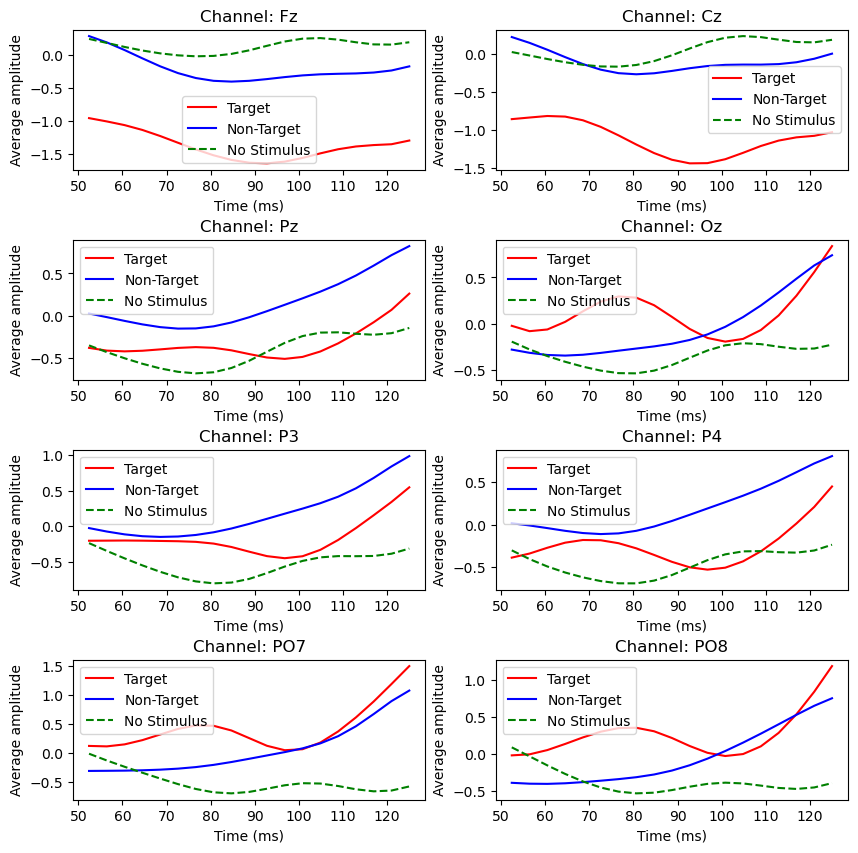

In [30]:

mt_average = [None for _ in range(X.shape[-1])]
nt_average = [None for _ in range(X.shape[-1])]
ns_average = [None for _ in range(X.shape[-1])]

# Visualize channel output
for i in tqdm(range(X.shape[0])):
    cols = 2
    rows = X.shape[-1]//cols
    if int(rows) != rows:
        rows = int(rows) + 1
    else:
        rows = int(rows)
        
#     fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
#     plt.suptitle(f"Patient: {i+1}")
    waveforms = collect_waveform_for_each_stimulus_category(X[i], y_target[i])
    for j in range(X.shape[-1]):    
        if mt_average[j] is None:
            mt_average[j] = np.mean(get_padded_signals(waveforms[target_class][j]), axis=0)
        else:
            mt_average[j] = np.mean(get_padded_signals([mt_average[j], np.mean(get_padded_signals(waveforms[target_class][j]), axis=0)]), axis=0)
            
        if nt_average[j] is None:
            nt_average[j] = np.mean(get_padded_signals(waveforms[non_target_class][j]), axis=0)
        else:
            nt_average[j] = np.mean(get_padded_signals([nt_average[j], np.mean(get_padded_signals(waveforms[non_target_class][j]), axis=0)]), axis=0)
            
        if ns_average[j] is None:
            ns_average[j] = np.mean(get_padded_signals(waveforms[0][j]), axis=0)
        else:
            ns_average[j] = np.mean(get_padded_signals([ns_average[j], np.mean(get_padded_signals(waveforms[0][j]), axis=0)]), axis=0)
        
        


fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
current = 0
crop_duration = 50 #ms
for j in range(rows):
    for k in range(cols):
        max_val = np.max([mt_average[current].size, nt_average[current].size, ns_average[current].size])
        counts = np.arange(max_val)
        x_axis = np.linspace(0, 1000*max_val/sample_frequency, counts.size)
        indices = np.where(x_axis >= crop_duration)[0]

        ax[j, k].set_title(f"Channel: {get_channel_name(patient_data[0], current)[0]}")
        ax[j, k].plot(x_axis[indices], mt_average[current][indices], 'r-', label='Target')
        ax[j, k].plot(x_axis[indices], nt_average[current][indices], 'b-', label='Non-Target')
        ax[j, k].plot(x_axis[indices], ns_average[current][indices], 'g--', label='No Stimulus')

        ax[j, k].set_xlabel("Time (ms)")
        ax[j, k].set_ylabel("Average amplitude")
        ax[j, k].legend()

        current += 1
        
plt.subplots_adjust(hspace=0.5)
plt.show()

In this case for the three regions we observe that the target stimulus is near zero whereas the non-target stimulus is below zero. Moreover, the target stimulus has peaks and valleys in the waveform but the non-target stimulus increases gradually.When no stimulus is provided, the value of the waveform is usually below zero. 

#### What happens after the stimulus ends - Does the amplitude of parietal region decrease? If frontal region takes part in decision making should it not show a change?

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.96it/s]


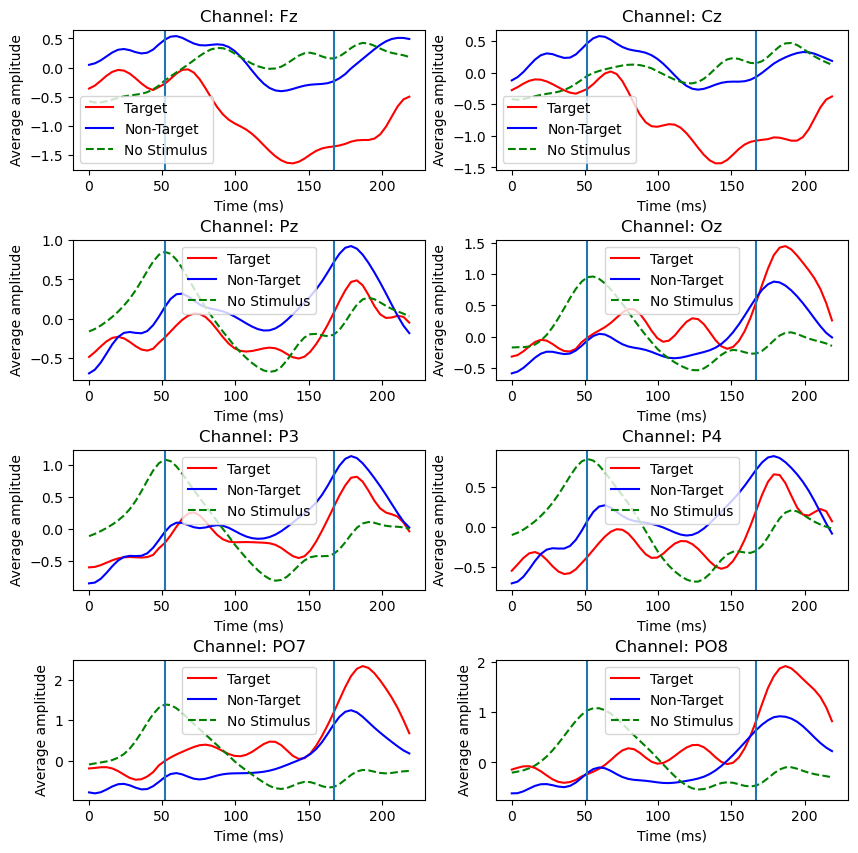

In [31]:
additional_duration_of_waveform = 50 #ms
additional_samples = int(sample_frequency * additional_duration_of_waveform / 1000)


mt_average = [None for _ in range(X.shape[-1])]
nt_average = [None for _ in range(X.shape[-1])]
ns_average = [None for _ in range(X.shape[-1])]

# Visualize channel output
for i in range(X.shape[0]):
    cols = 2
    rows = X.shape[-1]//cols
    if int(rows) != rows:
        rows = int(rows) + 1
    else:
        rows = int(rows)
        
#     fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
#     plt.suptitle(f"Patient: {i+1}")
    waveforms = collect_waveform_for_each_stimulus_category(X[i], y_target[i], get_delayed_samples=additional_samples, show_progress=True)
    for j in range(X.shape[-1]):    
        if mt_average[j] is None:
            mt_average[j] = np.mean(get_padded_signals(waveforms[target_class][j]), axis=0)
        else:
            mt_average[j] = np.mean(get_padded_signals([mt_average[j], np.mean(get_padded_signals(waveforms[target_class][j]), axis=0)]), axis=0)
            
        if nt_average[j] is None:
            nt_average[j] = np.mean(get_padded_signals(waveforms[non_target_class][j]), axis=0)
        else:
            nt_average[j] = np.mean(get_padded_signals([nt_average[j], np.mean(get_padded_signals(waveforms[non_target_class][j]), axis=0)]), axis=0)
            
        if ns_average[j] is None:
            ns_average[j] = np.mean(get_padded_signals(waveforms[0][j]), axis=0)
        else:
            ns_average[j] = np.mean(get_padded_signals([ns_average[j], np.mean(get_padded_signals(waveforms[0][j]), axis=0)]), axis=0)
        
        


fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
current = 0
for j in range(rows):
    for k in range(cols):
        max_val = np.max([mt_average[current].size, nt_average[current].size, ns_average[current].size])
        counts = np.arange(max_val)
        total_duration = 1000*max_val/sample_frequency
        x_axis = np.linspace(0, total_duration, counts.size)

        ax[j, k].set_title(f"Channel: {get_channel_name(patient_data[0], current)[0]}")
        ax[j, k].plot(x_axis, mt_average[current], 'r-', label='Target')
        ax[j, k].plot(x_axis, nt_average[current], 'b-', label='Non-Target')
        ax[j, k].plot(x_axis, ns_average[current], 'g--', label='No Stimulus')
        
        ax[j, k].axvline((x_axis[np.where(x_axis >= additional_duration_of_waveform)[0][0]], ))
        ax[j, k].axvline((x_axis[np.where(x_axis <= total_duration - additional_duration_of_waveform)[0][-1]], ))

        ax[j, k].set_xlabel("Time (ms)")
        ax[j, k].set_ylabel("Average amplitude")
        ax[j, k].legend()

        current += 1
        
plt.subplots_adjust(hspace=0.5)
plt.show()

The above graph is an extended average of the previous waveform. The blue vertical line in the graph shows when a stimulus starts and when it ends. 

### Parietal region

We can see that on average for most of the parietal region, the amplitude starts to increase right before the stimulus ends and continues to peak a little after the stimulus ends. Finally it decreases towards resting potential which is around -70mv. This behavior is a common characteristic of an action potential. 

Therefore, we can assume that the different places of the parietal region fires an action potential when it receives a target stimulus. The action potential starts at around 200 ms and ends at around 290 ms which is a duration of about 90 ms. Therefore, the stimulus takes about 200 ms to reach the parietal region.

### Frontal region

The frontal region does not show any characteristic action potential during a target or non-target stimulus. However, frontal region plays a role in attention. But it does not show any clear sign of action potential. However, it does have a decreasing amplitude somewhere near 140 ms.

  0%|                                                                                            | 0/8 [00:00<?, ?it/s]

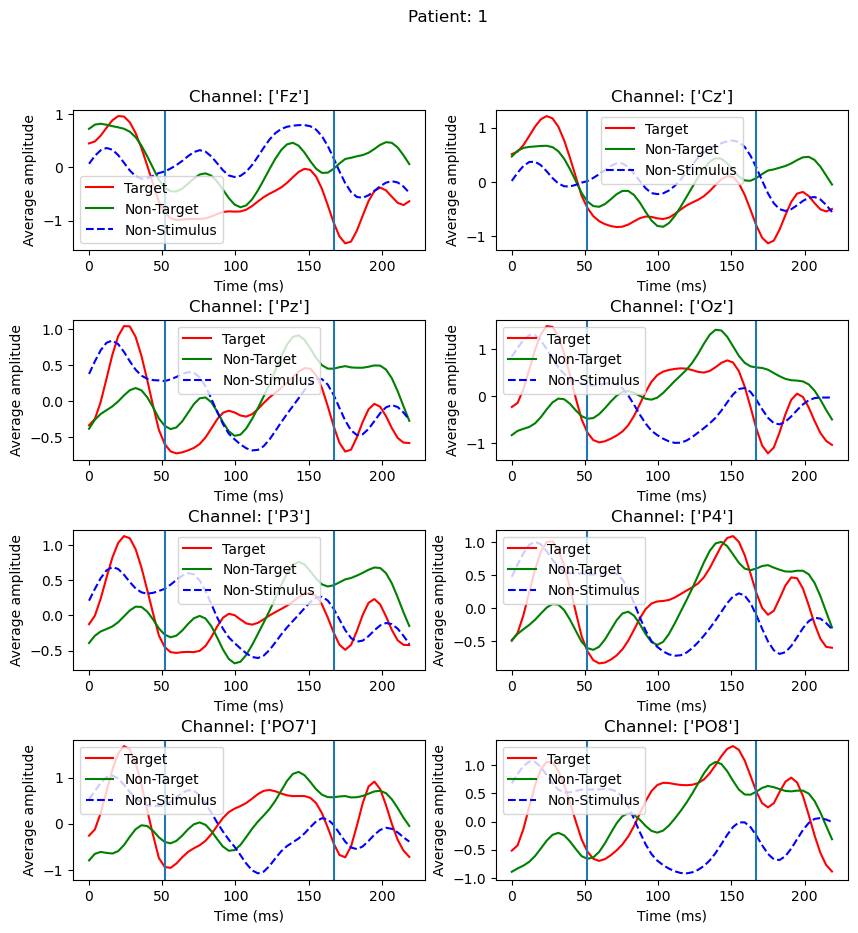

 12%|██████████▌                                                                         | 1/8 [00:02<00:16,  2.34s/it]

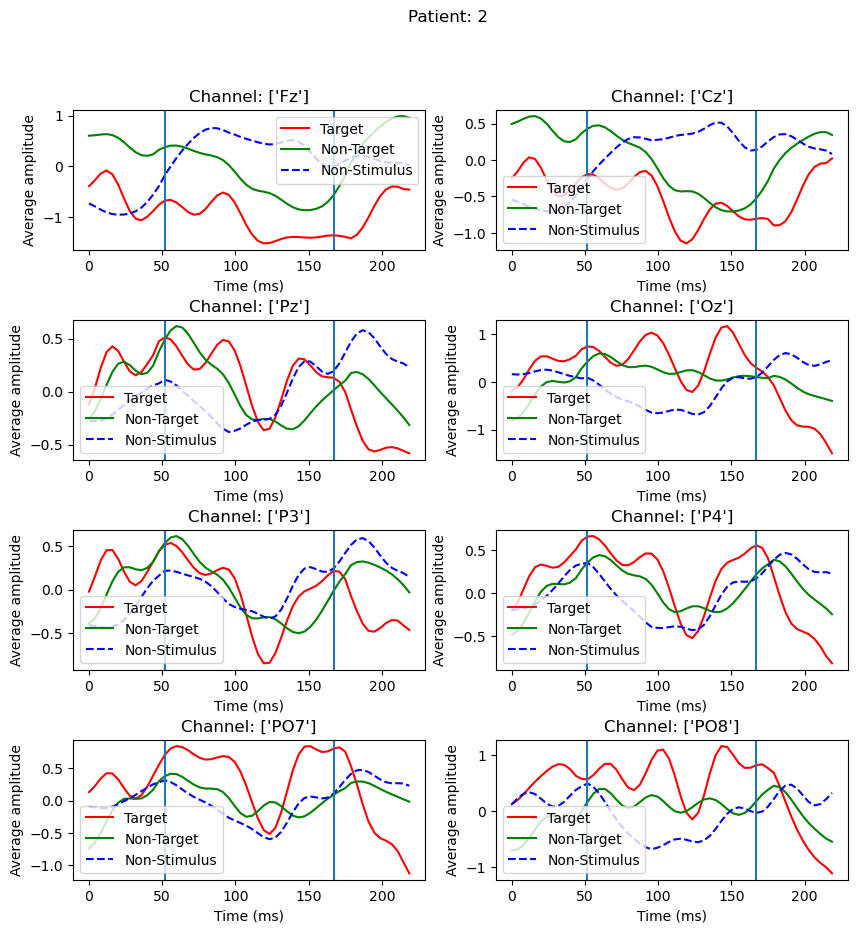

 25%|█████████████████████                                                               | 2/8 [00:04<00:14,  2.34s/it]

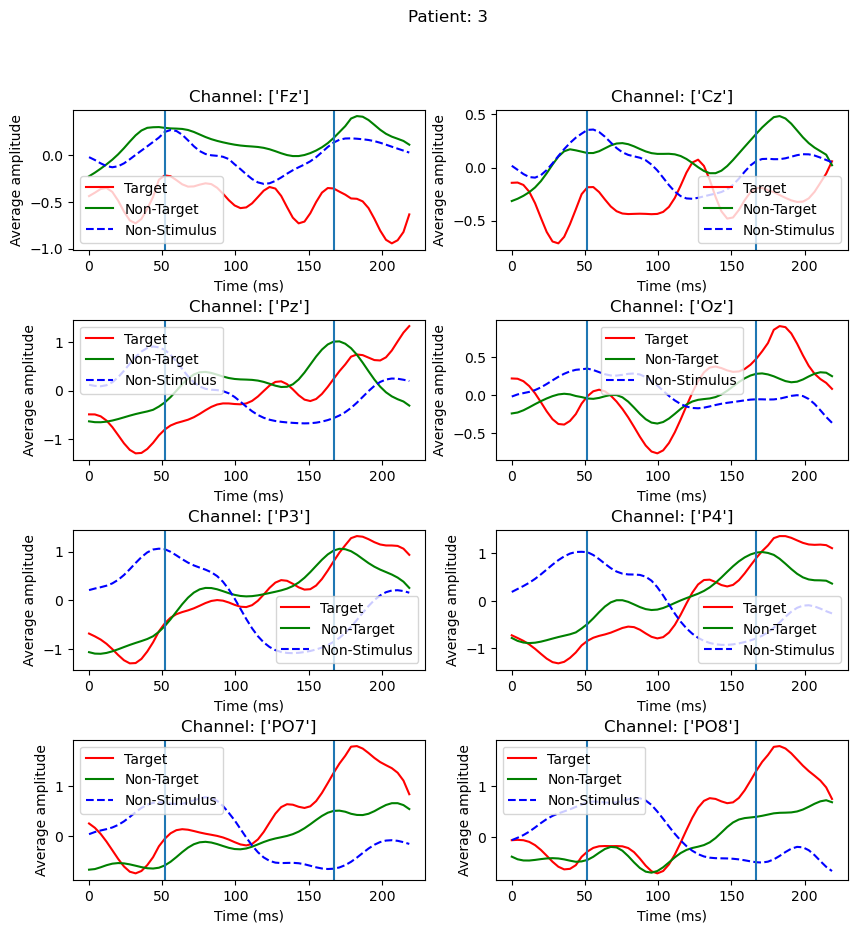

 38%|███████████████████████████████▌                                                    | 3/8 [00:06<00:11,  2.30s/it]

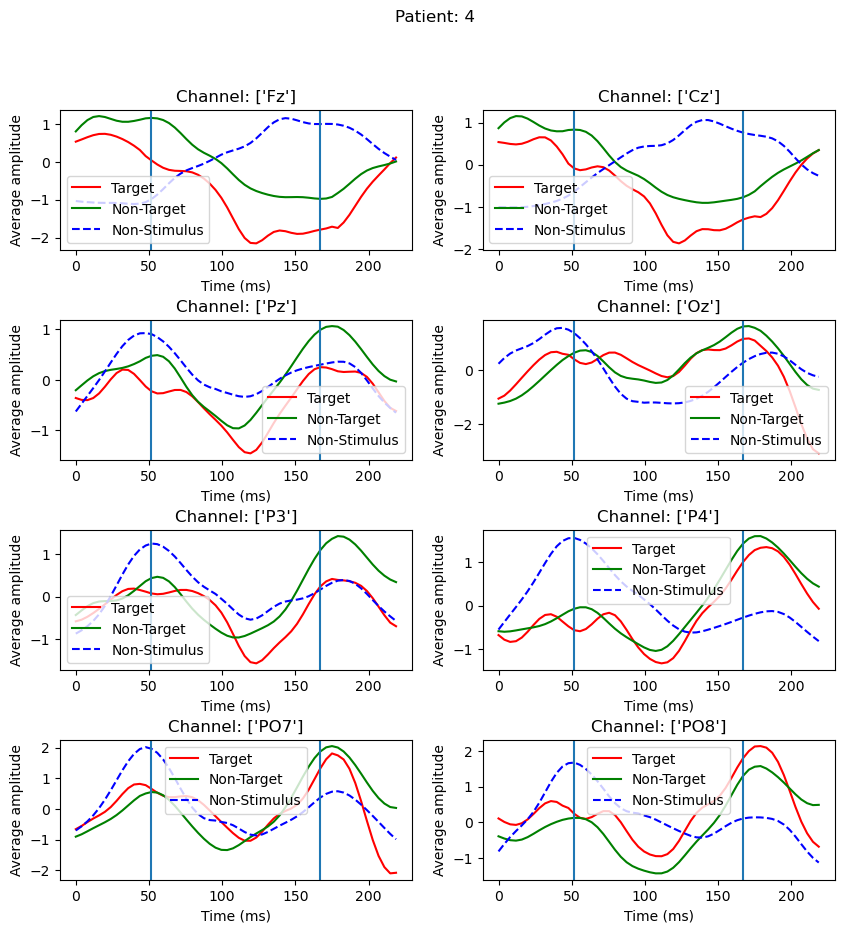

 50%|██████████████████████████████████████████                                          | 4/8 [00:09<00:09,  2.28s/it]

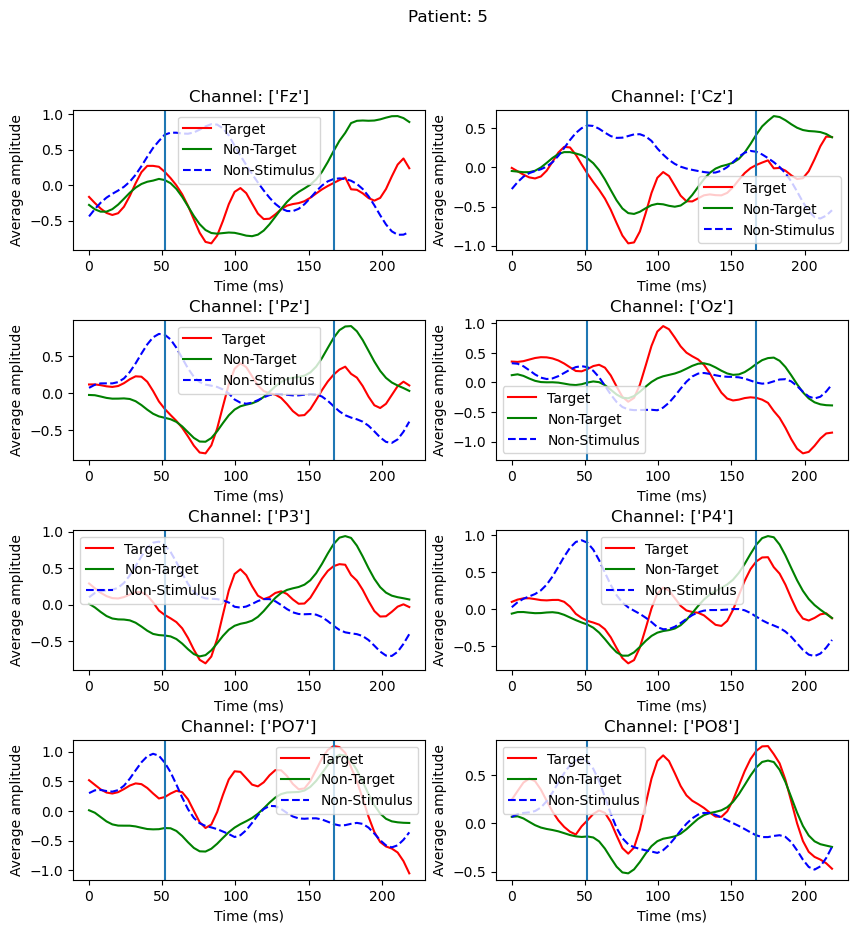

 62%|████████████████████████████████████████████████████▌                               | 5/8 [00:11<00:06,  2.21s/it]

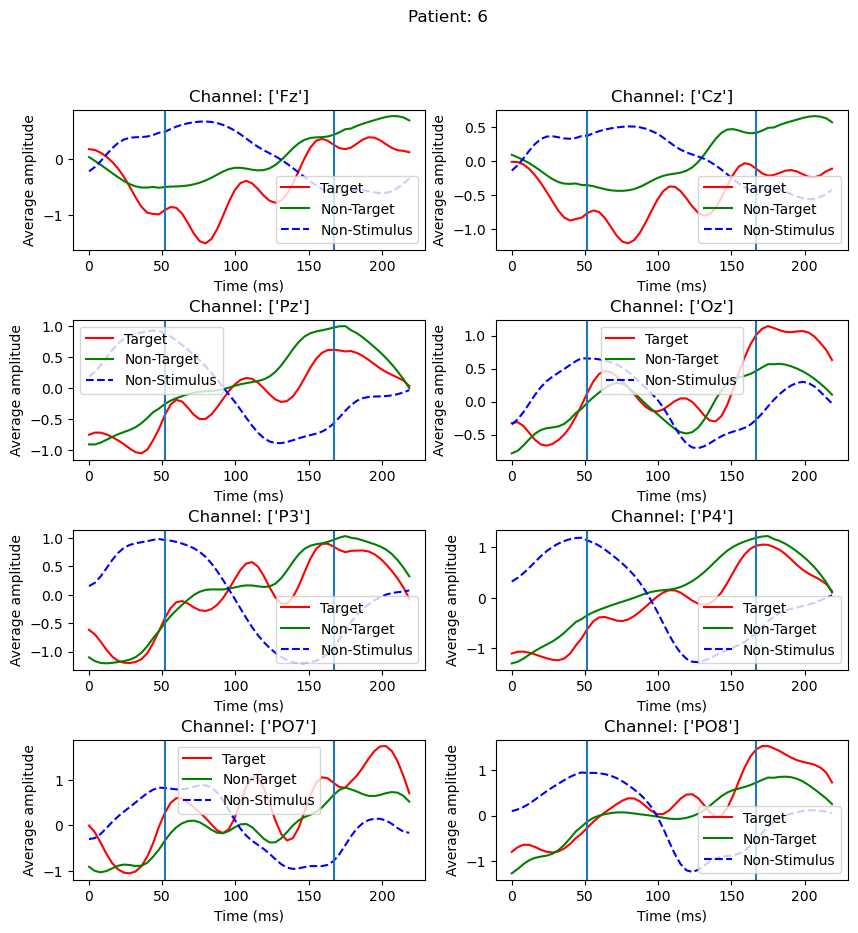

 75%|███████████████████████████████████████████████████████████████                     | 6/8 [00:13<00:04,  2.23s/it]

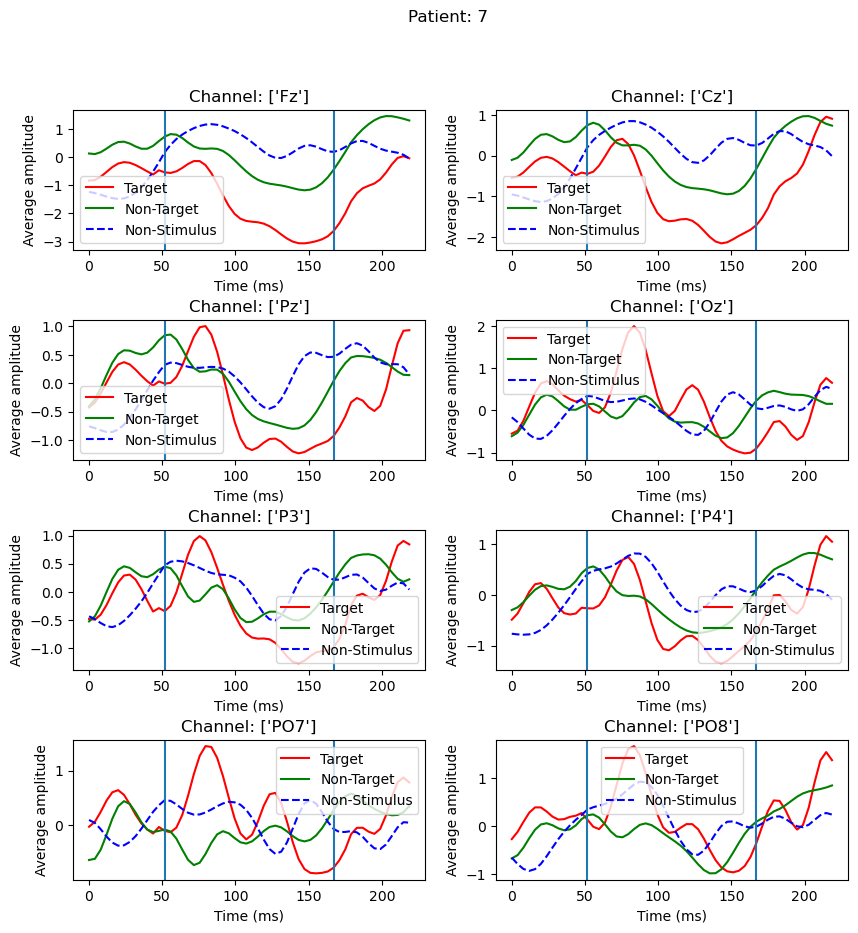

 88%|█████████████████████████████████████████████████████████████████████████▌          | 7/8 [00:15<00:02,  2.25s/it]

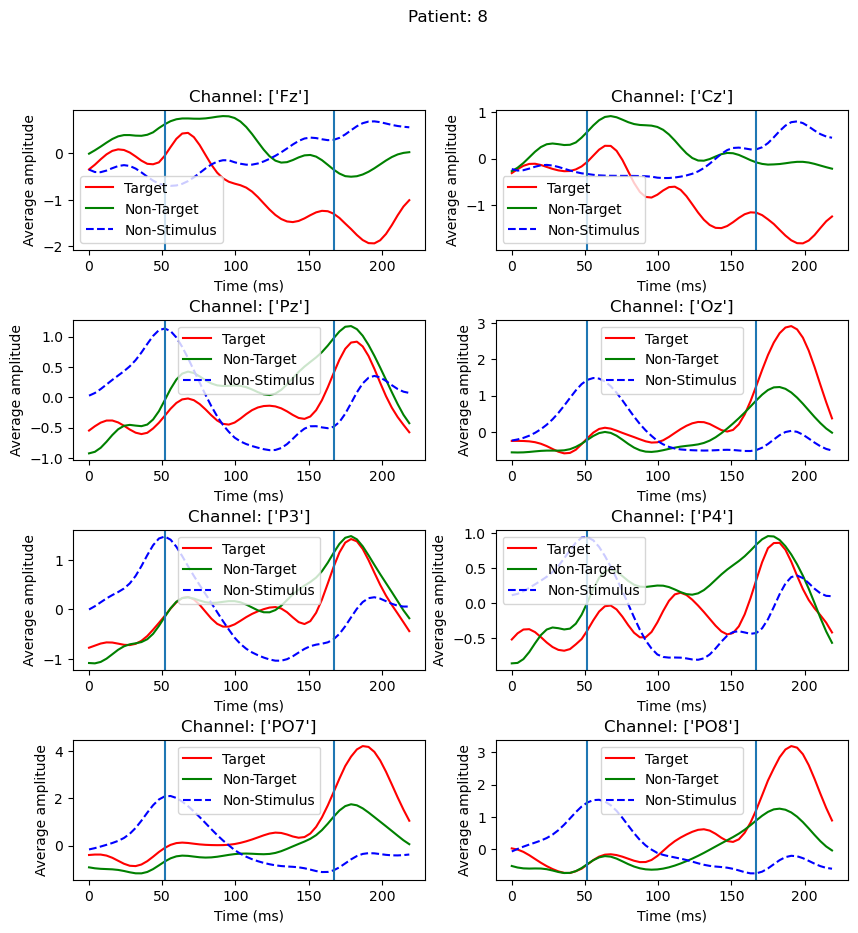

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:18<00:00,  2.26s/it]


In [32]:
additional_duration_of_waveform = 50 #ms
additional_samples = int(sample_frequency * additional_duration_of_waveform / 1000)

        


        
# Visualize channel output
for i in tqdm(range(X.shape[0])):
    cols = 2
    rows = X.shape[-1]//cols
    if int(rows) != rows:
        rows = int(rows) + 1
    else:
        rows = int(rows)
        
        
    fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
    plt.suptitle(f"Patient: {i+1}")
    current = 0
    waveforms = collect_waveform_for_each_stimulus_category(X[i], y_target[i], get_delayed_samples=additional_samples)
    for j in range(rows):
        for k in range(cols):
            ax[j, k].set_title(f"Channel: {get_channel_name(patient_data[i], current)}")
            
            
            mt = np.mean(get_padded_signals(waveforms[target_class][current]), axis=0)
            nt = np.mean(get_padded_signals(waveforms[non_target_class][current]), axis=0)
            ns = np.mean(get_padded_signals(waveforms[0][current]), axis=0)
            
            
            max_val = np.max([mt.size, nt.size, ns.size])
            counts = np.arange(max_val)
            x_axis = np.linspace(0, 1000*max_val/sample_frequency, counts.size)
            
            
            
            ax[j, k].plot(x_axis, mt, 'r-', label='Target')            
            ax[j, k].plot(x_axis, nt, 'g-', label='Non-Target')            
            ax[j, k].plot(x_axis, ns, 'b--', label='Non-Stimulus')
            
            ax[j, k].axvline((x_axis[np.where(x_axis >= additional_duration_of_waveform)[0][0]], ))
            ax[j, k].axvline((x_axis[np.where(x_axis <= total_duration - additional_duration_of_waveform)[0][-1]], ))
            
            
            ax[j, k].set_xlabel("Time (ms)")
            ax[j, k].set_ylabel("Average amplitude")
            
            current += 1
            
            ax[j, k].legend()
    plt.subplots_adjust(hspace=0.5)
    plt.show()

For most patients PO7, PO8, and Oz shows a pattern of action potential when target stimulus is provided. For some patients (patient 4 and 5), we can also observe a similar pattern for non-target stimulus. However, when no stimulus has been provided none of the channels of any patient show such pattern. We can atleast use this type of pattern to detect whether the patient is processing a stimulus or not.

# Frequency Analysis - Channel Specific

An action potential lasts about 100 ms on average and the duration of each stimulus is 125 ms. Furthermore, the action potential starts after about 30 ms when a stimulus is first provided. According to the paper, the signal was filtered between 0.1 Hz and 30 Hz. As a result we will only keep the positive values of frequencies between 1 and 30 Hz. 

Considering the average duration of an action potential and the frequencies that we want to observe during the action potential we need to find a window size that is small enough so that we can calculate the frequencies during the action potential but large enough that FFT provides us a satisfactory number of frequency bins between 0 and 30 Hz.




```
t = 1 # Duration of signal in seconds
sr = 44100 # Sampling frequency in Hs

x = np.linspace(0, t, sr*t) # Time points of the signal in seconds

# Here, 10, 200, and 70 are fundamental frequency of each sine wave
y = (10*np.sin(2.0 * np.pi * 10 * x)) + (2*np.sin(2.0 * np.pi * 100 * x)) + (5*np.sin(2.0 * np.pi * 70 * x)) # Signal

yf = fft(y) # Fft of signal
xf = fftfreq(y.size, 1/sr)[:y.size//2] # Calculate frequency bin where each index is a frequency

print(x.shape, y.shape, yf.shape, xf.shape)


plt.figure()
plt.subplot(2, 1, 1)
plt.plot(x, y)
plt.grid()
plt.subplot(2, 1, 2)
plt.plot(xf[:200], yf.real[:200])
plt.grid()
plt.show()
```

In [33]:
# Calculate the Short-Time Fourier Transform of the entire dataset
window_duration = 0.15 # 150 ms
window_size = int(window_duration*sample_frequency)
overlap = int(window_size * 0.10) # 10% overlap


X_f, X_t, X_fft = stft(X, fs=sample_frequency, nperseg=window_size, noverlap=overlap, axis=3)


# Calculate the target class for the foutier transform
y_target_fft = np.zeros(y_target.shape[:-1] + (1,), dtype=y_target.dtype)

for i in tqdm(range(0, y_target.shape[-1], window_size - overlap)):
    j = i + window_size
    if i > 0:
        i = i - overlap
        j = j + overlap
    data = y_target[:, :, :, i:j]

    s = np.zeros(y_target.shape[:-1] + (1,), dtype=y_target.dtype)
    non_targets = np.bitwise_or.reduce(np.where(data == non_target_class, True, False), axis=-1, keepdims=True)
    s[non_targets] = non_target_class
    targets = np.bitwise_or.reduce(np.where(data == target_class, True, False), axis=-1, keepdims=True)
    s[targets] = target_class
    y_target_fft = np.concatenate((y_target_fft, s), axis=-1)

    
print(X_f.shape, X_t.shape, X_fft.shape, y_target_fft.shape)


100%|█████████████████████████████████████████████████████████████████████████████| 219/219 [00:00<00:00, 13687.06it/s]

(20,) (220,) (8, 7, 5, 20, 8, 220) (8, 7, 5, 220)


[  9  10  11  17  18  30  31  33  34  50  51  59  60  66  67  79  80  92
  93 108 109 112 113 128 129 141 142 148 149 150 161 162 165 166 185 186
 192 193 205 206 209 210]


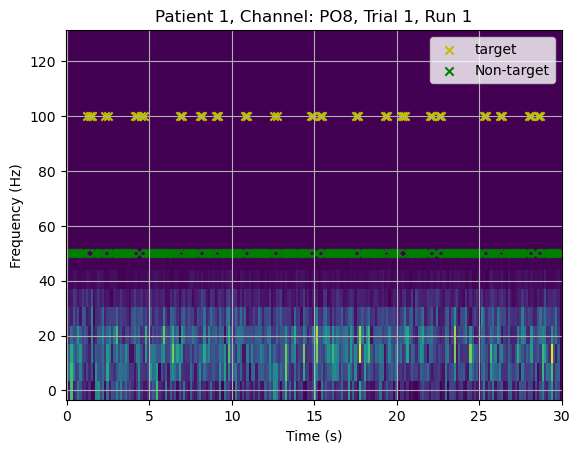

In [34]:
plt.figure()
plt.title(f"Patient 1, Channel: {get_channel_name(patient_data[0], 7)[0]}, Trial 1, Run 1")
plt.pcolormesh(X_t, X_f, np.abs(X_fft[0, 0, 0, :, 7, :]))
t = np.where(y_target_fft[0, 0, 0, :] == target_class)[0]
nt = np.where(y_target_fft[0, 0, 0, :] == non_target_class)[0]
print(t)
plt.scatter(X_t[t], y_target_fft[0, 0, 0, t]*50, marker='x', color='y', label='target')
plt.scatter(X_t[nt], y_target_fft[0, 0, 0, nt]*50, marker='x', color='g', label='Non-target')
plt.grid()
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.legend()
plt.show()

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10.93it/s]


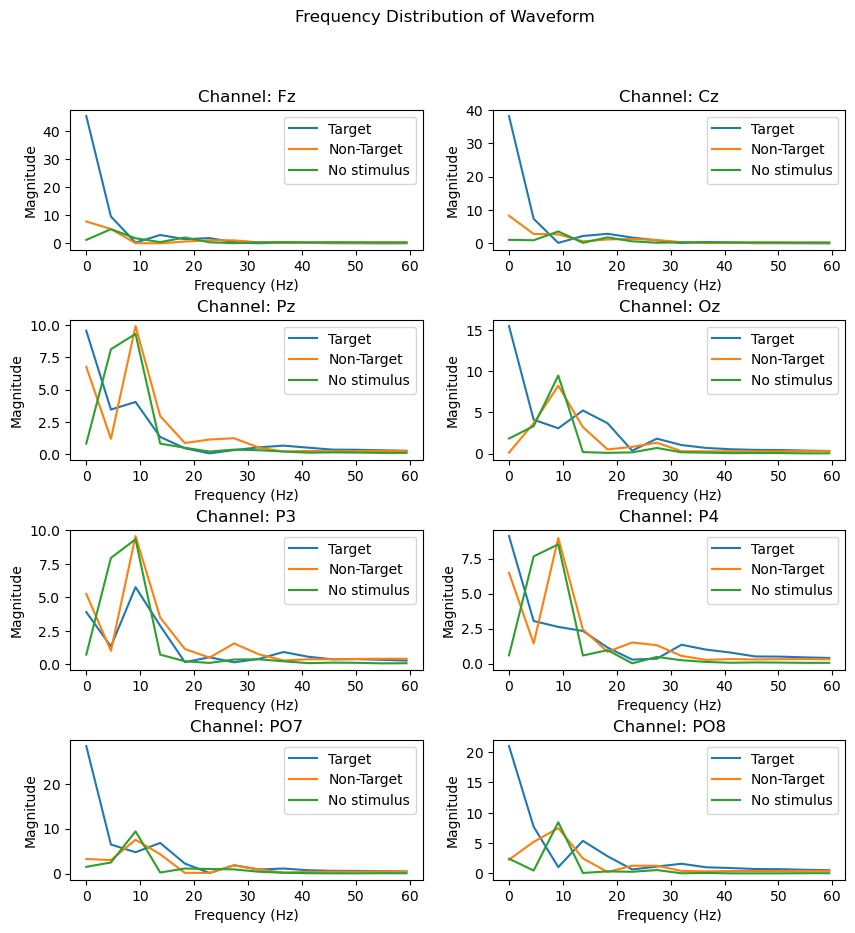

In [35]:
additional_duration_of_waveform = 50 #ms
additional_samples = int(sample_frequency * additional_duration_of_waveform / 1000)


mt_average = [None for _ in range(X.shape[-1])]
nt_average = [None for _ in range(X.shape[-1])]
ns_average = [None for _ in range(X.shape[-1])]

cols = 2
rows = X.shape[-1]//cols
if int(rows) != rows:
    rows = int(rows) + 1
else:
    rows = int(rows)
    
    
# Visualize channel output
for i in range(X.shape[0]):
    waveforms = collect_waveform_for_each_stimulus_category(X[i], y_target[i], get_delayed_samples=additional_samples, show_progress=True)
    for j in range(X.shape[-1]):    
        if mt_average[j] is None:
            mt_average[j] = np.mean(get_padded_signals(waveforms[target_class][j]), axis=0)
        else:
            mt_average[j] = np.mean(get_padded_signals([mt_average[j], np.mean(get_padded_signals(waveforms[target_class][j]), axis=0)]), axis=0)
            
        if nt_average[j] is None:
            nt_average[j] = np.mean(get_padded_signals(waveforms[non_target_class][j]), axis=0)
        else:
            nt_average[j] = np.mean(get_padded_signals([nt_average[j], np.mean(get_padded_signals(waveforms[non_target_class][j]), axis=0)]), axis=0)
        
        if ns_average[j] is None:
            ns_average[j] = np.mean(get_padded_signals(waveforms[0][j]), axis=0)
        else:
            ns_average[j] = np.mean(get_padded_signals([ns_average[j], np.mean(get_padded_signals(waveforms[0][j]), axis=0)]), axis=0)


fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
plt.suptitle("Frequency Distribution of Waveform")
current = 0
for j in range(rows):
    for k in range(cols):
        xf = fftfreq(mt_average[current].size, 1/sample_frequency)[:mt_average[current].size//2] # Calculate frequency bin where each index is a frequency
        freqs = np.where(xf < 60)[0]
        
        
        mt_fft = fft(mt_average[current]) # Fft of signal
        nt_fft = fft(nt_average[current]) # Fft of signal
        ns_fft = fft(ns_average[current]) # Fft of signal
        
        ax[j,k].plot(xf[freqs], np.abs(mt_fft[freqs].real), label='Target')
        ax[j,k].plot(xf[freqs], np.abs(nt_fft[freqs].real), label='Non-Target')
        ax[j,k].plot(xf[freqs], np.abs(ns_fft[freqs].real), label='No stimulus')
        
        ax[j, k].set_title(f"Channel: {get_channel_name(patient_data[0], current)[0]}")
        ax[j, k].set_xlabel("Frequency (Hz)")
        ax[j, k].set_ylabel("Magnitude")
        ax[j, k].legend()

        current += 1
        
plt.subplots_adjust(hspace=0.5)
plt.show()

We calculated the Fourier Transform of the average waveforms of Target, Non-Target, and No-Stimulus signals for each channel. We can see that during a target stimulus, the waveform has very high magnitude (> 20) in channels PO7 and P08. Moreover, we can notice a high concentration of low frequency (<15 Hz) i.e. alpha waves and also a small amount of frequency greater than 15 Hz i.e. beta waves. However, in case of non-target signal even though the concentration of low frequency is high, we do not see much contribution of frquency greater than 20 Hz. Moreover, the magnitude of non-target and no-stimulus signals are much less than target signal in these two regions. In regions PO7 and PO8 we can also see a slight higher magnitude of frequency greater than 30 Hz i.e. gamma waves in target stimulus.

This may be happening due to the fact that when the patient observes a target signal, the rate of firing of neuron increases.

Moreover, we can see that during a target stimulus, the magnitude of higher frequencies decrease a lot compared to the lower frequencies. On the other hand, for non-target stimuli the magnitude of frequencies is very similar throughout the entire event.

The magnitude of low frequency components in Fz and Cz region seems to be much higher for target stimuli compared to non-target stimuli.

As cited in [\[1\]](https://doi.org/10.1016/S0042-6989(00)00235-2), "Oscillations with 10 Hz comprise more synchronized neurons than oscillations with, e.g. 40 Hz. A simulation study performed by Lopes da Silva (1998) demonstrates the relationship between synchronously activated/inhibited neurons and frequency of brain oscillations. With an increasing number of interconnecting neurons and therewith an increasing number of coherently activated neurons, the frequency decreases and the amplitude increases. The lower alpha component has a larger spectral peak magnitude than the higher alpha component. "

  0%|                                                                                            | 0/8 [00:00<?, ?it/s]

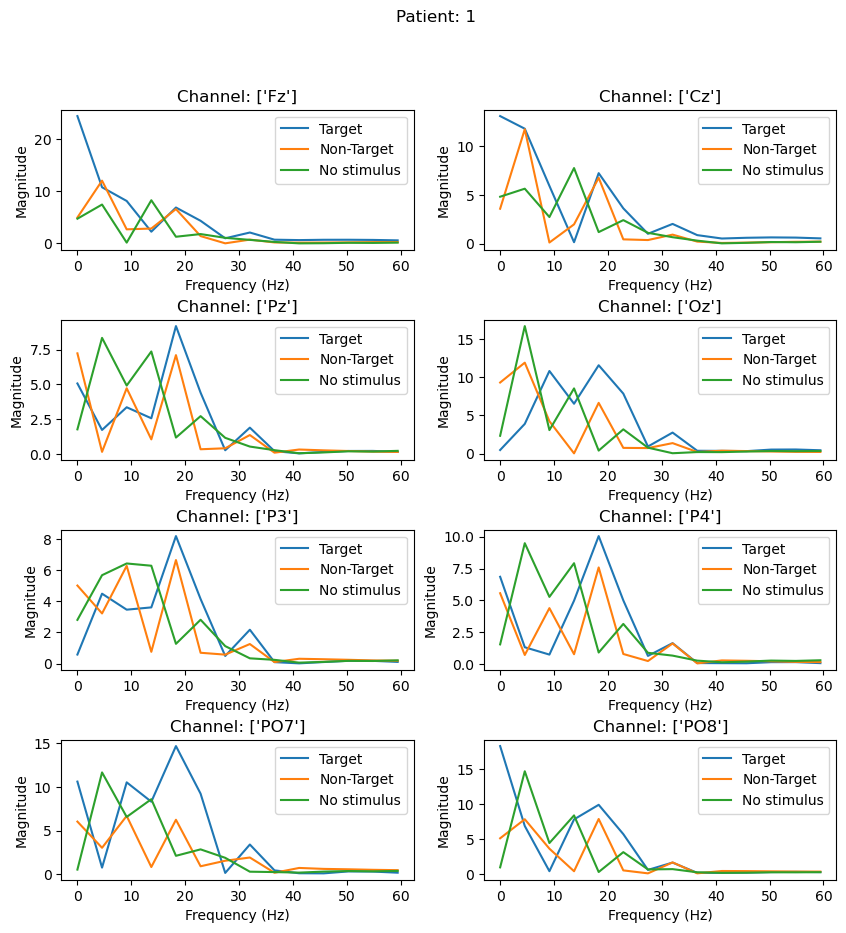

 12%|██████████▌                                                                         | 1/8 [00:02<00:15,  2.23s/it]

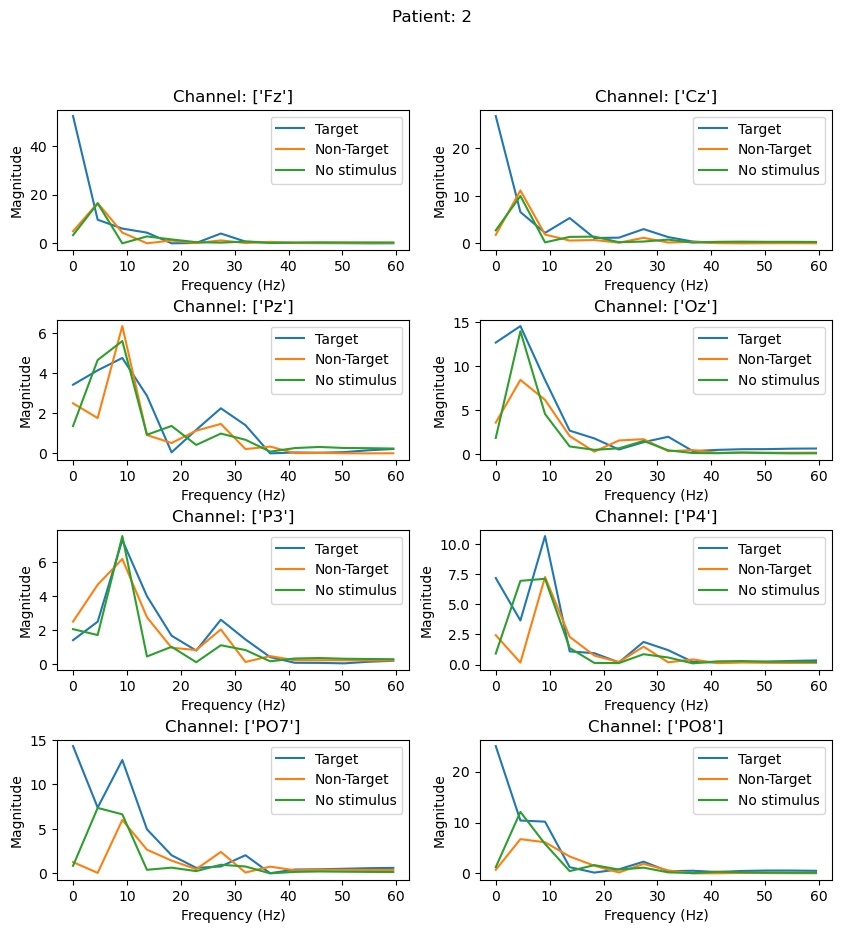

 25%|█████████████████████                                                               | 2/8 [00:04<00:12,  2.10s/it]

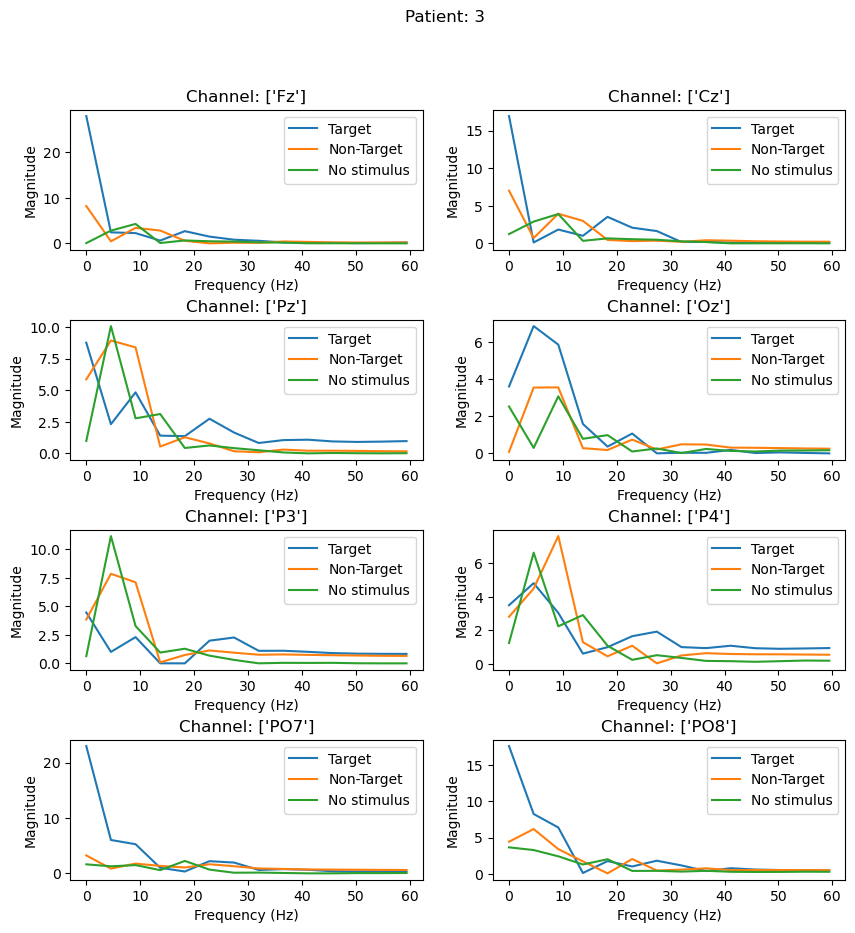

 38%|███████████████████████████████▌                                                    | 3/8 [00:06<00:10,  2.17s/it]

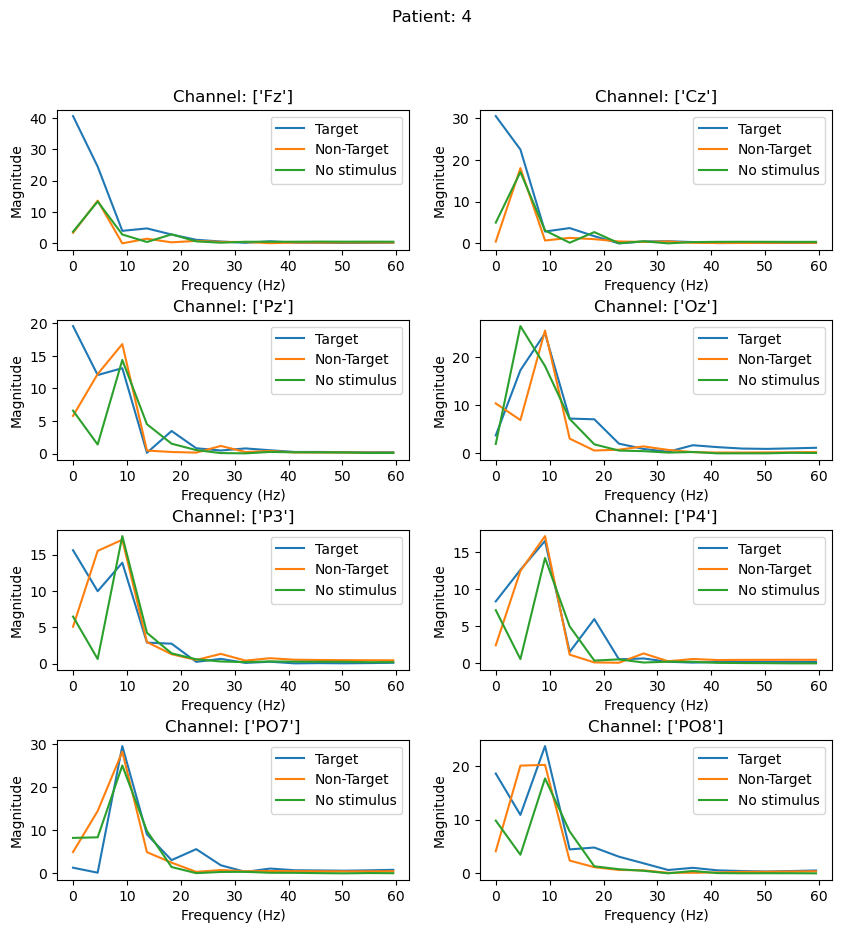

 50%|██████████████████████████████████████████                                          | 4/8 [00:08<00:08,  2.19s/it]

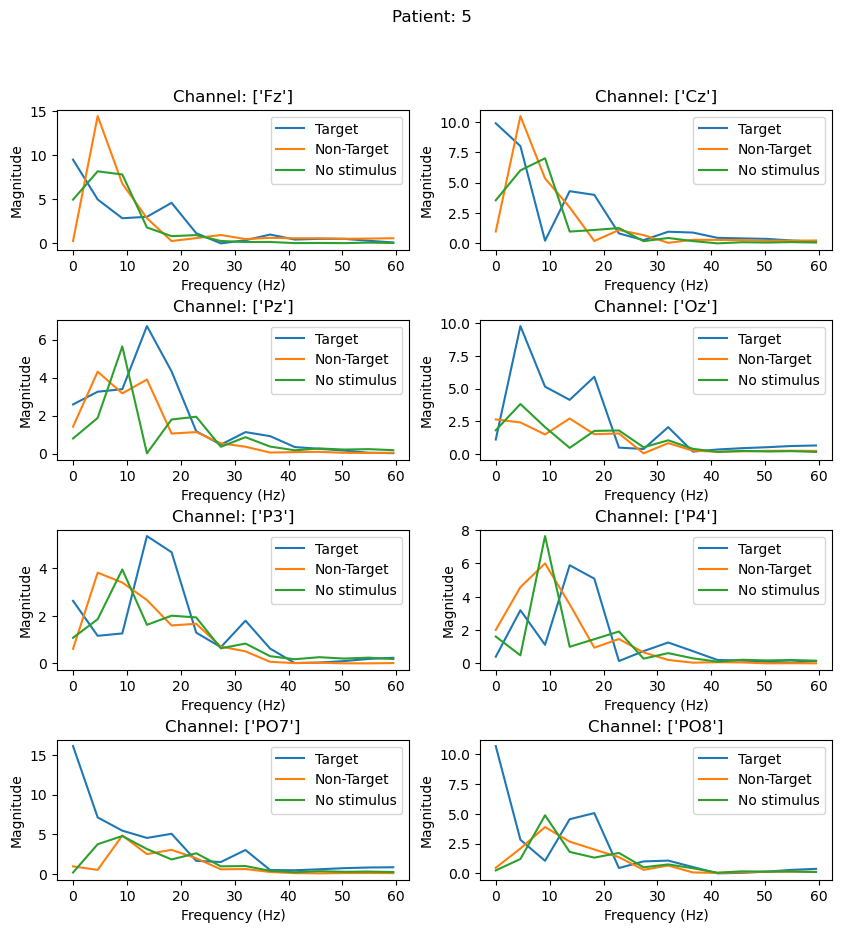

 62%|████████████████████████████████████████████████████▌                               | 5/8 [00:10<00:06,  2.21s/it]

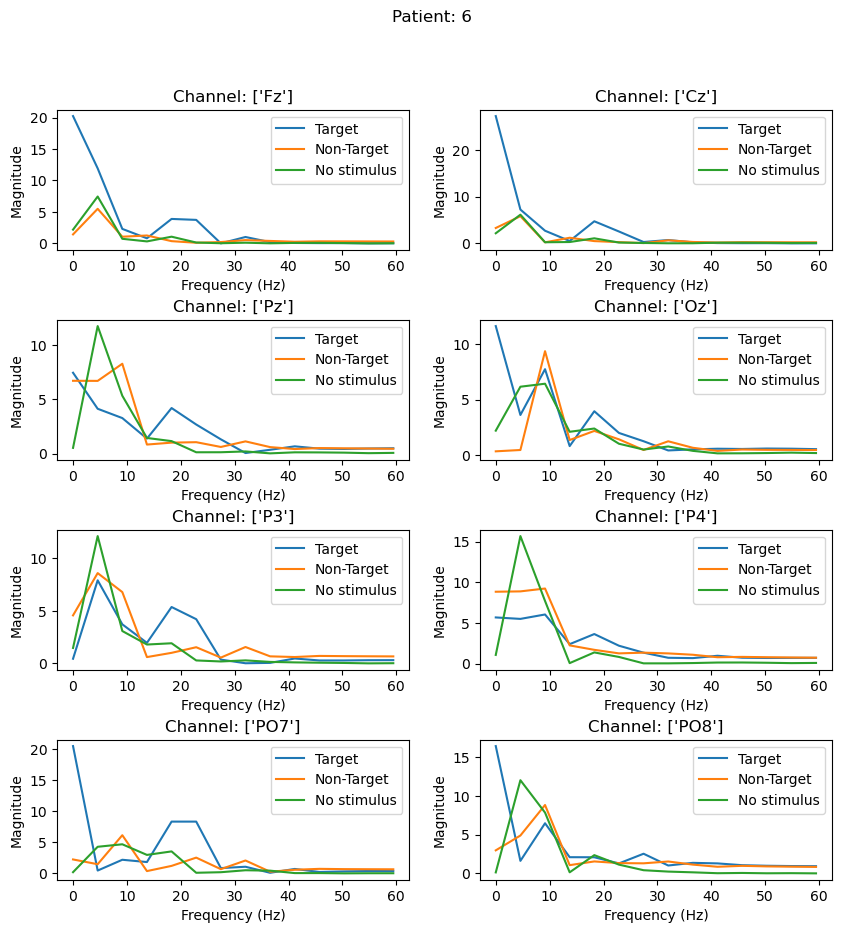

 75%|███████████████████████████████████████████████████████████████                     | 6/8 [00:13<00:04,  2.23s/it]

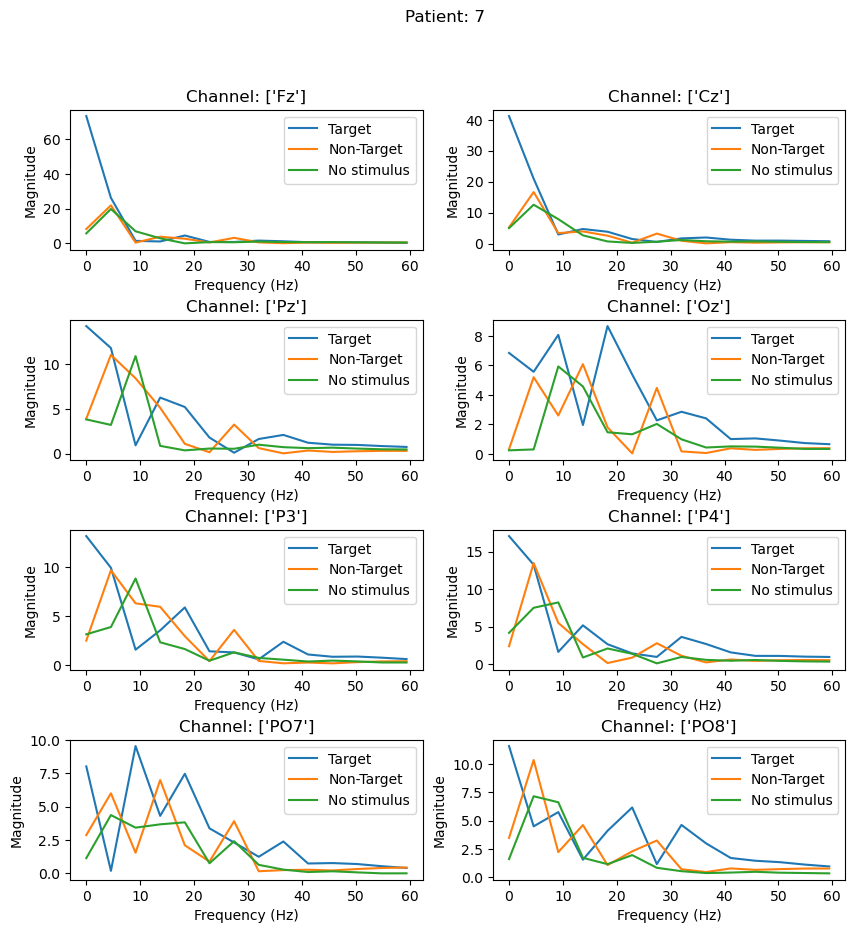

 88%|█████████████████████████████████████████████████████████████████████████▌          | 7/8 [00:15<00:02,  2.24s/it]

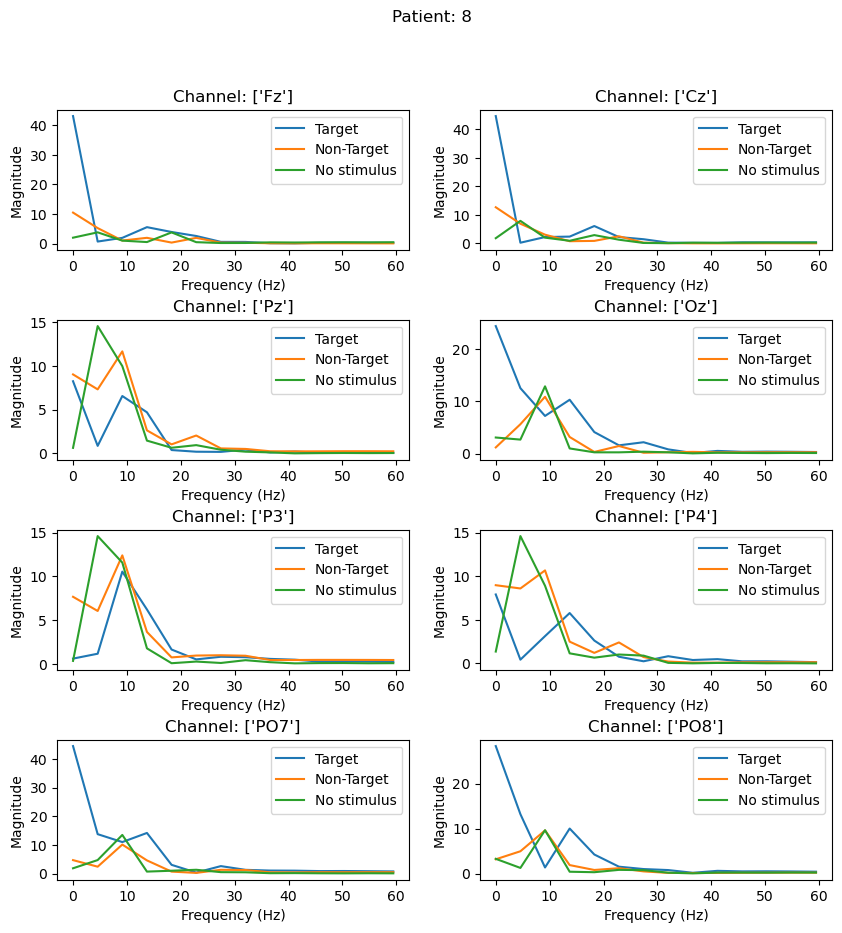

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:17<00:00,  2.22s/it]


In [36]:
additional_duration_of_waveform = 50 #ms
additional_samples = int(sample_frequency * additional_duration_of_waveform / 1000)

        


        
# Visualize channel output
for i in tqdm(range(X.shape[0])):
    cols = 2
    rows = X.shape[-1]//cols
    if int(rows) != rows:
        rows = int(rows) + 1
    else:
        rows = int(rows)
        
        
    fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
    plt.suptitle(f"Patient: {i+1}")
    current = 0
    waveforms = collect_waveform_for_each_stimulus_category(X[i], y_target[i], get_delayed_samples=additional_samples)
    for j in range(rows):
        for k in range(cols):
            ax[j, k].set_title(f"Channel: {get_channel_name(patient_data[i], current)}")
            
            
            mt = np.mean(get_padded_signals(waveforms[target_class][current]), axis=0)
            nt = np.mean(get_padded_signals(waveforms[non_target_class][current]), axis=0)
            ns = np.mean(get_padded_signals(waveforms[0][current]), axis=0)
            
            
            xf = fftfreq(mt.size, 1/sample_frequency)[:mt.size//2] # Calculate frequency bin where each index is a frequency
            freqs = np.where(xf < 60)[0]


            mt_fft = fft(mt) # Fft of signal
            nt_fft = fft(nt) # Fft of signal
            ns_fft = fft(ns) # Fft of signal

            ax[j,k].plot(xf[freqs], np.abs(mt_fft[freqs].real), label='Target')
            ax[j,k].plot(xf[freqs], np.abs(nt_fft[freqs].real), label='Non-Target')
            ax[j,k].plot(xf[freqs], np.abs(ns_fft[freqs].real), label='No stimulus')
            
            
            ax[j, k].set_xlabel("Frequency (Hz)")
            ax[j, k].set_ylabel("Magnitude")
            
            current += 1
            
            ax[j, k].legend()
    plt.subplots_adjust(hspace=0.5)
    plt.show()

**Patient 1**

a. Target Signal

- High ampliude of alpha frequency in Fz region. 
- High amplitude of beta waves (~20 Hz) in parietal and occipital region. 
- Slightly high gamma waves (~32 Hz) in P3, P4, PO7, and Oz.
- Low amplitude of alpha waves and high amplitude of beta waves in Oz, P3, and P4.


b. Non-Target Signal

- High amplitude of alpha wave.
- Small peak at row range of beta waves.

c. No-Stimulus Signal

- High alpha waves and low beta waves. Very low amplitude of gamma waves.

**Patient 2**

a. Target Signal

- High ampliude of alpha frequency in Fz, Oz, PO7, PO8 and Cz region. 
- Small peaks of beta waves (< 30 Hz) in Pz, P3, P4 region. 
- Slightly high gamma waves (~32 Hz) in PO8, PO7, and Oz.


b. Non-Target Signal

- High amplitude of alpha wave in Pz, Oz, P3, P4.
- Small peak at row range of beta waves in parietal and Oz region.

c. No-Stimulus Signal

- High alpha waves and low beta waves. Very low amplitude of gamma waves.

**Patient 3**

a. Target Signal

- High ampliude of alpha frequency in Fz, Cz, Oz, PO7, PO8 and Cz region. 
- Small peaks of beta waves (< 30 Hz) in Pz, Oz, P3, P4 region. 
- Low gamma wave.


b. Non-Target Signal

- High amplitude of alpha wave in Pz, Oz, and P3.
- Small peak at row range of beta waves in parietal and Oz, and PO8 region.

c. No-Stimulus Signal

- High alpha waves in Pz, Oz, P3, P4 region. Low beta waves. Very low amplitude of gamma waves.

**Patient 4**

a. Target Signal

- High ampliude of alpha frequency in all regions. 
- Small peaks of beta waves (< 30 Hz) in Pz, Oz, P3, P4, PO7, and PO8 region. 
- Low gamma wave. Small peak at Oz.


b. Non-Target Signal

- High amplitude of alpha wave in parietal and Oz.
- Small peak at row range of beta waves in parietal and Oz, P4, and P3 region.

c. No-Stimulus Signal

- High alpha waves in all regions. Low beta waves. Very low amplitude of gamma waves.

**Patient 5**

a. Target Signal

- High ampliude of alpha frequency in all regions. 
- High peaks of beta waves (< 20 Hz) in all regions. 
- Small peaks at gamma waves (~ 30 Hz) in all regions.


b. Non-Target Signal

- High amplitude of alpha wave in P3, P4, Fz, and Cz.
- Small peak at row range of beta waves in occipital and parietal region.
- Small peaks of gamma wave in Oz and parietal region.

c. No-Stimulus Signal

- High alpha waves in all regions. Low beta waves. Very low amplitude of gamma waves.


**Patient 6**

a. Target Signal

- High ampliude of alpha frequency in Fz, Cz, PO7, and PO8. 
- High peaks of beta waves (< 20 Hz) in all regions. 
- Low gamma wave.


b. Non-Target Signal

- High amplitude of alpha wave in P3, P4, Pz, and Oz.
- Small peak at row range of beta waves in P3, P4, PO7, and PO8.
- Small peaks of gamma wave in parietal and occipital region.

c. No-Stimulus Signal

- High alpha waves in parietal region. Low beta waves. Very low amplitude of gamma waves.


**Patient 7**

a. Target Signal

- High ampliude of alpha frequency in Fz, Cz, PO7, and PO8. 
- High peaks of beta waves (< 20 Hz) in all regions. 
- Peaks at gamma waves (> 30 Hz) at parietal and occipital region.


b. Non-Target Signal

- High amplitude of alpha wave in parietal and Oz.
- High amplitude beta waves in parietal and occipital region.
- Low gamma waves.

c. No-Stimulus Signal

- High alpha waves in all regions. Low beta waves. Very low amplitude of gamma waves.

**Patient 8**

a. Target Signal

- High amplitude of alpha wave in all region.
- Small peaks of beta waves in parietal and occipital region.
- Low gamma waves.


b. Non-Target Signal

- High amplitude of alpha wave in P3, P4, Pz, and Oz.
- Small peaks of beta waves in parietal region.
- Low gamma waves.

c. No-Stimulus Signal

- High alpha waves in parietal region. Low beta waves. Very low amplitude of gamma waves.


# Dimensionality Reduction Visualization of Signals

We will divide the signals into three categories - Target, Non-target, and No-Stimulus. We will use the channels PO7, PO8, and Oz. We will use the sequence of waveforms that we generated earlier for each category of signals for each channel. We will use to reduce the dimensionality so that we can visualize the cluster. 

In [37]:
additional_duration_of_waveform = 50 #ms
additional_samples = int(sample_frequency * additional_duration_of_waveform / 1000)

all_channels = [get_channel_name(patient_data[0], current)[0] for current in range(X.shape[-1])]
used_channels = ['PO7', 'PO8', 'Oz']


def visualize_cluster(channel_names, method='tsne', to_frequency=False, weight_by_frequency=False):
    current_channels = [all_channels.index(channel_name) for channel_name in channel_names]
    x = None
    y = []

    for i in range(X.shape[0]):
        waveforms = collect_waveform_for_each_stimulus_category(X[i], y_target[i], get_delayed_samples=additional_samples, show_progress=True)
        if x is None:
            a = get_padded_signals(waveforms[target_class][current_channels[0]])
            if to_frequency:
                a = np.abs(fft(a, axis=-1).real)
                if weight_by_frequency:
                    a = a[:, :a.shape[-1]//2] * fftfreq(a.shape[-1], 1/sample_frequency)[:a.shape[-1]//2] # Weight by frequency
                
            for c in current_channels[1:]:
                b = get_padded_signals(waveforms[target_class][c])
                if to_frequency:
                    b = np.abs(fft(b, axis=-1).real)
                    if weight_by_frequency:
                        b = b[:, :b.shape[-1]//2] * fftfreq(b.shape[-1], 1/sample_frequency)[:b.shape[-1]//2] # Weight by frequency
                        
                a = np.concatenate((a, b), axis=-1)
            x = a
            y = y + [target_class]*x.shape[0]
        else:
            p = get_padded_signals(waveforms[target_class][current_channels[0]])
            if to_frequency:
                p = np.abs(fft(p, axis=-1).real)
                if weight_by_frequency:
                    p = p[:, :p.shape[-1]//2] * fftfreq(p.shape[-1], 1/sample_frequency)[:p.shape[-1]//2] # Weight by frequency
            for c in current_channels[1:]:
                b = get_padded_signals(waveforms[target_class][c])
                if to_frequency:
                    b = np.abs(fft(b, axis=-1).real)
                    if weight_by_frequency:
                        b = b[:, :b.shape[-1]//2] * fftfreq(b.shape[-1], 1/sample_frequency)[:b.shape[-1]//2] # Weight by frequency
                p = np.concatenate((p, b), axis=-1)
            x = np.concatenate((x, p), axis=0)
            y = y + [target_class] * p.shape[0]
            
        p = get_padded_signals(waveforms[non_target_class][current_channels[0]])
        if to_frequency:
            p = np.abs(fft(p, axis=-1).real)
            if weight_by_frequency:
                p = p[:, :p.shape[-1]//2] * fftfreq(p.shape[-1], 1/sample_frequency)[:p.shape[-1]//2] # Weight by frequency
        for c in current_channels[1:]:
            b  = get_padded_signals(waveforms[non_target_class][c])
            if to_frequency:
                b = np.abs(fft(b, axis=-1).real)
                if weight_by_frequency:
                    b = b[:, :b.shape[-1]//2] * fftfreq(b.shape[-1], 1/sample_frequency)[:b.shape[-1]//2] # Weight by frequency
            p = np.concatenate((p, b), axis=-1)
        x = np.concatenate((x, p), axis=0)
        y = y + [non_target_class] * p.shape[0]
        
        p = get_padded_signals(waveforms[0][current_channels[0]])
        if to_frequency:
            p = np.abs(fft(p, axis=-1).real)
            if weight_by_frequency:
                p = p[:, :p.shape[-1]//2] * fftfreq(p.shape[-1], 1/sample_frequency)[:p.shape[-1]//2] # Weight by frequency
        for c in current_channels[1:]:
            b = get_padded_signals(waveforms[0][c])
            if to_frequency:
                b = np.abs(fft(b, axis=-1).real)
                if weight_by_frequency:
                    b = b[:, :b.shape[-1]//2] * fftfreq(b.shape[-1], 1/sample_frequency)[:b.shape[-1]//2] # Weight by frequency
                    
            p = np.concatenate((p, b), axis=-1)
        x = np.concatenate((x, p), axis=0)
        y = y + [0] * p.shape[0]
        
    y = np.array(y)
    x = np.array(x)
    print(x.shape, y.shape)
    if method == 'tsne':
        x = TSNE(n_components=2, verbose=1, random_state=123).fit_transform(x)
    elif method == 'pca':
        x = PCA(n_components=2).fit(x).transform(x)
    elif method == 'lda':
        x = LinearDiscriminantAnalysis(n_components=2).fit(x, y).transform(x)
    
    plt.figure(figsize=(10,10))
    plt.title(f"{method.upper()} - Channels: {','.join(channel_names)}")
    plt.scatter(x[y == target_class, 0], x[y == target_class, 1], color='r', label='Target', alpha=0.5)
    plt.scatter(x[y == non_target_class, 0], x[y == non_target_class, 1], color='b', label='Non-Target', alpha=0.5)
    plt.scatter(x[y == 0, 0], x[y == 0, 1], color='g', label='No Stimulus', alpha=0.5)
    plt.legend()
    plt.grid()
    plt.show()
    
    


## PCA

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.05it/s]


(67200, 168) (67200,)


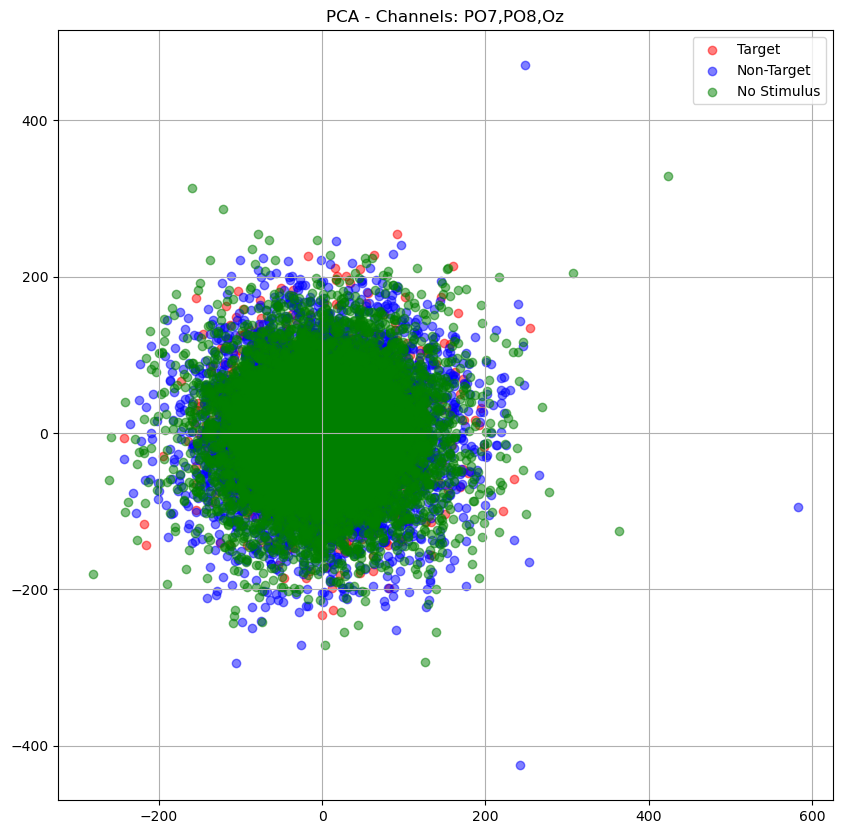

In [38]:
visualize_cluster(used_channels, method='pca')

##  LDA

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10.60it/s]


(67200, 168) (67200,)


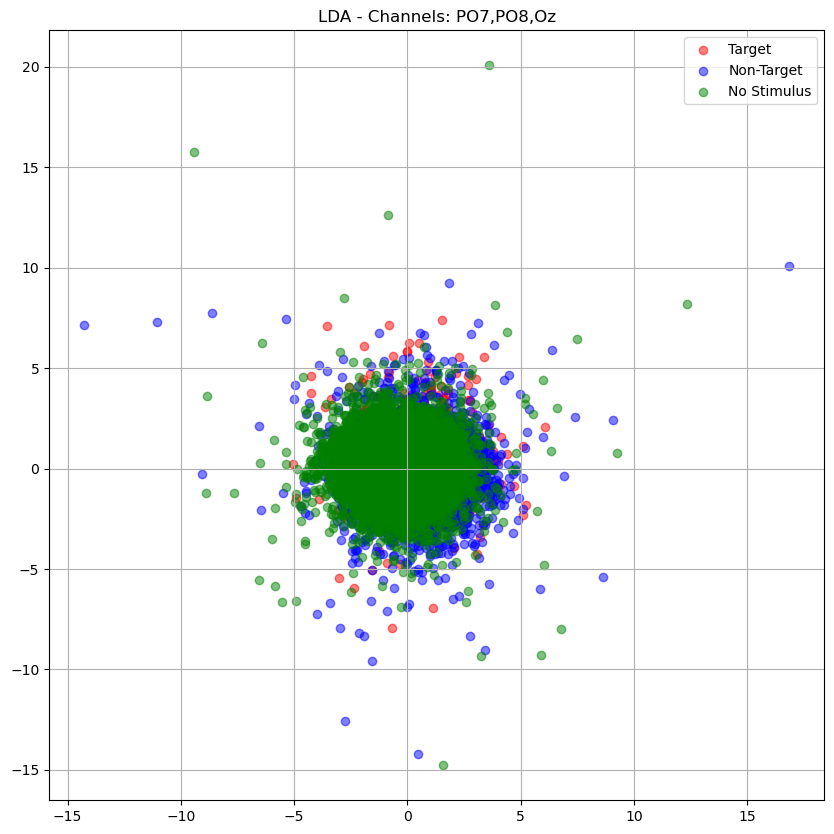

In [39]:
visualize_cluster(used_channels, method='lda')

## T-SNE

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  6.80it/s]
E:\AnacondaInstalled\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

E:\AnacondaInstalled\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



(67200, 168) (67200,)
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 67200 samples in 0.017s...
[t-SNE] Computed neighbors for 67200 samples in 80.629s...
[t-SNE] Computed conditional probabilities for sample 1000 / 67200
[t-SNE] Computed conditional probabilities for sample 2000 / 67200
[t-SNE] Computed conditional probabilities for sample 3000 / 67200
[t-SNE] Computed conditional probabilities for sample 4000 / 67200
[t-SNE] Computed conditional probabilities for sample 5000 / 67200
[t-SNE] Computed conditional probabilities for sample 6000 / 67200
[t-SNE] Computed conditional probabilities for sample 7000 / 67200
[t-SNE] Computed conditional probabilities for sample 8000 / 67200
[t-SNE] Computed conditional probabilities for sample 9000 / 67200
[t-SNE] Computed conditional probabilities for sample 10000 / 67200
[t-SNE] Computed conditional probabilities for sample 11000 / 67200
[t-SNE] Computed conditional probabilities for sample 12000 / 67200
[t-SNE] Computed conditiona

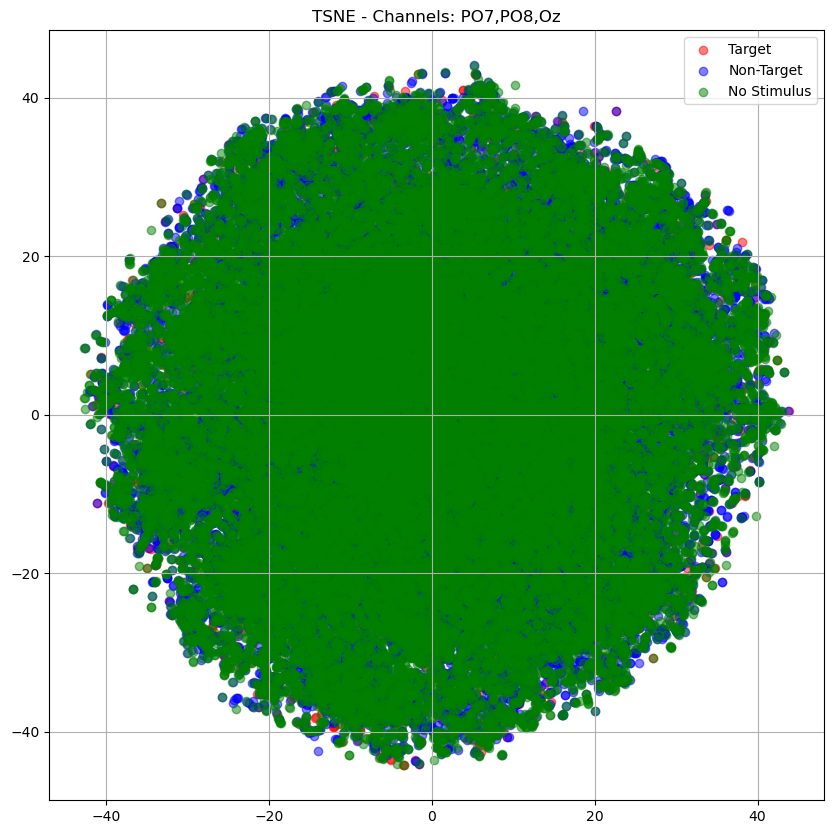

In [127]:
visualize_cluster(used_channels, method='tsne')


# Dimensionality Reduction Visualization of Frequency

## PCA

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.02it/s]


(67200, 84) (67200,)


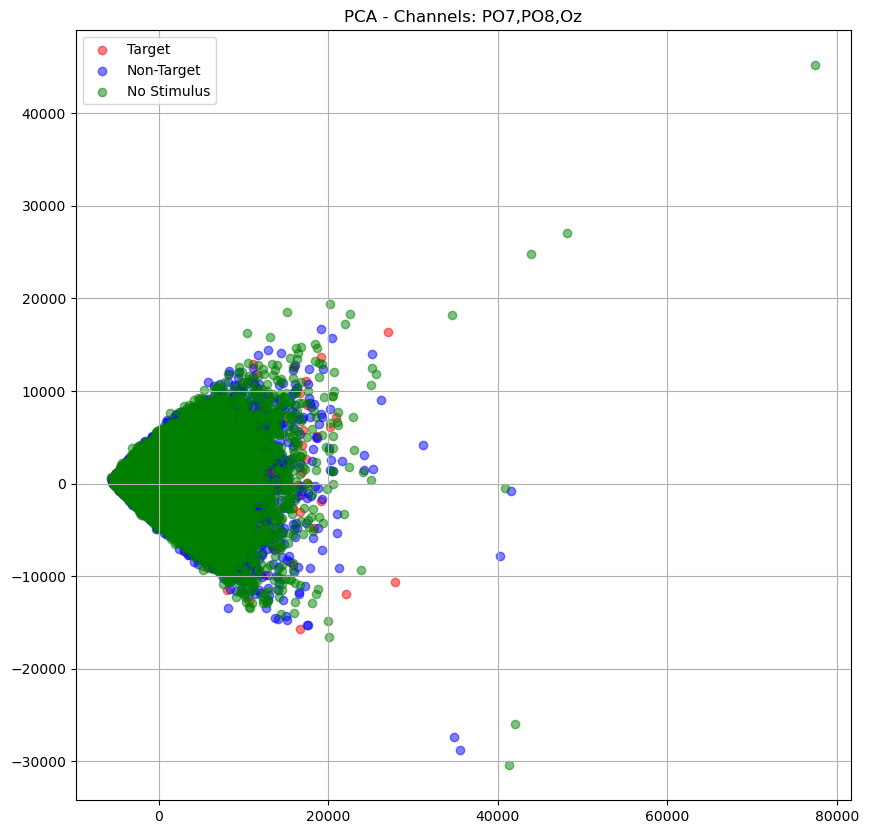

In [40]:
visualize_cluster(used_channels, method='pca', to_frequency=True, weight_by_frequency=True)

## LDA

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10.69it/s]


(67200, 84) (67200,)


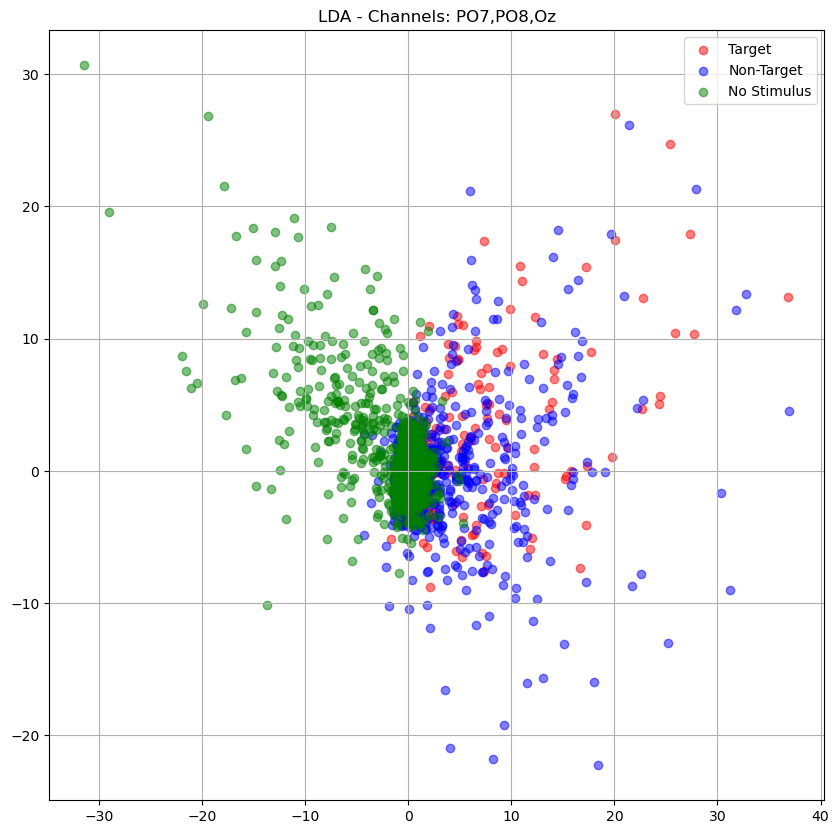

In [41]:
visualize_cluster(used_channels, method='lda', to_frequency=True, weight_by_frequency=True)

## T-SNE

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  6.82it/s]
E:\AnacondaInstalled\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

E:\AnacondaInstalled\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



(67200, 84) (67200,)
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 67200 samples in 0.009s...
[t-SNE] Computed neighbors for 67200 samples in 80.190s...
[t-SNE] Computed conditional probabilities for sample 1000 / 67200
[t-SNE] Computed conditional probabilities for sample 2000 / 67200
[t-SNE] Computed conditional probabilities for sample 3000 / 67200
[t-SNE] Computed conditional probabilities for sample 4000 / 67200
[t-SNE] Computed conditional probabilities for sample 5000 / 67200
[t-SNE] Computed conditional probabilities for sample 6000 / 67200
[t-SNE] Computed conditional probabilities for sample 7000 / 67200
[t-SNE] Computed conditional probabilities for sample 8000 / 67200
[t-SNE] Computed conditional probabilities for sample 9000 / 67200
[t-SNE] Computed conditional probabilities for sample 10000 / 67200
[t-SNE] Computed conditional probabilities for sample 11000 / 67200
[t-SNE] Computed conditional probabilities for sample 12000 / 67200
[t-SNE] Computed conditional

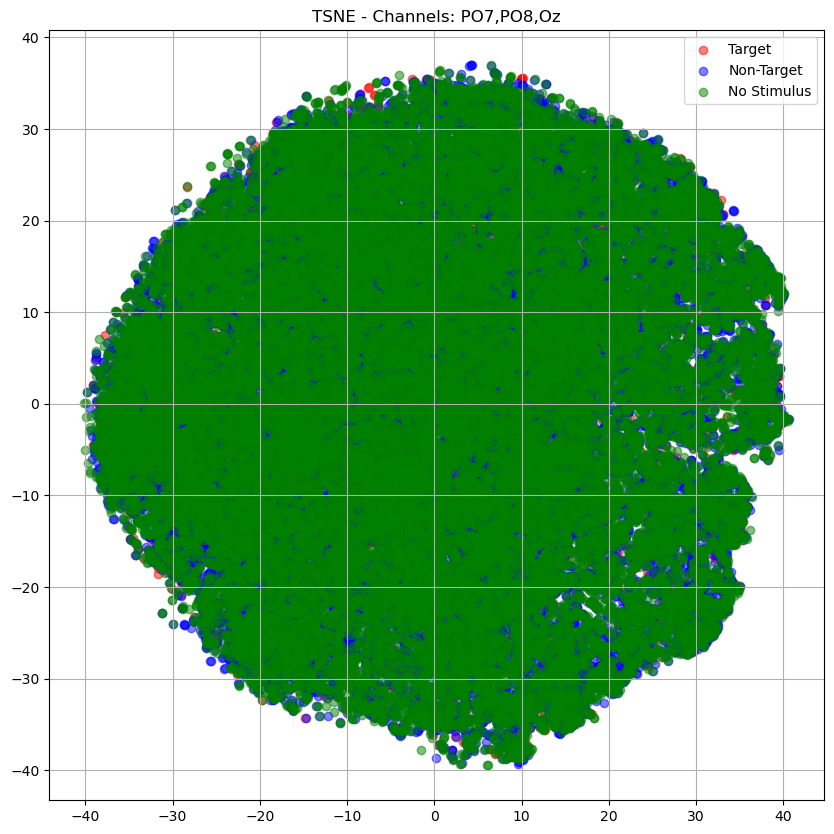

In [148]:
visualize_cluster(used_channels, method='tsne', to_frequency=True, weight_by_frequency=True)

To visualize the dataset, we used different dimensionality reduction techniques to reduce the number of features in the dataset and used the top two features to visualize the distribution of data. 

### Waveform Visualization

For the first case we used the waveform of each target, non-target, and no-stimulus signals. However, the distribution of the data was very random. To generate the waveform we performed the following task:

1. We took the data of each patient and created a single vector that contains the signal from each trial and run arranged sequentially. This created a vector of size (N, M, C) where 'N' is the number of patients, 'M' is the number of sample points for each patient, and 'C' is the number of EEG channels.


2. For each patient - we split the signal of each channel into multiple segments. Each segment is a waveform that was generated during one of the following events: No stimulus was provided, non-target stimulus was provided, and target stimulus was provided. For each patient this created a vector of size (P, Q, C) where 'P' is the number of segments, 'Q' is the number of samples in each sample, and 'C' is the number of channels.


3. We extended each sample by 100 ms - 50 ms in the past and 50 ms in the future since we saw earlier that when a stimulus is provided, the corresponding waveform changes around 50 ms after the stimulus and lasts for around 100 ms. This created a vector of size (P,R,C) where 'R' is equal to the sum of 'Q' and number of sample points available in a 100 ms waveform. The first and the last segment was padded to the left and right by the leftmost and rightmost value of the sample points correspondingly.


4. For each patient we placed each segment one after the another in sequence to change the output of the vector to (P*R, C).


5. Since the duration of each target, non-target, and non-stimulus waveform is of the same length we achieved the final vector which is of the shape (N,P\*R,C).


6. Since dimensionality reduction techniques accept a vector with two dimensions we had to remove the channel dimension from the dataset. To do this we squashed the sample points of all channels into a single dimension and created a vector of size (N, P\*R\*C).

### Frequency Visualization

For the second case we used the same waveform we obtained in the first case but this time we extracted the fourier transform of the signal. We multiplied each fourier coefficient with the corresponding frequency band to get a weighted value of each frequency band. We then performed dimensionality reduction on these features and created a plot of the top two features. In this case we can see that LDA was able to do a decent task of splitting the non-simulus signals and the stimulus signals. It was not able to separate the target and non-target stimulus but it was able to separate the signals that were produced when the patient received a stimulus versus when the patient did not receive any stimulus. To create the dataset we performed the following task:

1. We took the data of each patient and created a single vector that contains the signal from each trial and run arranged sequentially. This created a vector of size (N, M, C) where 'N' is the number of patients, 'M' is the number of sample points for each patient, and 'C' is the number of EEG channels.


2. For each patient - we split the signal of each channel into multiple segments. Each segment is a waveform that was generated during one of the following events: No stimulus was provided, non-target stimulus was provided, and target stimulus was provided. For each patient this created a vector of size (P, Q, C) where 'P' is the number of segments, 'Q' is the number of samples in each sample, and 'C' is the number of channels.


3. We extended each sample by 100 ms - 50 ms in the past and 50 ms in the future since we saw earlier that when a stimulus is provided, the corresponding waveform changes around 50 ms after the stimulus and lasts for around 100 ms. This created a vector of size (P,R,C) where 'R' is equal to the sum of 'Q' and number of sample points available in a 100 ms waveform. The first and the last segment was padded to the left and right by the leftmost and rightmost value of the sample points correspondingly.


4. For each patient we placed each segment one after the another in sequence to change the output of the vector to (P*R, C).

5. We calculated the fourier transform for each channel's output which created an output vector of shape (Z,C) where 'Z' is the number of coefficients obtained after the fourier transform.

6. We multiplied the frequency band values with their corresponding absolute value of the fourier coefficients that produced an output vector of shape (Z,C) where 'Z' is the product of each fourier coefficient and its corresponding frequency band.

7. Since the duration of each target, non-target, and non-stimulus weighted fourier coefficient is of the same length we achieved the final vector which is of the shape (N,Z,C).


6. Since dimensionality reduction techniques accept a vector with two dimensions we had to remove the channel dimension from the dataset. To do this we squashed the sample points of all channels into a single dimension and created a vector of size (N, Z\*C).


## Observation

In the above method we aligned the output of each channel one after the other. As a result we lost the spatial information of each channel. For example, let us consider the signal of a patient: 

\begin{equation}
Y_{c1} = NS_1^1, NT_1^1, NS_2^1, NT_2^1, NS_3^1, T_1^1, NS_4^1, NT_2^1,.... \\
Y_{c2} = NS_1^2, NT_1^2, NS_2^2, NT_2^2, NS_3^2, T_1^2, NS_4^2, NT_2^2,.... \\
... \\
Y_{c8} = NS_1^8, NT_1^8, NS_2^8, NT_2^8, NS_3^8, T_1^8, NS_4^8, NT_2^8,.... \\
\end{equation}

Here, each ouyput 'Y' is the waveform of each channel and each value (NS, NT, T) are the waveforms obtained during a no-stimulus, non-target, and target stimulus respectively. We can see that each waveform of each channel is aligned i.e. along the channel dimension, all the waveforms were obtained in the same time. Therefore, the waveforms have a spatial relationship with each other. But during dimensionality reduction when we squashed the information of each channel we obtained an output of the following shape:

\begin{equation}
Y = Y_{c1} + Y_{c2} + Y_{c3} \\
Y = NS_1^1, NT_1^1, NS_2^1, NT_2^1, NS_3^1, T_1^1, NS_4^1, NT_2^1,.... + NS_1^2, NT_1^2, NS_2^2, NT_2^2, NS_3^2, T_1^2, NS_4^2, NT_2^2,.... + .... + NS_1^8, NT_1^8, NS_2^8, NT_2^8, NS_3^8, T_1^8, NS_4^8, NT_2^8,....
\end{equation}

So, we can see that we have lost the spatial relationship and the waveform of each channel is a separate data in the dataset. Therefore, the dimensionality reduction technique is now considering each waveform of a different channel as a different output even though they belong to the same stimulus. To solve this problem we need to use a dimensionality reduction technique where we can preserve the spatial relationship of each channel's output.


## A Neural Network Based approach for dimensionality reduction

Let us consider the above vector again:

\begin{equation}
Y_{c1} = NS_1^1, NT_1^1, NS_2^1, NT_2^1, NS_3^1, T_1^1, NS_4^1, NT_2^1,.... \\
Y_{c2} = NS_1^2, NT_1^2, NS_2^2, NT_2^2, NS_3^2, T_1^2, NS_4^2, NT_2^2,.... \\
... \\
Y_{c8} = NS_1^8, NT_1^8, NS_2^8, NT_2^8, NS_3^8, T_1^8, NS_4^8, NT_2^8,.... \\
\end{equation}

This time instead of concatenating the output of the vector along the same dimenstion we will stack the output of each channel one below another to create two dimensional vector as follows:

\begin{equation}
Y = \begin{bmatrix}Y_{c1} \\ Y_{c2} \\ Y_{c3}\end{bmatrix} \\
Y = \begin{bmatrix}NS_1^1 & NT_1^1 & NS_2^1 & NT_2^1 & NS_3^1 & T_1^1 \\ NS_1^2 & NT_1^2 & NS_2^2 & NT_2^2 & NS_3^2 & T_1^2 \\ NS_1^3 & NT_1^3 & NS_2^3 & NT_2^3 & NS_3^3 & T_1^3\end{bmatrix}
\end{equation}

To reduce the size of input, instead of considering a complete sequence of waveform of a patient as input, we can consider the each individual segment as an input. So, the vector for each input signal will be as follows:

\begin{equation}
X_1 = \begin{bmatrix}T_{c1} \\ T_{c2} \\ T_{c3} \\ ... \\ T_{c8}\end{bmatrix} \\
X_1 = \begin{bmatrix}t_{1, c1} & t_{2, c1} & t_{3, c1} & ... & t_{n, c1} \\ t_{1, c2} & t_{2, c2} & t_{3, c2} & ... & t_{n, c2} \\ t_{1, c3} & t_{2, c3} & t_{3, c3} & ... & t_{n, c3} \\ ... & ... & ... & ... & ... \\ t_{1, c8} & t_{2, c8} & t_{3, c8} & ... & t_{n, c8}\end{bmatrix} \\
\end{equation}

Next we can create a convolution layer with 'n' filters. The height of the filter will be the same as that of number of channels and the width will be less than the number of sample points in each input. For the sake of simplicty, let us first consider two filters and the width of each of the filters will be equal to the number of sample points in each input. After we perform convolution we will get a single value for each of the filter. We can concatenate the two values into a single two dimensional vector. We will use this as our feature vector and train a neural network on these feature inputs. Once the training is complete we will try to visualize the two-dimensional feature vector of each input by creating a scatter plot like before.


In [42]:
def create_dataset(x, y, show_progress=False, get_delayed_samples=0, get_fft=False):
    """
    Input Shape: (**, Samples, channels), (-1)
    Output Shape: (N, Samples, channels), (N)
    """
    
    # Reshape dataset to align all signals into a single dimension
    x = x.reshape(-1, x.shape[-1])
    y = y.reshape(-1)
    
    # Pad signal with additional samples if extended waveform is required
    if get_delayed_samples > 0:
        x = np.concatenate( (np.ones((get_delayed_samples, x.shape[1]), dtype='<f8')* x[0, :], x, np.ones((get_delayed_samples, x.shape[1]), dtype='<f8')* x[-1, :])  )
        y = np.concatenate( (np.ones((get_delayed_samples,), dtype='<i2')* y[0], y, np.ones((get_delayed_samples,), dtype='<i2')* y[-1])  )
        
    sequences = [] # sequences split by target type
    sequence_targets = [] # Final output that will contain the label of each sequence
    current_sequence = [0]
    if get_delayed_samples > 0:
        current_sequence = [i for i in range(get_delayed_samples+1)]
    last_value = y[current_sequence[-1]] 
    
    added_delayed_samples = 0    
    start_adding_delayed_samples = False
    # We will split the targets based on continuous sequence of same stimulus type
    vals = range(1+get_delayed_samples, y.shape[0] - get_delayed_samples, 1)
    if show_progress:
        vals = tqdm(vals)
        
    for i in vals:
        # If sequence is continuing
        if y[i] == last_value:
            current_sequence.append(i) # Add to current sequence
        else:
            # Sequence has ended. Add current sequence to list of sequences and start a new sequence
            added_delayed_samples = 0
            start_adding_delayed_samples = True
            sequences.append(current_sequence)
            sequence_targets.append(last_value)
            if get_delayed_samples > 0:
                sequences[-1] += [j for j in range(i, i+get_delayed_samples, 1)]
                current_sequence = [j for j in range(i-get_delayed_samples,i+1)]
            else:
                current_sequence = [i]

                
        last_value = y[i]
    
    if len(current_sequence) > 0:
        sequences.append(current_sequence)
        sequence_targets.append(last_value)
        if get_delayed_samples > 0:
            sequences[-1] += [j for j in range(current_sequence[-1], current_sequence[-1]+get_delayed_samples, 1)]
            
    sequence_samples = []
    
    # Pad signals to make each signal of the same shape
    max_length = np.max([len(sequences[i]) for i in range(len(sequences))])
    if show_progress:
        sequences = tqdm(sequences)
    for sequence in sequences:
        l = len(sequence)
        if l > max_length:
            sequence  = sequence[:max_length]
        elif l < max_length:
            diff = max_length - l
            sequence = sequence + ([sequence[-1]]*diff)
        s = x[sequence, :]
        
        sequence_samples.append(s)
        
    
    return np.array(sequence_samples), np.array(sequence_targets)

### Extract Signal Sequence as Dataset

In [43]:
# Reshape waveform to only keep the channel dimension and the number of samples
additional_duration_of_waveform = 50 #ms
additional_samples = int(sample_frequency * additional_duration_of_waveform / 1000)

all_channels = [get_channel_name(patient_data[0], current)[0] for current in range(X.shape[-1])]
#used_channels = ['PO7', 'PO8', 'Fz', 'Oz', 'Cz']
used_channels = all_channels.copy()


X_nn, y_nn = create_dataset(X, y_target, show_progress=True, get_delayed_samples=additional_samples)
X_nn = X_nn[:, :, [all_channels.index(channel) for channel in used_channels]]

# X_nn = X_nn.astype('float32')

# # Scale data
# max_val = np.max(np.abs(X_nn))
# min_val = -max_val
# X_nn = (X_nn - min_val) * (1-0)/(max_val - min_val) + 0

X_nn = X_nn.astype('float32')
y_nn = y_nn.astype('int32')
print(X_nn.shape, y_nn.shape)



100%|████████████████████████████████████████████████████████████████████████| 67200/67200 [00:00<00:00, 123301.76it/s]


(67200, 56, 8) (67200,)


<Figure size 1000x1000 with 0 Axes>

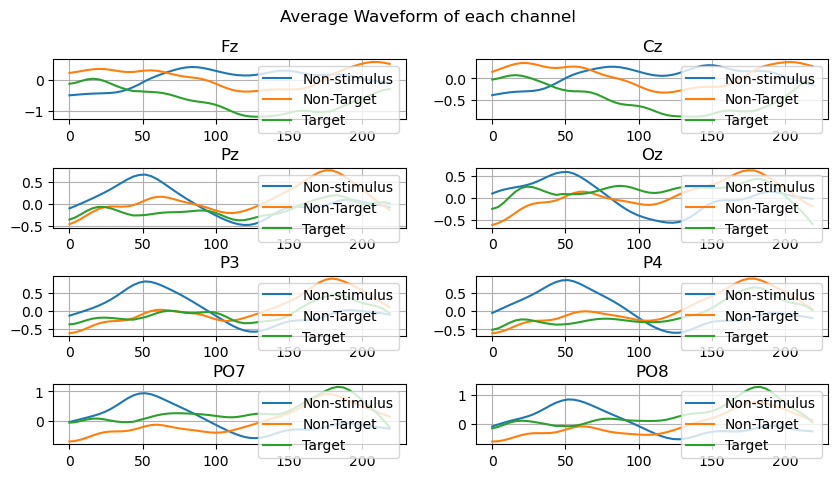

In [44]:
plt.figure(figsize=(10, 10))

seqs = [ np.where(y_nn == i)[0] for i in range(3)]
total_duration = 1000*X_nn.shape[1]/sample_frequency
x_axis = np.linspace(0, total_duration, X_nn.shape[1])

cols = 2
rows = X_nn.shape[-1]/cols
if int(rows) != rows:
    rows = int(rows) + 1
else:
    rows = int(rows)


fig, ax = plt.subplots(rows, cols, figsize=(10, 5))

plt.suptitle("Average Waveform of each channel")
current = 0
for i in range(rows):
    for j in range(cols):
        if current >= len(used_channels):
            break
        ax[i, j].set_title(f'{used_channels[current]}')
        for k in range(len(seqs)):
            c = 'Non-stimulus'
            if k == non_target_class:
                c = 'Non-Target'
            elif k == target_class:
                c = 'Target'
            ax[i, j].plot(x_axis, X_nn[seqs[k], :, current].mean(axis=0), label=c)
        ax[i, j].legend()
        ax[i, j].grid()
        current += 1

plt.subplots_adjust(hspace=0.8)
plt.show()


<Figure size 1000x1000 with 0 Axes>

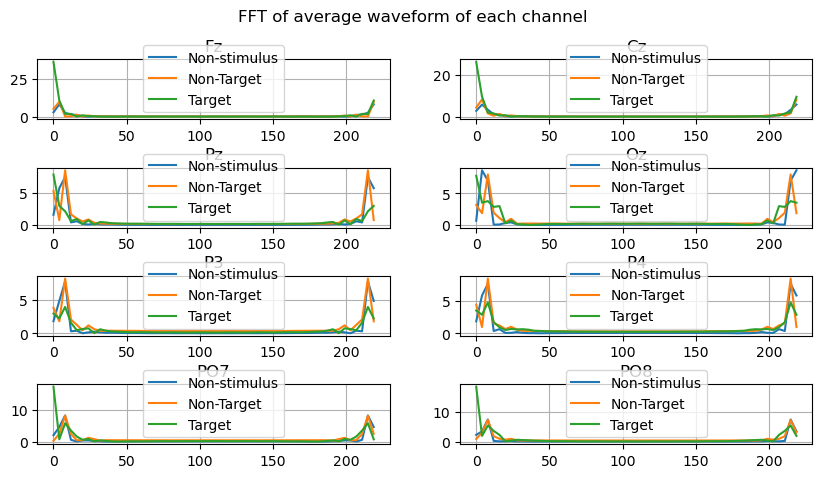

In [45]:
plt.figure(figsize=(10, 10))

seqs = [ np.where(y_nn == i)[0] for i in range(3)]
total_duration = 1000*X_nn.shape[1]/sample_frequency
x_axis = np.linspace(0, total_duration, X_nn.shape[1])

cols = 2
rows = X_nn.shape[-1]/cols
if int(rows) != rows:
    rows = int(rows) + 1
else:
    rows = int(rows)


fig, ax = plt.subplots(rows, cols, figsize=(10, 5))
plt.suptitle("FFT of average waveform of each channel")
current = 0
for i in range(rows):
    for j in range(cols):
        if current >= len(used_channels):
            break
        ax[i, j].set_title(f'{used_channels[current]}')
        for k in range(len(seqs)):
            c = 'Non-stimulus'
            if k == non_target_class:
                c = 'Non-Target'
            elif k == target_class:
                c = 'Target'
            ax[i, j].plot(x_axis, np.abs(fft(X_nn[seqs[k], :, current].mean(axis=0)).real), label=c)
        ax[i, j].legend()
        ax[i, j].grid()
        current += 1

plt.subplots_adjust(hspace=0.8)
plt.show()


### Convert Signal to Frequency

In [46]:
def calculate_stft(x, scale=False, standardize=False, min_frequency=30):

    # Calculate the Short-Time Fourier Transform of the entire dataset
    window_duration = 31.25/1000 # 31.25 ms
    window_size = int(window_duration*sample_frequency)
    overlap = int(window_size * 0.10) # 10% overlap


    X_f, X_t, X_fft = stft(x, fs=sample_frequency, nperseg=window_size, noverlap=overlap, axis=1)
    X_f = np.where(X_f > min_frequency)[0]
    X_fft = X_fft.real.astype('float32')
    X_fft = X_fft[:, :,  X_f, :]
    if scale:
        X_fft = X_fft/ np.max(np.abs(X_nn))
    return X_f, X_t, X_fft

def calculate_fft(x, scale=False, standardize=False, min_frequency=30):
    freq = fftfreq(x.shape[1], 1/sample_frequency)[:x.shape[1]//2]
    points = np.where(freq > min_frequency)[0] #Only gamma frequencies
    freq = freq[points]
    x = np.abs(fft(x[:, points, :], axis=1).real) #* np.repeat(freq[:, np.newaxis], x.shape[-1], axis=1)
    x = x.astype('float32')

    if standardize:
        x = (x - x.mean())/x.std()

    if scale:
        x = x/ np.max(np.abs(x))
    #X_nn = np.log(X_nn)
    # X_nn = X_nn/ np.max(np.abs(X_nn))
    return x

def calculate_wavelet(x, scale=False):
    approx, discr =  pywt.dwt(x, 'db1', axis=1)
    if scale:
        approx = approx/np.max(np.abs(approx))
        discr = discr/np.max(np.abs(discr))
    return approx, discr

# Convert the dataset to frequency
scale = False
standardize = False

# f, t, X_nn = calculate_stft(X_nn, scale=True)
# X_nn = calculate_fft(X_nn)

X_nn = calculate_wavelet(X_nn, scale=True)[0]

<Figure size 1000x500 with 0 Axes>

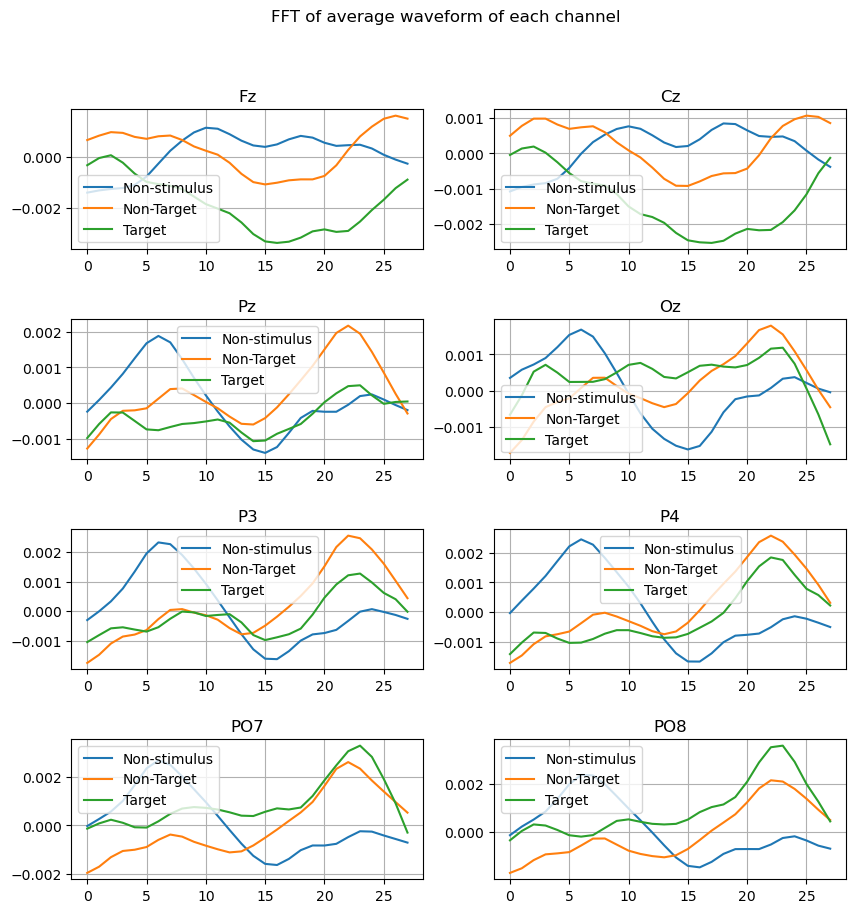

In [47]:
plt.figure(figsize=(10, 5))

seqs = [ np.where(y_nn == i)[0] for i in range(3)]

cols = 2
rows = X_nn.shape[-1]/cols
if int(rows) != rows:
    rows = int(rows) + 1
else:
    rows = int(rows)


fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
plt.suptitle("FFT of average waveform of each channel")
current = 0
for i in range(rows):
    for j in range(cols):
        if current >= len(used_channels):
            break
        ax[i, j].set_title(f'{used_channels[current]}')
        for k in range(len(seqs)):
            c = 'Non-stimulus'
            if k == non_target_class:
                c = 'Non-Target'
            elif k == target_class:
                c = 'Target'
            #ax[i, j].plot(np.abs(fft(X_nn[seqs[k], :, :, current].reshape(len(seqs[k]), -1).mean(axis=0)).real), label=c)
            ax[i, j].plot(X_nn[seqs[k], :, current].mean(axis=0), label=c)
        ax[i, j].legend()
        ax[i, j].grid()
        current += 1

plt.subplots_adjust(hspace=0.5)
plt.show()


### Split Data into train and test set

In [48]:
only_use_two_classes = True # Only classify Stimulus and non-stimulus signals
if only_use_two_classes:
    y_nn[y_nn == target_class] = non_target_class

In [49]:
X_train, X_test, y_train, y_test = train_test_split(X_nn, y_nn, test_size=0.2, random_state=6150)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(53760, 28, 8) (53760,) (13440, 28, 8) (13440,)


In [50]:
X_train = torch.tensor(X_train, requires_grad=False)
X_test = torch.tensor(X_test, requires_grad=False)
y_train = torch.tensor(y_train, requires_grad=False).type(torch.LongTensor)
y_test = torch.tensor(y_test, requires_grad=False).type(torch.LongTensor)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

torch.Size([53760, 28, 8]) torch.Size([13440, 28, 8]) torch.Size([53760]) torch.Size([13440])


#### Input Distribution

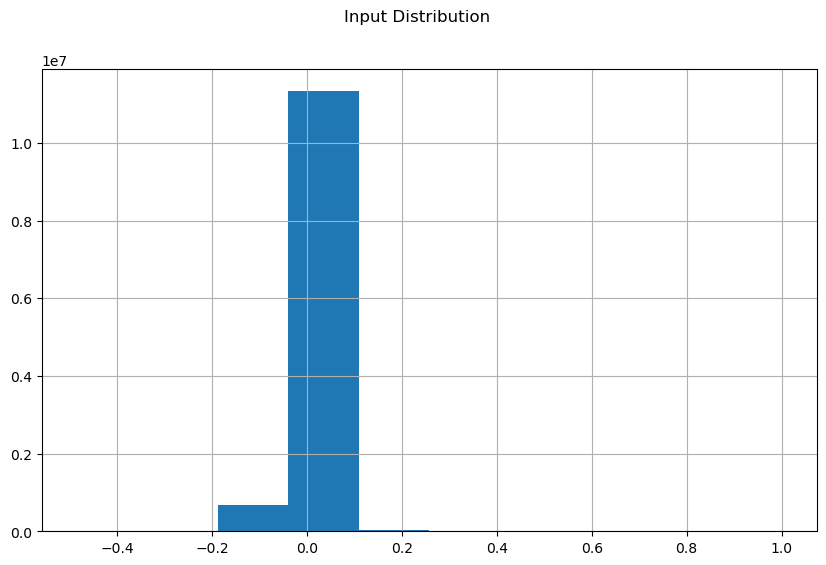

In [51]:
plt.figure(figsize=(10, 6))
plt.suptitle("Input Distribution")
plt.hist(X_train.reshape(-1).detach().numpy())
plt.grid()
plt.show()

### Training Function

In [52]:
@torch.no_grad()
def calculate_accuracy(prediction, true_labels):
    prediction_classes = torch.argmax(prediction, axis=1)
    return (prediction_classes == true_labels).float().mean()

def train(epochs, batch_size, loss_function, optimizer, model, x, y, print_every=200):
    train_accuracy = []
    train_loss = []
    vals = tqdm(range(epochs), desc=f'Epoch: 0, train loss: -, Accuracy: -')
    
    for epoch in vals:
        avg_cost = 0
    
        # Shuffle training data
        dataset = torch.randperm(x.shape[0])
        
        # For each batch
        for batch in range(0, dataset.size()[0], batch_size):
            model.train()
            
            range_end = batch+batch_size
            if range_end + batch_size >= dataset.size()[0]:
                range_end = range_end+batch_size
            # Get train and test data
            x_batch = x[dataset[batch:range_end]]
            y_batch = y[dataset[batch:range_end]]
            
            # Forward pass
            optimizer.zero_grad()
            prediction = model(x_batch)
            
            # Calculate loss
            loss = loss_function(prediction, y_batch)

            # Backpropagation
            loss.backward() # Calculate gradient
            optimizer.step() # Upgrade gradients
        
            # Calculate metrics
            train_loss.append(loss.item())
            train_accuracy.append(calculate_accuracy(prediction, y_batch))
            
            if batch % print_every == 0:
                vals.set_description(f'Epoch: {epoch}, train loss: {train_loss[-1]:.5f}, Accuracy: {train_accuracy[-1]*100:3f}')
                
    return train_loss, train_accuracy

### Create Network - Deep Neural Network

In [53]:
class ModelDNN(torch.nn.Module):
    def __init__(self, sample_x, total_classes, first_layer_neuron=1024, hidden_layers_neurons=[512, ]):
        super(ModelDNN, self).__init__()
        
        # Reshape signal so that it has only two dimenstions: 
        sample_x = self.get_valid_x(sample_x)
        print(f"Layer 1 input: {sample_x.shape}")
        
        # Layer 1- Fully Connected layer
        self.fc1 = torch.nn.Linear(sample_x.shape[-1], first_layer_neuron)
        self.act1 = torch.nn.ReLU()
        self.drop1 = torch.nn.Dropout(0.4)
        
        self.layer1 = torch.nn.Sequential(self.fc1, self.act1, self.drop1)
        
        self.layer1.eval()
        with torch.no_grad():
            out = self.layer1(sample_x)
            print(f"Layer 1 output: {out.shape}")
        self.layer1.train()
        
        self.layers = torch.nn.ModuleList()
        self.layers.append(self.layer1)
        self.activation_layer_name = [type(self.act1).__name__]
        
        # Add additional hidden layers
        for i in range(len(hidden_layers_neurons)):
            hidden_fc = torch.nn.Linear(out.shape[-1], hidden_layers_neurons[i])
            hidden_act = torch.nn.ReLU()
            hidden_drop = torch.nn.Dropout(0.2)
            hidden_layer = torch.nn.Sequential(hidden_fc, hidden_act, hidden_drop)
            
            hidden_layer.eval()
            with torch.no_grad():
                out = hidden_layer(out)
                print(f"Layer {i+2} output: {out.shape}")
            hidden_layer.train()
            self.layers.append(hidden_layer)
            self.activation_layer_name.append(type(hidden_act).__name__)
            
        # Add output layer
        self.out_fc = torch.nn.Linear(out.shape[1], total_classes, bias=False)
        
        self.out_fc.eval()
        with torch.no_grad():
            out = self.out_fc(out)
            print(f"Final output: {out.shape}")
        self.out_fc.train()
        
    def forward(self, x):
        out = self.get_valid_x(x)
        
        for layer in self.layers:
            out = layer(out)
            
        return self.out_fc(out)
            
            
    def get_valid_x(self, x):
        if len(x.shape) > 2:
            x = x.reshape((x.shape[0], -1))
        return x
    
    def show_weight_distribution(self):
        params = []
        for param in self.parameters():
            if len(param.shape) >= 2:
                params.append(param)
        cols = 2
        rows = len(params)/2
        if int(rows) != rows:
            rows = int(rows) + 1
        else:
            rows = int(rows)

        fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
        plt.suptitle("Weight Distribution")

        current = 0
        for i in range(rows):
            for j in range(cols):
                ax[i, j].set_title(f"Param: {current+1}")
                ax[i, j].hist(params[current].detach().numpy().reshape(-1))
                ax[i, j].grid()
                current += 1


        plt.subplots_adjust(hspace=0.5)
        plt.show()
        
    def show_output_distribution(self, x):
        self.eval()
        with torch.no_grad():
            out = self.get_valid_x(x)
            activated_outs = []
            for i in range(len(self.layers)):
                module = self.layers[i]
                for layer in module:
                    out = layer(out)
                    if type(layer).__name__ == self.activation_layer_name[i]:
                        activated_outs.append(out)
                
            cols = 2
            rows = len(activated_outs)/2
            if int(rows) != rows:
                rows = int(rows) + 1
            else:
                rows = int(rows)

            fig, ax = plt.subplots(rows, cols, figsize=(10, 10))
            plt.suptitle("Activated Output distribution")
            
            current = 0
            for i in range(rows):
                for j in range(cols):
                    if current >= len(activated_outs):
                        break
                    ax[i, j].set_title(f"Output: {current+1}")
                    ax[i, j].hist(activated_outs[current].detach().numpy().reshape(-1))
                    ax[i, j].grid()
                    current += 1


            plt.subplots_adjust(hspace=0.5)
            plt.show()
            
            
        self.train()


#### Train Model with MNIST data to test configuration

In [54]:
# Test database - Testing model

d = datasets.load_digits()
X_mnist, y_mnist = (d.images/np.max(d.images)).astype('float32'), d.target

print(X_mnist.shape, y_mnist.shape)

X_mnist_train, X_mnist_test, y_mnist_train, y_mnist_test = train_test_split(X_mnist, y_mnist, test_size=0.2, random_state=6150)
print(X_mnist_train.shape, y_mnist_train.shape, X_mnist_test.shape, y_mnist_test.shape)
X_mnist_train = torch.tensor(X_mnist_train, requires_grad=False)
X_mnist_test = torch.tensor(X_mnist_test, requires_grad=False)
y_mnist_train = torch.tensor(y_mnist_train, requires_grad=False).type(torch.LongTensor)
y_mnist_test = torch.tensor(y_mnist_test, requires_grad=False).type(torch.LongTensor)
print(X_mnist_train.shape, X_mnist_test.shape, y_mnist_train.shape, y_mnist_test.shape)

(1797, 8, 8) (1797,)
(1437, 8, 8) (1437,) (360, 8, 8) (360,)
torch.Size([1437, 8, 8]) torch.Size([360, 8, 8]) torch.Size([1437]) torch.Size([360])


In [55]:
model = ModelDNN(X_mnist_test, np.unique(y_mnist).size, first_layer_neuron=512, hidden_layers_neurons=[128, 64, 32, 16])

Layer 1 input: torch.Size([360, 64])
Layer 1 output: torch.Size([360, 512])
Layer 2 output: torch.Size([360, 128])
Layer 3 output: torch.Size([360, 64])
Layer 4 output: torch.Size([360, 32])
Layer 5 output: torch.Size([360, 16])
Final output: torch.Size([360, 10])


In [56]:
loss, accuracy = train(
    epochs=50, 
    batch_size=32,
    loss_function=torch.nn.CrossEntropyLoss(),
    optimizer=torch.optim.Adam(params=model.parameters(), lr=1e-2),
    model=model,
    x=X_mnist_train,
    y=y_mnist_train,
    print_every=200
)

Epoch: 49, train loss: 0.25129, Accuracy: 93.750000: 100%|█████████████████████████████| 50/50 [00:07<00:00,  7.09it/s]


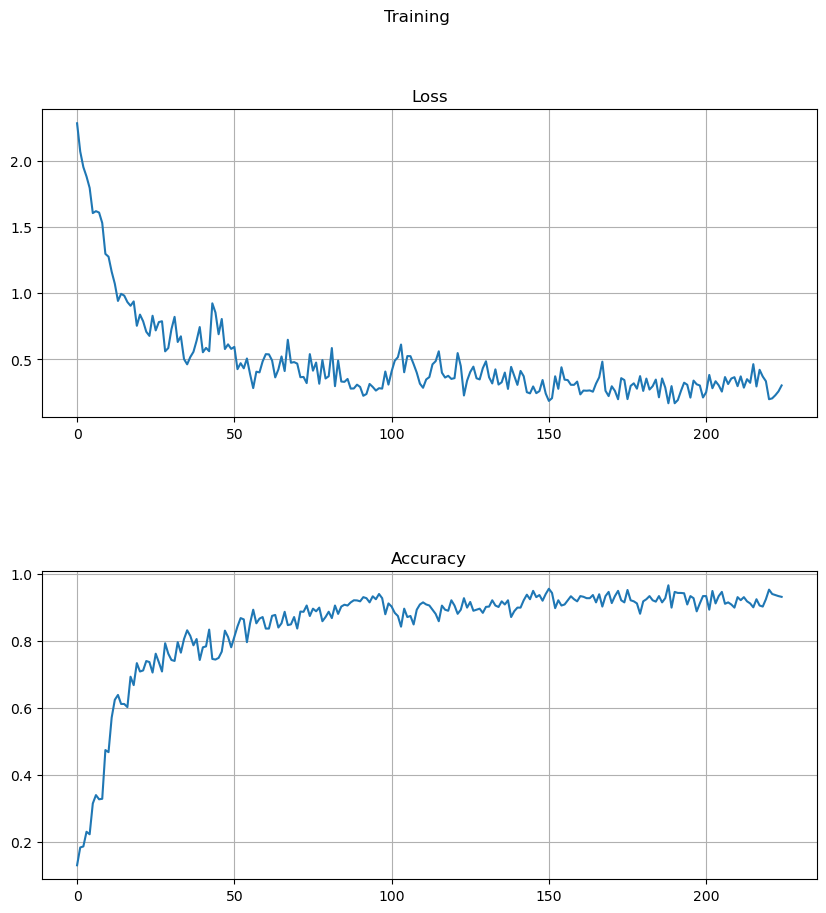

In [57]:
running_mean = 10
plt.figure(figsize=(10, 10))
plt.suptitle("Training")

plt.subplot(2, 1, 1)
plt.title("Loss")
plt.plot(np.array(loss).reshape(-1, running_mean).mean(axis=1))
plt.grid()

plt.subplot(2, 1, 2)
plt.title("Accuracy")
plt.plot(np.array(accuracy).reshape(-1, running_mean).mean(axis=1))

plt.grid()

plt.subplots_adjust(hspace=0.5)

plt.show()

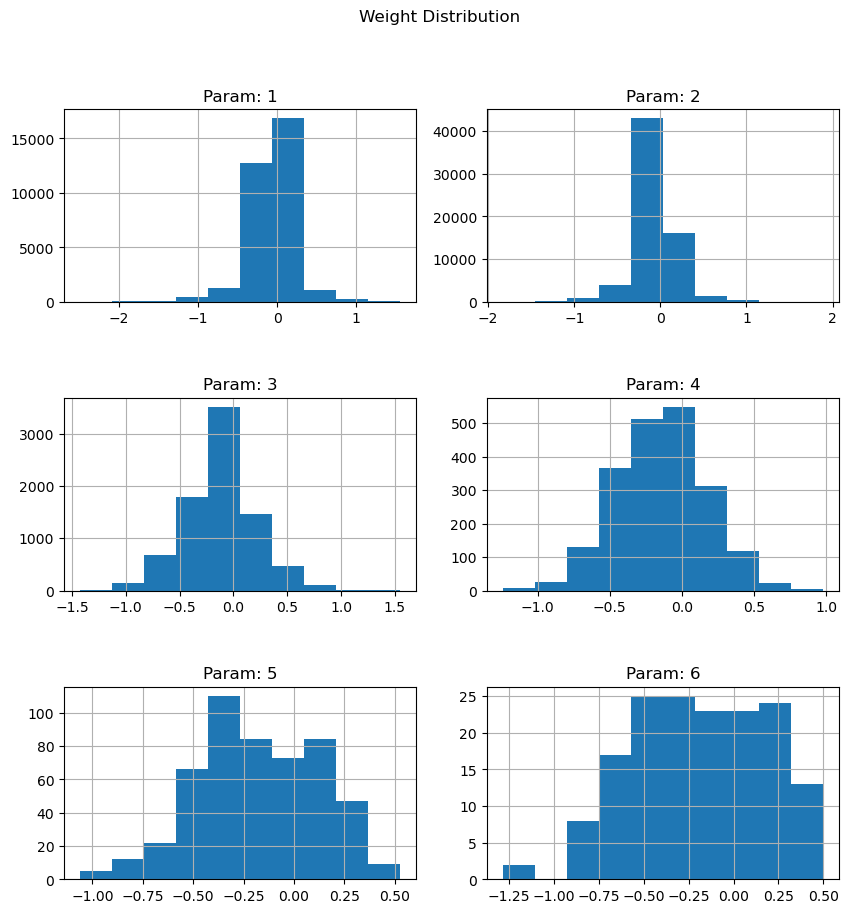

In [58]:
model.show_weight_distribution()

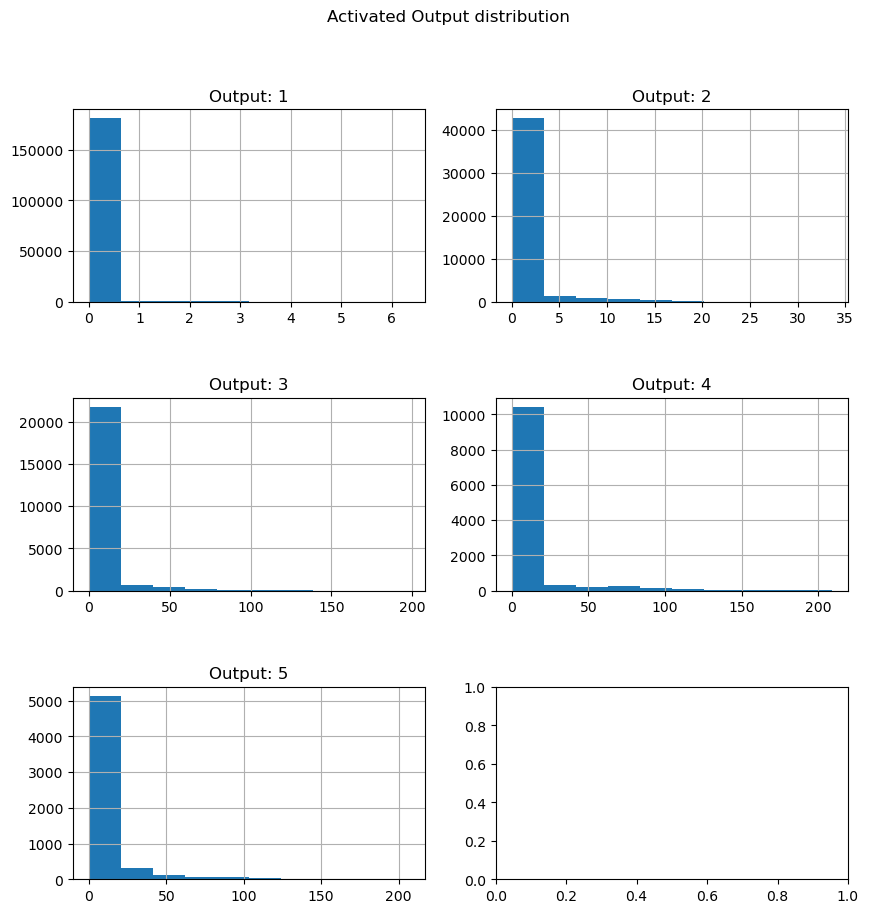

In [59]:
model.show_output_distribution(X_mnist_test)

#### Train Model with actual data - Waveform

- Input: Waveform of shape (n, m, c) where 'n' is the number of samples, 'm' is the length of each waveform, and 'c' is the number of channels used

- Target Class: Non-Stimulus (0), Stimulus (1)

- Model: Deep Neural Network

In [60]:
# Reshape waveform to only keep the channel dimension and the number of samples
additional_duration_of_waveform = 50 #ms
additional_samples = int(sample_frequency * additional_duration_of_waveform / 1000)

all_channels = [get_channel_name(patient_data[0], current)[0] for current in range(X.shape[-1])]
#used_channels = ['PO7', 'PO8', 'Fz', 'Oz', 'Cz']
used_channels = all_channels.copy()

# Get dataset
X_nn, y_nn = create_dataset(X, y_target, show_progress=True, get_delayed_samples=additional_samples)
X_nn = X_nn[:, :, [all_channels.index(channel) for channel in used_channels]]

X_nn = X_nn.astype('float32')
# X_nn = X_nn/np.max(np.abs(X_nn))
y_nn = y_nn.astype('int32')
print(X_nn.shape, y_nn.shape)


# Only classify Stimulus and non-stimulus signals
only_use_two_classes = True
if only_use_two_classes:
    y_nn[y_nn == target_class] = non_target_class

# Get train and test dataset
X_train, X_test, y_train, y_test = train_test_split(X_nn, y_nn, test_size=0.2, random_state=6150)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Convert dataset to tensor
X_train = torch.tensor(X_train, requires_grad=False)
X_test = torch.tensor(X_test, requires_grad=False)
y_train = torch.tensor(y_train, requires_grad=False).type(torch.LongTensor)
y_test = torch.tensor(y_test, requires_grad=False).type(torch.LongTensor)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

100%|████████████████████████████████████████████████████████████████████████| 67200/67200 [00:00<00:00, 123301.82it/s]


(67200, 56, 8) (67200,)
(53760, 56, 8) (53760,) (13440, 56, 8) (13440,)
torch.Size([53760, 56, 8]) torch.Size([13440, 56, 8]) torch.Size([53760]) torch.Size([13440])


In [61]:
print(f"Mean of the amplitude of signal is {X_nn.mean():.5f}")
print(f"Standard Deviation of the amplitude of signal is {X_nn.std():.5f}")

Mean of the amplitude of signal is 0.03491
Standard Deviation of the amplitude of signal is 9.53975


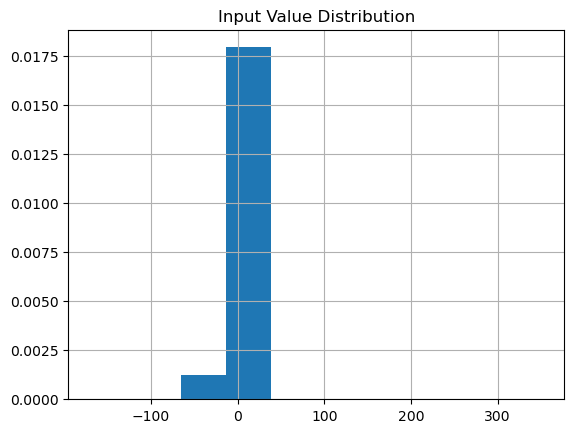

In [62]:
plt.figure()
plt.title("Input Value Distribution")
plt.hist(X_nn.reshape(-1), density=True)
plt.grid()
plt.show()

In [1014]:
model = ModelDNN(X_test, np.unique(y_nn).size, first_layer_neuron=512, hidden_layers_neurons=[128, 64, 32, 16])
loss, accuracy = train(
    epochs=10, 
    batch_size=32,
    loss_function=torch.nn.CrossEntropyLoss(),
    optimizer=torch.optim.Adam(params=model.parameters(), lr=1e-2),
    model=model,
    x=X_train,
    y=y_train,
    print_every=200
)

Layer 1 input: torch.Size([13440, 448])
Layer 1 output: torch.Size([13440, 512])
Layer 2 output: torch.Size([13440, 128])
Layer 3 output: torch.Size([13440, 64])
Layer 4 output: torch.Size([13440, 32])
Layer 5 output: torch.Size([13440, 16])
Final output: torch.Size([13440, 2])


Epoch: 9, train loss: 0.69315, Accuracy: 43.750000: 100%|██████████████████████████████| 10/10 [01:07<00:00,  6.77s/it]


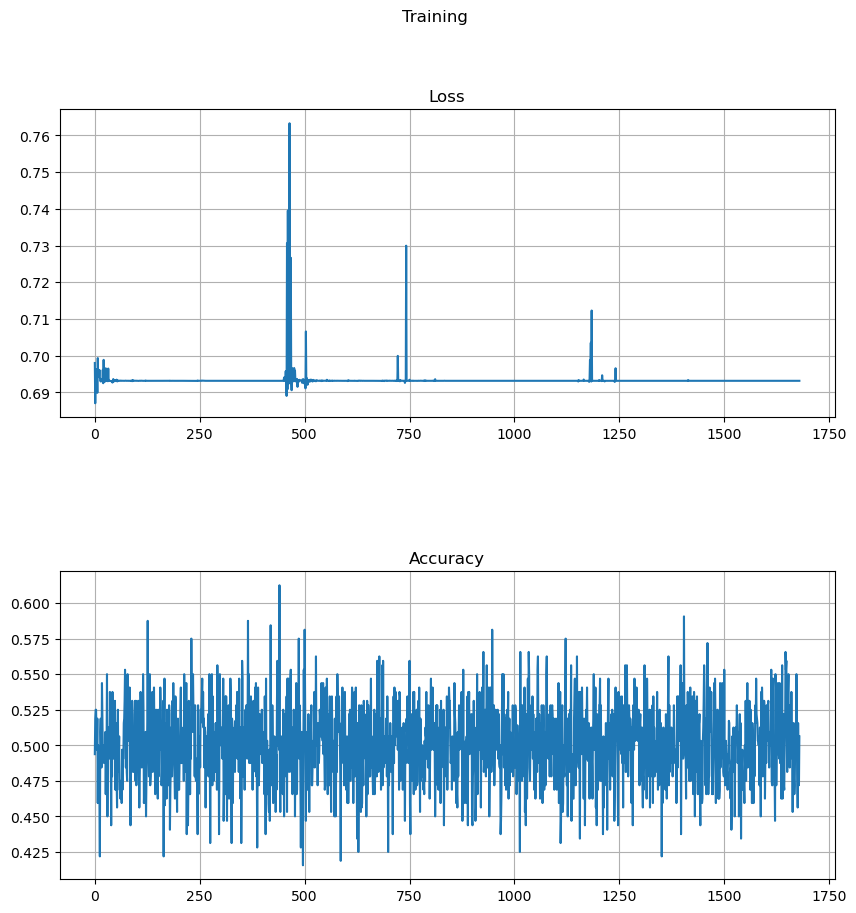

In [1015]:
running_mean = 10
plt.figure(figsize=(10, 10))
plt.suptitle("Training")

plt.subplot(2, 1, 1)
plt.title("Loss")
plt.plot(np.array(loss).reshape(-1, running_mean).mean(axis=1))
plt.grid()

plt.subplot(2, 1, 2)
plt.title("Accuracy")
plt.plot(np.array(accuracy).reshape(-1, running_mean).mean(axis=1))

plt.grid()

plt.subplots_adjust(hspace=0.5)

plt.show()

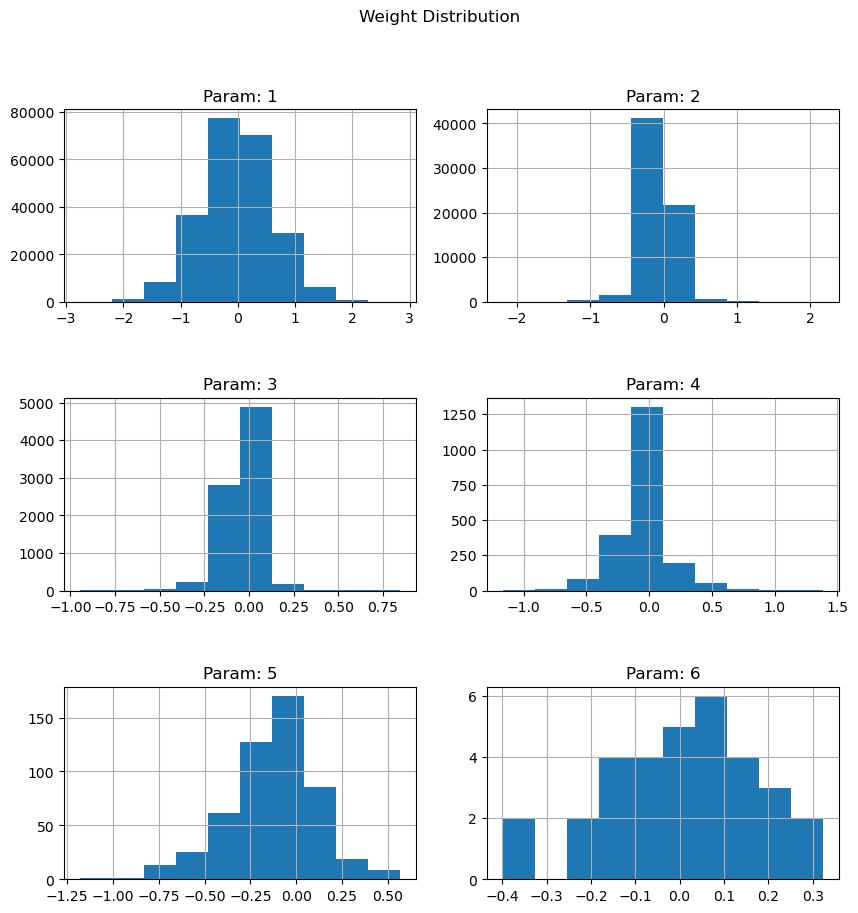

In [1016]:
model.show_weight_distribution()

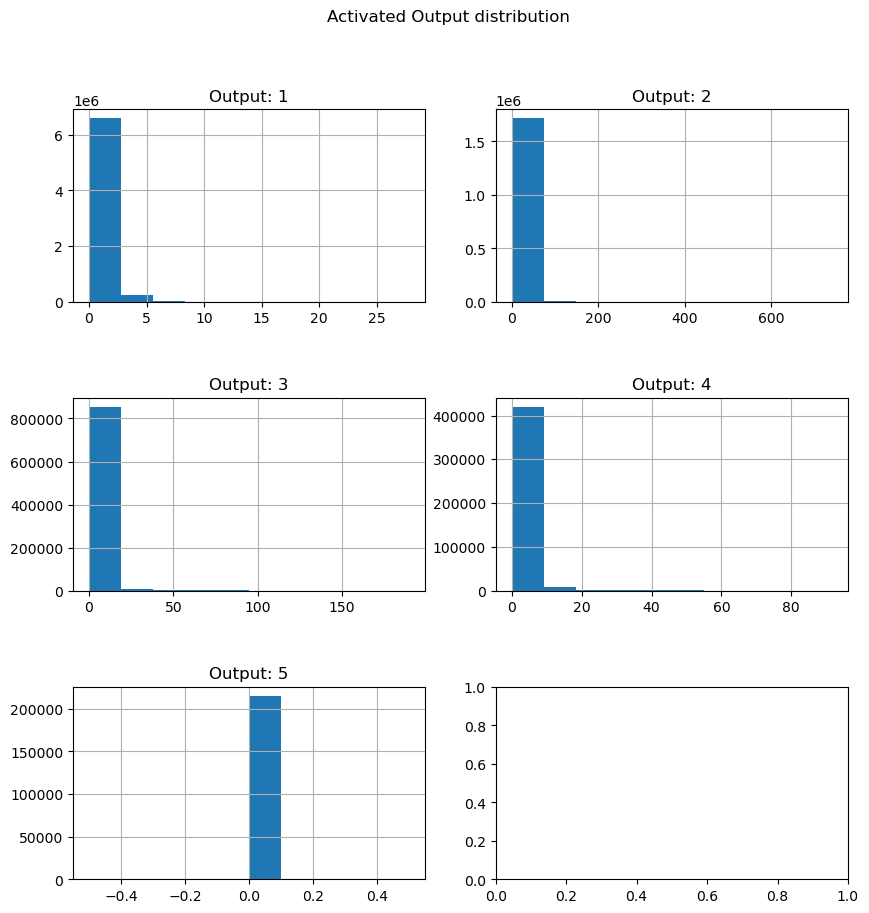

In [1017]:
model.show_output_distribution(X_test)

#### Train Model with actual data - Frequency

- Input: Waveform of shape (n, m, c) where 'n' is the number of samples, 'm' is the weighted absolute real value of fourier coefficient, and 'c' is the number of channels used
- Minimum Frequency Band: 30 Hz
- Target Class: Non-Stimulus (0), Stimulus (1)

- Model: Deep Neural Network

In [1006]:
# Reshape waveform to only keep the channel dimension and the number of samples
additional_duration_of_waveform = 50 #ms
additional_samples = int(sample_frequency * additional_duration_of_waveform / 1000)

all_channels = [get_channel_name(patient_data[0], current)[0] for current in range(X.shape[-1])]
#used_channels = ['PO7', 'PO8', 'Fz', 'Oz', 'Cz']
used_channels = all_channels.copy()

# Get dataset
X_nn, y_nn = create_dataset(X, y_target, show_progress=True, get_delayed_samples=additional_samples)
X_nn = X_nn[:, :, [all_channels.index(channel) for channel in used_channels]]


y_nn = y_nn.astype('int32')
print(X_nn.shape, y_nn.shape)

# Calculate Fourier coefficients
freq = fftfreq(X_nn.shape[1], 1/sample_frequency)[:X_nn.shape[1]//2]
points = np.where(freq > 30)[0] #Only gamma frequencies
freq = freq[points]
X_nn = np.abs(fft(X_nn, axis=1).real[:, points, :]) #calculate_fft(X_nn,scale=True, standardize=False, min_frequency=30)
X_nn = X_nn/np.max(X_nn)
X_nn = X_nn * np.repeat(freq[:, np.newaxis], X_nn.shape[-1], axis=1)
X_nn = X_nn.astype('float32')

# Only classify Stimulus and non-stimulus signals
only_use_two_classes = True
if only_use_two_classes:
    y_nn[y_nn == target_class] = non_target_class

# Get train and test dataset
X_train, X_test, y_train, y_test = train_test_split(X_nn, y_nn, test_size=0.2, random_state=6150)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Convert dataset to tensor
X_train = torch.tensor(X_train, requires_grad=False)
X_test = torch.tensor(X_test, requires_grad=False)
y_train = torch.tensor(y_train, requires_grad=False).type(torch.LongTensor)
y_test = torch.tensor(y_test, requires_grad=False).type(torch.LongTensor)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

100%|████████████████████████████████████████████████████████████████████████| 67200/67200 [00:00<00:00, 127994.28it/s]


(67200, 56, 8) (67200,)
(53760, 21, 8) (53760,) (13440, 21, 8) (13440,)
torch.Size([53760, 21, 8]) torch.Size([13440, 21, 8]) torch.Size([53760]) torch.Size([13440])


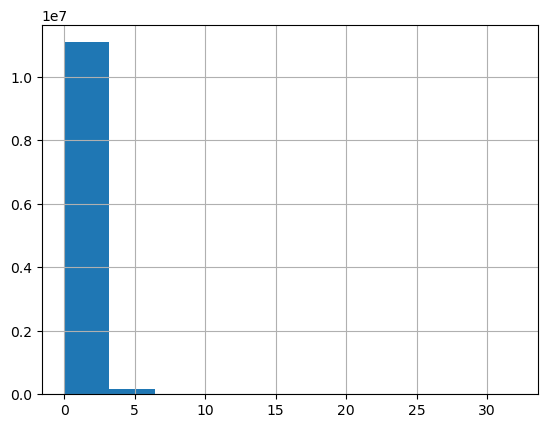

In [1007]:
plt.figure()
plt.hist(X_nn.reshape(-1))
plt.grid()
plt.show()

In [1008]:
model = ModelDNN(X_test, np.unique(y_nn).size, first_layer_neuron=512, hidden_layers_neurons=[128, 64, 32, 16])
loss, accuracy = train(
    epochs=10, 
    batch_size=32,
    loss_function=torch.nn.CrossEntropyLoss(),
    optimizer=torch.optim.Adam(params=model.parameters(), lr=1e-2),
    model=model,
    x=X_train,
    y=y_train,
    print_every=200
)

Layer 1 input: torch.Size([13440, 168])
Layer 1 output: torch.Size([13440, 512])
Layer 2 output: torch.Size([13440, 128])
Layer 3 output: torch.Size([13440, 64])
Layer 4 output: torch.Size([13440, 32])
Layer 5 output: torch.Size([13440, 16])
Final output: torch.Size([13440, 2])


Epoch: 7, train loss: 0.69315, Accuracy: 37.500000:  70%|█████████████████████▋         | 7/10 [00:42<00:18,  6.08s/it]


KeyboardInterrupt: 

In [ ]:
running_mean = 10
plt.figure(figsize=(10, 10))
plt.suptitle("Training")

plt.subplot(2, 1, 1)
plt.title("Loss")
plt.plot(np.array(loss).reshape(-1, running_mean).mean(axis=1))
plt.grid()

plt.subplot(2, 1, 2)
plt.title("Accuracy")
plt.plot(np.array(accuracy).reshape(-1, running_mean).mean(axis=1))

plt.grid()

plt.subplots_adjust(hspace=0.5)

plt.show()

In [ ]:
model.show_weight_distribution()

In [ ]:
model.show_output_distribution(X_test)

# References:

1\. G. Pfurtscheller,

Functional brain imaging based on ERD/ERS,

Vision Research,

Volume 41, Issues 10–11,

2001,

Pages 1257-1260,

ISSN 0042-6989,

https://doi.org/10.1016/S0042-6989(00)00235-2.

(https://www.sciencedirect.com/science/article/pii/S0042698900002352)

Abstract: Sensory, cognitive and motor processing can result in changes of the ongoing EEG in form of an event-related desynchronization (ERD) or event-related synchronization (ERS). Both phenomena are time-locked but not phase-locked to the event and they are highly frequency-band specific. The ERD is interpreted as a correlate of an activated cortical area with increased excitability and the ERS in the alpha and lower beta bands can be interpreted, at least under certain circumstances, as a correlate of a deactivated cortical area. Spatial mapping of ERD/ERS can be used to study the dynamics of cortical activation patterns. Examples from a movement task are reported.
Keywords: Event-related desynchronization (ERD); Event-related synchronization (ERS); Sensorimotor function; Voluntary movement; Brain oscillations